# **Airfare Trends Analysis & Ticket Pricing Prediction**

___


## **Importing Libraries, Packages, Modules**

### Importing Libraries

In [1]:
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import plotly.graph_objs as go
import plotly.subplots as sp
from plotly.subplots import make_subplots
import plotly.express as px
import folium
from folium import plugins

### Importing Essential Packages and required modules

In [2]:
from sklearn.preprocessing import LabelEncoder # LabelEncode ordinal Categorical feature

from sklearn.feature_selection import SelectKBest #  for Chi2, ANNOVA test
from sklearn.feature_selection import chi2, mutual_info_classif # Chi2 Test
from sklearn.feature_selection import f_classif # ANOVA test

from sklearn.model_selection import train_test_split # Split dataset to Train, Test & Val set
from sklearn.preprocessing import StandardScaler # to Scale independent features


from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error # evaluation of Model 
import statsmodels.api as sm  #evaluation of model

# Regressor models
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import  AdaBoostRegressor
import xgboost as xgb

from sklearn.model_selection import cross_val_score, KFold # Crossvalidation

from sklearn.model_selection import RandomizedSearchCV # to search Best tuning parameters 



___
**Notebook Settings**

In [3]:
%matplotlib inline
warnings.simplefilter('ignore')
#pd.set_option('display.max_rows', None)
#pd.reset_option('display.max_rows')
pd.set_option('display.max_columns', None)
#pd.reset_option('display.max_columns')

---
### Problem Statement
* The aviation industry in India is witnessing rapid growth, with multiple airlines operating flights across various cities. However, the prices of air tickets are highly dynamic, influenced by a multitude of factors such as demand, timing, airline reputation, and more. For both airlines and passengers, predicting these prices with accuracy is crucial for maximizing revenue and ensuring affordability.
* ***This project aims to develop a robust machine learning model that accurately predicts the air ticket prices for flights*** within India. By ***analyzing data from different airlines and flights between various cities, the model will identify key factors affecting ticket pricing and provide insights to enhance decision-making processes*** for stakeholders.

### **Dataset**

#### Loading Dataset

In [4]:
df = pd.read_excel(r"E:\Advance DS and AI\Project Placement\Airfare trends Analysis & Ticket Pricing Prediction\Data - Airfare trends Analysis & Ticket Pricing Prediction.xlsx")

___
#### About Dataset Features
1. Airline- The name of the airline company
2. Date_of_Journey- The date on which the journey happened
3. Source- The city of the departure of the flight
4. Destination- The destination city/airport
5. Route- The route of the flight from where to where
6. Dep_Time- The departure time of the flight
7. Arrival_Time- The time of the arrival of the flight to the destination
8. Duration- The duration of the flight
9. Total_Stops- Total number of stops during the journey
10. Additional_Info- Extra/Additional information regarding flight/travel
11. Price- The price of the ticket for a single journey


___
## **Exploratory Data Analysis**
### Initial overview

In [5]:
df

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price
0,IndiGo,24/03/2019,Banglore,New Delhi,BLR → DEL,22:20,01:10 22 Mar,2h 50m,non-stop,Null,3897
1,Air India,1/05/2019,Kolkata,Banglore,CCU → IXR → BBI → BLR,05:50,13:15,7h 25m,2 stops,Null,7662
2,Jet Airways,9/06/2019,Delhi,Cochin,DEL → LKO → BOM → COK,09:25,04:25 10 Jun,19h,2 stops,Null,13882
3,IndiGo,12/05/2019,Kolkata,Banglore,CCU → NAG → BLR,18:05,23:30,5h 25m,1 stop,Null,6218
4,IndiGo,01/03/2019,Banglore,New Delhi,BLR → NAG → DEL,16:50,21:35,4h 45m,1 stop,Null,13302
...,...,...,...,...,...,...,...,...,...,...,...
10678,Air Asia,9/04/2019,Kolkata,Banglore,CCU → BLR,19:55,22:25,2h 30m,non-stop,Null,4107
10679,Air India,27/04/2019,Kolkata,Banglore,CCU → BLR,20:45,23:20,2h 35m,non-stop,Null,4145
10680,Jet Airways,27/04/2019,Banglore,Delhi,BLR → DEL,08:20,11:20,3h,non-stop,Null,7229
10681,Vistara,01/03/2019,Banglore,New Delhi,BLR → DEL,11:30,14:10,2h 40m,non-stop,Null,12648


In [6]:
df.columns

Index(['Airline', 'Date_of_Journey', 'Source', 'Destination', 'Route',
       'Dep_Time', 'Arrival_Time', 'Duration', 'Total_Stops',
       'Additional_Info', 'Price'],
      dtype='object')

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10683 entries, 0 to 10682
Data columns (total 11 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   Airline          10683 non-null  object
 1   Date_of_Journey  10683 non-null  object
 2   Source           10683 non-null  object
 3   Destination      10683 non-null  object
 4   Route            10682 non-null  object
 5   Dep_Time         10683 non-null  object
 6   Arrival_Time     10683 non-null  object
 7   Duration         10683 non-null  object
 8   Total_Stops      10682 non-null  object
 9   Additional_Info  10683 non-null  object
 10  Price            10683 non-null  int64 
dtypes: int64(1), object(10)
memory usage: 918.2+ KB


In [8]:
df.describe()

,Price
count,10683.000000
mean,9087.064121
std,4611.359167
min,1759.000000
25%,5277.000000
50%,8372.000000
75%,12373.000000
max,79512.000000


In [9]:
df.describe(include='object')

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info
count,10683,10683,10683,10683,10682,10683,10683,10683,10682,10683
unique,12,44,5,6,128,222,1343,368,5,10
top,Jet Airways,18/05/2019,Delhi,Cochin,DEL → BOM → COK,18:55,19:00,2h 50m,1 stop,Null
freq,3849,504,4537,4537,2376,233,423,550,5625,8347


In [10]:
df.duplicated().sum()

220

In [11]:
df.drop_duplicates(inplace=True)

In [12]:
df.shape

(10463, 11)

In [13]:
df.isna().sum()

Airline            0
Date_of_Journey    0
Source             0
Destination        0
Route              1
Dep_Time           0
Arrival_Time       0
Duration           0
Total_Stops        1
Additional_Info    0
Price              0
dtype: int64

In [14]:
for i in df.columns:
    print(f"{i} Unique value counts :{df[i].nunique()}  \n {df[i].unique()}")
    print('___'*30)

Airline Unique value counts :12  
 ['IndiGo' 'Air India' 'Jet Airways' 'SpiceJet' 'Multiple carriers' 'GoAir'
 'Vistara' 'Air Asia' 'Vistara Premium economy' 'Jet Airways Business'
 'Multiple carriers Premium economy' 'Trujet']
__________________________________________________________________________________________
Date_of_Journey Unique value counts :44  
 ['24/03/2019' '1/05/2019' '9/06/2019' '12/05/2019' '01/03/2019'
 '24/06/2019' '12/03/2019' '27/05/2019' '1/06/2019' '18/04/2019'
 '9/05/2019' '24/04/2019' '3/03/2019' '15/04/2019' '12/06/2019'
 '6/03/2019' '21/03/2019' '3/04/2019' '6/05/2019' '15/05/2019'
 '18/06/2019' '15/06/2019' '6/04/2019' '18/05/2019' '27/06/2019'
 '21/05/2019' '06/03/2019' '3/06/2019' '15/03/2019' '3/05/2019'
 '9/03/2019' '6/06/2019' '24/05/2019' '09/03/2019' '1/04/2019'
 '21/04/2019' '21/06/2019' '27/03/2019' '18/03/2019' '12/04/2019'
 '9/04/2019' '1/03/2019' '03/03/2019' '27/04/2019']
________________________________________________________________________

In [15]:
for i in df.columns:
    print(f"{i} value counts : \n{df[i].value_counts()}")
    print('___'*30)

Airline value counts : 
Jet Airways                          3700
IndiGo                               2043
Air India                            1695
Multiple carriers                    1196
SpiceJet                              815
Vistara                               478
Air Asia                              319
GoAir                                 194
Multiple carriers Premium economy      13
Jet Airways Business                    6
Vistara Premium economy                 3
Trujet                                  1
Name: Airline, dtype: int64
__________________________________________________________________________________________
Date_of_Journey value counts : 
6/06/2019     490
18/05/2019    486
9/06/2019     485
12/06/2019    483
21/05/2019    482
9/05/2019     466
21/03/2019    412
15/05/2019    402
27/05/2019    369
27/06/2019    339
24/06/2019    330
1/06/2019     330
3/06/2019     326
15/06/2019    314
24/03/2019    314
6/03/2019     302
27/03/2019    290
24/05/2019    2

In [16]:
df.isna().sum()

Airline            0
Date_of_Journey    0
Source             0
Destination        0
Route              1
Dep_Time           0
Arrival_Time       0
Duration           0
Total_Stops        1
Additional_Info    0
Price              0
dtype: int64

___
#### Handeling Missing Value

In [17]:
df[df['Route'].isna()]

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price
9039,Air India,6/05/2019,Delhi,Cochin,NaN,09:45,09:25 07 May,23h 40m,NaN,Null,7480


In [18]:
df[(df['Source']=='Delhi') &  (df['Destination']=='Cochin') & (df['Price']==7480)]

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price
1213,Air India,21/05/2019,Delhi,Cochin,DEL → MAA → COK,20:40,09:25 22 May,12h 45m,1 stop,Null,7480
1567,Air India,27/06/2019,Delhi,Cochin,DEL → MAA → COK,20:40,09:25 28 Jun,12h 45m,1 stop,Null,7480
1595,Air India,18/05/2019,Delhi,Cochin,DEL → MAA → COK,20:40,09:25 19 May,12h 45m,1 stop,Null,7480
1616,Air India,24/05/2019,Delhi,Cochin,DEL → MAA → COK,09:45,09:25 25 May,23h 40m,1 stop,Null,7480
1725,Air India,27/05/2019,Delhi,Cochin,DEL → MAA → COK,17:20,09:25 28 May,16h 5m,1 stop,Null,7480
2554,Air India,15/05/2019,Delhi,Cochin,DEL → MAA → COK,09:45,09:25 16 May,23h 40m,1 stop,Null,7480
2842,Air India,1/05/2019,Delhi,Cochin,DEL → MAA → COK,20:40,09:25 02 May,12h 45m,1 stop,Null,7480
2862,Air India,21/05/2019,Delhi,Cochin,DEL → MAA → COK,17:20,09:25 22 May,16h 5m,1 stop,Null,7480
2927,Air India,27/05/2019,Delhi,Cochin,DEL → MAA → COK,06:05,09:25 28 May,27h 20m,1 stop,Null,7480
3341,Air India,27/06/2019,Delhi,Cochin,DEL → MAA → COK,17:20,09:25 28 Jun,16h 5m,1 stop,Null,7480


In [19]:
df['Route'] = df['Route'].fillna('DEL → MAA → COK')
df['Total_Stops'] = df['Total_Stops'].fillna('1 stop')

In [20]:
df.isna().sum()

Airline            0
Date_of_Journey    0
Source             0
Destination        0
Route              0
Dep_Time           0
Arrival_Time       0
Duration           0
Total_Stops        0
Additional_Info    0
Price              0
dtype: int64

In [21]:
df.duplicated().sum()

0

In [22]:
df

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price
0,IndiGo,24/03/2019,Banglore,New Delhi,BLR → DEL,22:20,01:10 22 Mar,2h 50m,non-stop,Null,3897
1,Air India,1/05/2019,Kolkata,Banglore,CCU → IXR → BBI → BLR,05:50,13:15,7h 25m,2 stops,Null,7662
2,Jet Airways,9/06/2019,Delhi,Cochin,DEL → LKO → BOM → COK,09:25,04:25 10 Jun,19h,2 stops,Null,13882
3,IndiGo,12/05/2019,Kolkata,Banglore,CCU → NAG → BLR,18:05,23:30,5h 25m,1 stop,Null,6218
4,IndiGo,01/03/2019,Banglore,New Delhi,BLR → NAG → DEL,16:50,21:35,4h 45m,1 stop,Null,13302
...,...,...,...,...,...,...,...,...,...,...,...
10678,Air Asia,9/04/2019,Kolkata,Banglore,CCU → BLR,19:55,22:25,2h 30m,non-stop,Null,4107
10679,Air India,27/04/2019,Kolkata,Banglore,CCU → BLR,20:45,23:20,2h 35m,non-stop,Null,4145
10680,Jet Airways,27/04/2019,Banglore,Delhi,BLR → DEL,08:20,11:20,3h,non-stop,Null,7229
10681,Vistara,01/03/2019,Banglore,New Delhi,BLR → DEL,11:30,14:10,2h 40m,non-stop,Null,12648


___

In [23]:
original = df.copy()

---
## **Feature Engineering**

___
#### ChiSquare Test

In [24]:
original

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price
0,IndiGo,24/03/2019,Banglore,New Delhi,BLR → DEL,22:20,01:10 22 Mar,2h 50m,non-stop,Null,3897
1,Air India,1/05/2019,Kolkata,Banglore,CCU → IXR → BBI → BLR,05:50,13:15,7h 25m,2 stops,Null,7662
2,Jet Airways,9/06/2019,Delhi,Cochin,DEL → LKO → BOM → COK,09:25,04:25 10 Jun,19h,2 stops,Null,13882
3,IndiGo,12/05/2019,Kolkata,Banglore,CCU → NAG → BLR,18:05,23:30,5h 25m,1 stop,Null,6218
4,IndiGo,01/03/2019,Banglore,New Delhi,BLR → NAG → DEL,16:50,21:35,4h 45m,1 stop,Null,13302
...,...,...,...,...,...,...,...,...,...,...,...
10678,Air Asia,9/04/2019,Kolkata,Banglore,CCU → BLR,19:55,22:25,2h 30m,non-stop,Null,4107
10679,Air India,27/04/2019,Kolkata,Banglore,CCU → BLR,20:45,23:20,2h 35m,non-stop,Null,4145
10680,Jet Airways,27/04/2019,Banglore,Delhi,BLR → DEL,08:20,11:20,3h,non-stop,Null,7229
10681,Vistara,01/03/2019,Banglore,New Delhi,BLR → DEL,11:30,14:10,2h 40m,non-stop,Null,12648


In [25]:
original.columns

Index(['Airline', 'Date_of_Journey', 'Source', 'Destination', 'Route',
       'Dep_Time', 'Arrival_Time', 'Duration', 'Total_Stops',
       'Additional_Info', 'Price'],
      dtype='object')

In [26]:
cat_fet = original[['Airline', 'Source', 'Destination', 'Route','Total_Stops','Additional_Info']]

In [27]:
cat_fet

,Airline,Source,Destination,Route,Total_Stops,Additional_Info
0,IndiGo,Banglore,New Delhi,BLR → DEL,non-stop,Null
1,Air India,Kolkata,Banglore,CCU → IXR → BBI → BLR,2 stops,Null
2,Jet Airways,Delhi,Cochin,DEL → LKO → BOM → COK,2 stops,Null
3,IndiGo,Kolkata,Banglore,CCU → NAG → BLR,1 stop,Null
4,IndiGo,Banglore,New Delhi,BLR → NAG → DEL,1 stop,Null
...,...,...,...,...,...,...
10678,Air Asia,Kolkata,Banglore,CCU → BLR,non-stop,Null
10679,Air India,Kolkata,Banglore,CCU → BLR,non-stop,Null
10680,Jet Airways,Banglore,Delhi,BLR → DEL,non-stop,Null
10681,Vistara,Banglore,New Delhi,BLR → DEL,non-stop,Null


In [28]:
# LabelEncoding Cat_fet
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()

# Apply LabelEncoder to each categorical column
for col in cat_fet:
    cat_fet[col] = le.fit_transform(cat_fet[col])
    
for col in cat_fet:
    cat_fet[col] = cat_fet[col] + 1

In [29]:
# Chi-Square Test
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2, mutual_info_classif

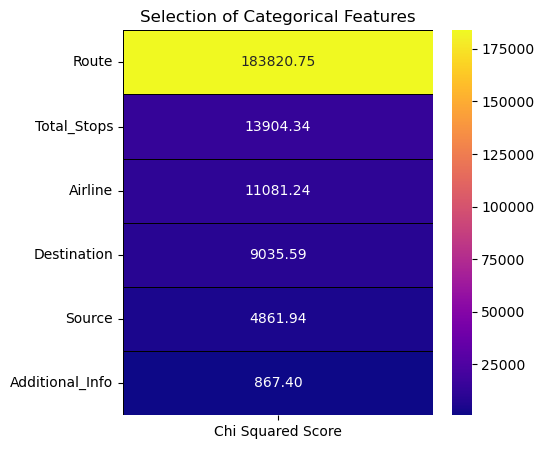

In [30]:
#Chi-Square Test :
features = cat_fet # char
target = original['Price'] # cat
best_features = SelectKBest(score_func = chi2, k='all')
fit = best_features.fit(features, target)

featureScores = pd.DataFrame(data = fit.scores_, index= list(cat_fet.columns),
                             columns = ['Chi Squared Score'])

plt.subplots(figsize=(5,5))
sns.heatmap(featureScores.sort_values(ascending = False, by = 'Chi Squared Score'),
            annot=True, cmap = 'plasma', linewidths = 0.4, linecolor = 'black', fmt = '.2f');
plt.title('Selection of Categorical Features')
plt.show()

* We can drop Additional_Info feature

___
### Date of Journey feature

In [31]:
df['Date_of_Journey'].nunique(),df['Date_of_Journey'].unique()

(44,
 array(['24/03/2019', '1/05/2019', '9/06/2019', '12/05/2019', '01/03/2019',
        '24/06/2019', '12/03/2019', '27/05/2019', '1/06/2019',
        '18/04/2019', '9/05/2019', '24/04/2019', '3/03/2019', '15/04/2019',
        '12/06/2019', '6/03/2019', '21/03/2019', '3/04/2019', '6/05/2019',
        '15/05/2019', '18/06/2019', '15/06/2019', '6/04/2019',
        '18/05/2019', '27/06/2019', '21/05/2019', '06/03/2019',
        '3/06/2019', '15/03/2019', '3/05/2019', '9/03/2019', '6/06/2019',
        '24/05/2019', '09/03/2019', '1/04/2019', '21/04/2019',
        '21/06/2019', '27/03/2019', '18/03/2019', '12/04/2019',
        '9/04/2019', '1/03/2019', '03/03/2019', '27/04/2019'], dtype=object))

In [32]:
# Convert Date_of_Journey to datetime format
df['Date_of_Journey'] = pd.to_datetime(df['Date_of_Journey'], format='%d/%m/%Y')

# Extract day, month, and year
df['Date'] = df['Date_of_Journey'].dt.day
df['Month'] = df['Date_of_Journey'].dt.month
# df['Year'] = df['Date_of_Journey'].dt.year

#Drop Date_of_Journey columns
df.drop(columns='Date_of_Journey',inplace=True)

In [33]:
df

,Airline,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price,Date,Month
0,IndiGo,Banglore,New Delhi,BLR → DEL,22:20,01:10 22 Mar,2h 50m,non-stop,Null,3897,24,3
1,Air India,Kolkata,Banglore,CCU → IXR → BBI → BLR,05:50,13:15,7h 25m,2 stops,Null,7662,1,5
2,Jet Airways,Delhi,Cochin,DEL → LKO → BOM → COK,09:25,04:25 10 Jun,19h,2 stops,Null,13882,9,6
3,IndiGo,Kolkata,Banglore,CCU → NAG → BLR,18:05,23:30,5h 25m,1 stop,Null,6218,12,5
4,IndiGo,Banglore,New Delhi,BLR → NAG → DEL,16:50,21:35,4h 45m,1 stop,Null,13302,1,3
...,...,...,...,...,...,...,...,...,...,...,...,...
10678,Air Asia,Kolkata,Banglore,CCU → BLR,19:55,22:25,2h 30m,non-stop,Null,4107,9,4
10679,Air India,Kolkata,Banglore,CCU → BLR,20:45,23:20,2h 35m,non-stop,Null,4145,27,4
10680,Jet Airways,Banglore,Delhi,BLR → DEL,08:20,11:20,3h,non-stop,Null,7229,27,4
10681,Vistara,Banglore,New Delhi,BLR → DEL,11:30,14:10,2h 40m,non-stop,Null,12648,1,3


In [34]:
df.Date.unique(),df.Month.unique()

(array([24,  1,  9, 12, 27, 18,  3, 15,  6, 21], dtype=int64),
 array([3, 5, 6, 4], dtype=int64))

---
### Dep_Time feature

In [35]:
df['Dep_Time'].value_counts()

18:55    233
17:00    227
07:05    202
07:10    201
10:00    196
        ... 
22:25      1
16:25      1
21:35      1
04:15      1
03:00      1
Name: Dep_Time, Length: 222, dtype: int64

In [36]:
df['Dep_Hour'] = df['Dep_Time'].apply(lambda x: x.split(':')[0]).astype(int)
df['Dep_Minute'] = df['Dep_Time'].apply(lambda x: x.split(':')[1]).astype(int)

In [37]:
df.drop(columns='Dep_Time',inplace=True)

In [38]:
df

,Airline,Source,Destination,Route,Arrival_Time,Duration,Total_Stops,Additional_Info,Price,Date,Month,Dep_Hour,Dep_Minute
0,IndiGo,Banglore,New Delhi,BLR → DEL,01:10 22 Mar,2h 50m,non-stop,Null,3897,24,3,22,20
1,Air India,Kolkata,Banglore,CCU → IXR → BBI → BLR,13:15,7h 25m,2 stops,Null,7662,1,5,5,50
2,Jet Airways,Delhi,Cochin,DEL → LKO → BOM → COK,04:25 10 Jun,19h,2 stops,Null,13882,9,6,9,25
3,IndiGo,Kolkata,Banglore,CCU → NAG → BLR,23:30,5h 25m,1 stop,Null,6218,12,5,18,5
4,IndiGo,Banglore,New Delhi,BLR → NAG → DEL,21:35,4h 45m,1 stop,Null,13302,1,3,16,50
...,...,...,...,...,...,...,...,...,...,...,...,...,...
10678,Air Asia,Kolkata,Banglore,CCU → BLR,22:25,2h 30m,non-stop,Null,4107,9,4,19,55
10679,Air India,Kolkata,Banglore,CCU → BLR,23:20,2h 35m,non-stop,Null,4145,27,4,20,45
10680,Jet Airways,Banglore,Delhi,BLR → DEL,11:20,3h,non-stop,Null,7229,27,4,8,20
10681,Vistara,Banglore,New Delhi,BLR → DEL,14:10,2h 40m,non-stop,Null,12648,1,3,11,30


___
### Arrival_Time feature

In [39]:
df['Arrival_Time'].value_counts()

19:00           412
21:00           360
19:15           333
16:10           154
12:35           122
               ... 
00:50 04 May      1
00:50 02 Jun      1
00:25 02 Jun      1
08:55 13 Mar      1
21:20 13 Mar      1
Name: Arrival_Time, Length: 1343, dtype: int64

In [40]:
df['Arrival_Time'] = df['Arrival_Time'].apply(lambda x: x.split(' ')[0])

In [41]:
df['Arrival_Time'].value_counts()

19:00    590
19:15    533
04:25    512
12:35    408
21:00    360
        ... 
13:10      1
11:15      1
03:40      1
16:00      1
11:35      1
Name: Arrival_Time, Length: 223, dtype: int64

In [42]:
df['Arr_Hour'] = df['Arrival_Time'].apply(lambda x: x.split(':')[0]).astype(int)
df['Arr_Minute'] = df['Arrival_Time'].apply(lambda x: x.split(':')[1]).astype(int)

In [43]:
df.drop(columns='Arrival_Time',inplace=True)

In [44]:
df

,Airline,Source,Destination,Route,Duration,Total_Stops,Additional_Info,Price,Date,Month,Dep_Hour,Dep_Minute,Arr_Hour,Arr_Minute
0,IndiGo,Banglore,New Delhi,BLR → DEL,2h 50m,non-stop,Null,3897,24,3,22,20,1,10
1,Air India,Kolkata,Banglore,CCU → IXR → BBI → BLR,7h 25m,2 stops,Null,7662,1,5,5,50,13,15
2,Jet Airways,Delhi,Cochin,DEL → LKO → BOM → COK,19h,2 stops,Null,13882,9,6,9,25,4,25
3,IndiGo,Kolkata,Banglore,CCU → NAG → BLR,5h 25m,1 stop,Null,6218,12,5,18,5,23,30
4,IndiGo,Banglore,New Delhi,BLR → NAG → DEL,4h 45m,1 stop,Null,13302,1,3,16,50,21,35
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10678,Air Asia,Kolkata,Banglore,CCU → BLR,2h 30m,non-stop,Null,4107,9,4,19,55,22,25
10679,Air India,Kolkata,Banglore,CCU → BLR,2h 35m,non-stop,Null,4145,27,4,20,45,23,20
10680,Jet Airways,Banglore,Delhi,BLR → DEL,3h,non-stop,Null,7229,27,4,8,20,11,20
10681,Vistara,Banglore,New Delhi,BLR → DEL,2h 40m,non-stop,Null,12648,1,3,11,30,14,10


___
### Duration feature

In [45]:
df['Duration'].value_counts()

2h 50m     544
1h 30m     386
2h 45m     335
2h 55m     332
2h 35m     329
          ... 
30h 25m      1
30h 15m      1
42h 5m       1
28h 55m      1
47h 40m      1
Name: Duration, Length: 368, dtype: int64

In [46]:
df.Duration.unique()

array(['2h 50m', '7h 25m', '19h', '5h 25m', '4h 45m', '2h 25m', '15h 30m',
       '21h 5m', '25h 30m', '7h 50m', '13h 15m', '2h 35m', '2h 15m',
       '12h 10m', '26h 35m', '4h 30m', '22h 35m', '23h', '20h 35m',
       '5h 10m', '15h 20m', '2h 55m', '13h 20m', '15h 10m', '5h 45m',
       '5h 55m', '13h 25m', '22h', '5h 30m', '10h 25m', '5h 15m',
       '2h 30m', '6h 15m', '11h 55m', '11h 5m', '8h 30m', '22h 5m',
       '2h 45m', '12h', '16h 5m', '19h 55m', '3h 15m', '25h 20m', '3h',
       '16h 15m', '15h 5m', '6h 30m', '25h 5m', '12h 25m', '27h 20m',
       '10h 15m', '10h 30m', '1h 30m', '1h 25m', '26h 30m', '7h 20m',
       '13h 30m', '5h', '19h 5m', '14h 50m', '2h 40m', '22h 10m',
       '9h 35m', '10h', '21h 20m', '18h 45m', '12h 20m', '18h', '9h 15m',
       '17h 30m', '16h 35m', '12h 15m', '7h 30m', '24h', '8h 55m',
       '7h 10m', '14h 30m', '30h 20m', '15h', '12h 45m', '10h 10m',
       '15h 25m', '14h 5m', '20h 15m', '23h 10m', '18h 10m', '16h',
       '2h 20m', '8h', '16h 5

In [47]:
df[(df['Source']=='Mumbai') & (df['Destination']=='Hyderabad')]

,Airline,Source,Destination,Route,Duration,Total_Stops,Additional_Info,Price,Date,Month,Dep_Hour,Dep_Minute,Arr_Hour,Arr_Minute
59,Vistara,Mumbai,Hyderabad,BOM → DEL → HYD,25h 5m,1 stop,Null,12395,6,3,15,40,16,45
67,Air India,Mumbai,Hyderabad,BOM → HYD,1h 30m,non-stop,Null,3625,6,5,13,55,15,25
70,Jet Airways,Mumbai,Hyderabad,BOM → HYD,1h 25m,non-stop,Null,5678,1,6,7,5,8,30
77,IndiGo,Mumbai,Hyderabad,BOM → HYD,1h 30m,non-stop,Null,4049,3,4,6,25,7,55
98,Jet Airways,Mumbai,Hyderabad,BOM → HYD,1h 25m,non-stop,Null,8040,18,6,7,5,8,30
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10611,Jet Airways,Mumbai,Hyderabad,BOM → HYD,1h 25m,non-stop,In-flight meal not included,4050,18,5,7,5,8,30
10617,IndiGo,Mumbai,Hyderabad,BOM → HYD,1h 30m,non-stop,Null,2754,27,5,2,35,4,5
10655,Jet Airways,Mumbai,Hyderabad,BOM → HYD,1h 25m,non-stop,Null,5678,3,5,2,55,4,20
10671,Air India,Mumbai,Hyderabad,BOM → HYD,1h 20m,non-stop,Null,3100,6,6,21,5,22,25


In [48]:
original[original['Duration']=='5m']

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price
6474,Air India,6/03/2019,Mumbai,Hyderabad,BOM → GOI → PNQ → HYD,16:50,16:55,5m,2 stops,Null,17327


In [49]:
original[original['Route']=='BOM → GOI → PNQ → HYD']

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price
3821,Air India,12/03/2019,Mumbai,Hyderabad,BOM → GOI → PNQ → HYD,21:10,16:55,4h 15m,2 stops,Null,16172
5309,Air India,6/03/2019,Mumbai,Hyderabad,BOM → GOI → PNQ → HYD,21:10,16:55,4h 15m,2 stops,Null,17327
5942,Air India,12/03/2019,Mumbai,Hyderabad,BOM → GOI → PNQ → HYD,05:05,16:55,11h 50m,2 stops,Null,16172
6474,Air India,6/03/2019,Mumbai,Hyderabad,BOM → GOI → PNQ → HYD,16:50,16:55,5m,2 stops,Null,17327
7456,Air India,6/03/2019,Mumbai,Hyderabad,BOM → GOI → PNQ → HYD,05:05,16:55,11h 50m,2 stops,Null,16697
8478,Air India,6/03/2019,Mumbai,Hyderabad,BOM → GOI → PNQ → HYD,13:30,16:55,3h 25m,2 stops,Null,18797


In [50]:
original['Arrival_Time'].value_counts()

19:00           412
21:00           360
19:15           333
16:10           154
12:35           122
               ... 
00:50 04 May      1
00:50 02 Jun      1
00:25 02 Jun      1
08:55 13 Mar      1
21:20 13 Mar      1
Name: Arrival_Time, Length: 1343, dtype: int64

In [51]:
# df[(df['Airline']=='Air India') & (df['Source']== 'Mumbai') & (df['Destination']== 'Hyderabad') & (df['Total_Stops']==2) & (df['S1']==12) ]

In [52]:
df.loc[5309]

Airline                        Air India
Source                            Mumbai
Destination                    Hyderabad
Route              BOM → GOI → PNQ → HYD
Duration                          4h 15m
Total_Stops                      2 stops
Additional_Info                     Null
Price                              17327
Date                                   6
Month                                  3
Dep_Hour                              21
Dep_Minute                            10
Arr_Hour                              16
Arr_Minute                            55
Name: 5309, dtype: object

In [53]:
if df.loc[3821, 'Dep_Hour'] == 21:
    df.loc[3821, 'Dep_Hour'] = 12

if df.loc[5309, 'Dep_Hour'] == 21:
    df.loc[5309, 'Dep_Hour'] = 12

if df.loc[3821, 'Dep_Minute'] == 10:
    df.loc[3821, 'Dep_Minute'] = 40

if df.loc[5309, 'Dep_Minute'] == 10:
    df.loc[5309, 'Dep_Minute'] = 40


In [54]:
# df[(df['Airline']=='Air India') & (df['Source']== 'Mumbai') & (df['Destination']== 'Hyderabad') & (df['Total_Stops']==2) & (df['S1']==12) ]

In [55]:
df.drop(index=6474, inplace=True)

In [56]:
#Creating Duration_Hour column by splitting Duration column
df['Duration_Hours'] = df['Duration'].str.split(' ').str[0].str.split('h').str[0]
df['Duration_Hours'] = df['Duration_Hours'].astype(int)

In [57]:
df['Duration_Minutes'] = df['Duration'].str.split(' ').str[1].str.split('m').str[0]
df['Duration_Minutes'] = df['Duration_Minutes'].fillna(0) # filling 0 in new Nan walues created
df['Duration_Minutes'] = df['Duration_Minutes'].astype(int)

In [58]:
df['Total_Duration_Minutes'] = df['Duration_Hours']*60 + df['Duration_Minutes']

In [59]:
df.head()

,Airline,Source,Destination,Route,Duration,Total_Stops,Additional_Info,Price,Date,Month,Dep_Hour,Dep_Minute,Arr_Hour,Arr_Minute,Duration_Hours,Duration_Minutes,Total_Duration_Minutes
0,IndiGo,Banglore,New Delhi,BLR → DEL,2h 50m,non-stop,Null,3897,24,3,22,20,1,10,2,50,170
1,Air India,Kolkata,Banglore,CCU → IXR → BBI → BLR,7h 25m,2 stops,Null,7662,1,5,5,50,13,15,7,25,445
2,Jet Airways,Delhi,Cochin,DEL → LKO → BOM → COK,19h,2 stops,Null,13882,9,6,9,25,4,25,19,0,1140
3,IndiGo,Kolkata,Banglore,CCU → NAG → BLR,5h 25m,1 stop,Null,6218,12,5,18,5,23,30,5,25,325
4,IndiGo,Banglore,New Delhi,BLR → NAG → DEL,4h 45m,1 stop,Null,13302,1,3,16,50,21,35,4,45,285


In [60]:
df.drop(columns=['Duration','Duration_Hours','Duration_Minutes'],inplace=True)

In [61]:
df.head()

,Airline,Source,Destination,Route,Total_Stops,Additional_Info,Price,Date,Month,Dep_Hour,Dep_Minute,Arr_Hour,Arr_Minute,Total_Duration_Minutes
0,IndiGo,Banglore,New Delhi,BLR → DEL,non-stop,Null,3897,24,3,22,20,1,10,170
1,Air India,Kolkata,Banglore,CCU → IXR → BBI → BLR,2 stops,Null,7662,1,5,5,50,13,15,445
2,Jet Airways,Delhi,Cochin,DEL → LKO → BOM → COK,2 stops,Null,13882,9,6,9,25,4,25,1140
3,IndiGo,Kolkata,Banglore,CCU → NAG → BLR,1 stop,Null,6218,12,5,18,5,23,30,325
4,IndiGo,Banglore,New Delhi,BLR → NAG → DEL,1 stop,Null,13302,1,3,16,50,21,35,285


---




### Additional_Info feature

In [62]:
df.Additional_Info.value_counts()

Null                            8184
In-flight meal not included     1926
No check-in baggage included     318
1 Long layover                    19
Change airports                    7
Business class                     4
Null                               1
1 Short layover                    1
Red-eye flight                     1
2 Long layover                     1
Name: Additional_Info, dtype: int64

In [63]:
df.Additional_Info.unique()

array(['Null ', 'Null', 'In-flight meal not included',
       'No check-in baggage included', '1 Short layover',
       '1 Long layover', 'Change airports', 'Business class',
       'Red-eye flight', '2 Long layover'], dtype=object)

In [64]:
df['Additional_Info'].replace('Null ','Null',inplace=True)

In [65]:
df.Additional_Info.value_counts()

Null                            8185
In-flight meal not included     1926
No check-in baggage included     318
1 Long layover                    19
Change airports                    7
Business class                     4
1 Short layover                    1
Red-eye flight                     1
2 Long layover                     1
Name: Additional_Info, dtype: int64

In [66]:
#df.drop(columns='Additional_Info',inplace=True)
df= pd.get_dummies(data=df,columns=['Additional_Info'])
df.drop(columns='Additional_Info_Null',inplace=True)


In [67]:
df.columns

Index(['Airline', 'Source', 'Destination', 'Route', 'Total_Stops', 'Price',
       'Date', 'Month', 'Dep_Hour', 'Dep_Minute', 'Arr_Hour', 'Arr_Minute',
       'Total_Duration_Minutes', 'Additional_Info_1 Long layover',
       'Additional_Info_1 Short layover', 'Additional_Info_2 Long layover',
       'Additional_Info_Business class', 'Additional_Info_Change airports',
       'Additional_Info_In-flight meal not included',
       'Additional_Info_No check-in baggage included',
       'Additional_Info_Red-eye flight'],
      dtype='object')

In [68]:
df

,Airline,Source,Destination,Route,Total_Stops,Price,Date,Month,Dep_Hour,Dep_Minute,Arr_Hour,Arr_Minute,Total_Duration_Minutes,Additional_Info_1 Long layover,Additional_Info_1 Short layover,Additional_Info_2 Long layover,Additional_Info_Business class,Additional_Info_Change airports,Additional_Info_In-flight meal not included,Additional_Info_No check-in baggage included,Additional_Info_Red-eye flight
0,IndiGo,Banglore,New Delhi,BLR → DEL,non-stop,3897,24,3,22,20,1,10,170,0,0,0,0,0,0,0,0
1,Air India,Kolkata,Banglore,CCU → IXR → BBI → BLR,2 stops,7662,1,5,5,50,13,15,445,0,0,0,0,0,0,0,0
2,Jet Airways,Delhi,Cochin,DEL → LKO → BOM → COK,2 stops,13882,9,6,9,25,4,25,1140,0,0,0,0,0,0,0,0
3,IndiGo,Kolkata,Banglore,CCU → NAG → BLR,1 stop,6218,12,5,18,5,23,30,325,0,0,0,0,0,0,0,0
4,IndiGo,Banglore,New Delhi,BLR → NAG → DEL,1 stop,13302,1,3,16,50,21,35,285,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10678,Air Asia,Kolkata,Banglore,CCU → BLR,non-stop,4107,9,4,19,55,22,25,150,0,0,0,0,0,0,0,0
10679,Air India,Kolkata,Banglore,CCU → BLR,non-stop,4145,27,4,20,45,23,20,155,0,0,0,0,0,0,0,0
10680,Jet Airways,Banglore,Delhi,BLR → DEL,non-stop,7229,27,4,8,20,11,20,180,0,0,0,0,0,0,0,0
10681,Vistara,Banglore,New Delhi,BLR → DEL,non-stop,12648,1,3,11,30,14,10,160,0,0,0,0,0,0,0,0


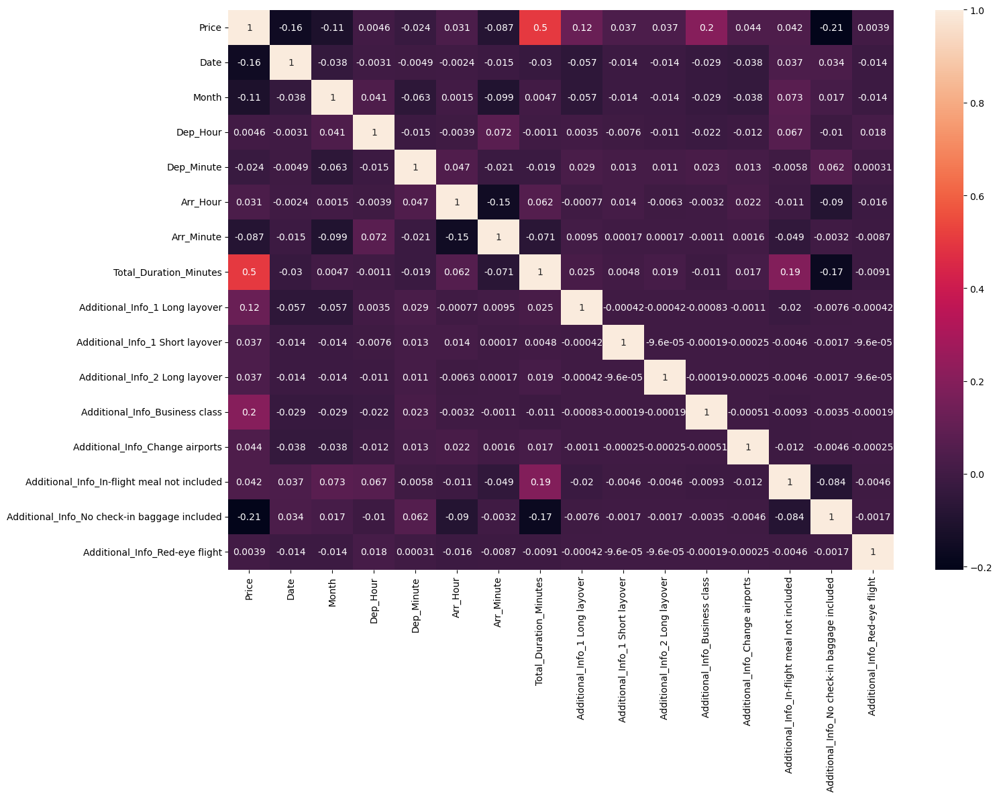

In [69]:
plt.figure(figsize=(16,12))
sns.heatmap(df.corr(),annot=True)
plt.tight_layout()
plt.show()

In [70]:
df.corr()

,Price,Date,Month,Dep_Hour,Dep_Minute,Arr_Hour,Arr_Minute,Total_Duration_Minutes,Additional_Info_1 Long layover,Additional_Info_1 Short layover,Additional_Info_2 Long layover,Additional_Info_Business class,Additional_Info_Change airports,Additional_Info_In-flight meal not included,Additional_Info_No check-in baggage included,Additional_Info_Red-eye flight
Price,1.000000,-0.158888,-0.113182,0.004569,-0.023919,0.030982,-0.086504,0.501974,0.120694,0.037462,0.036906,0.202110,0.043508,0.042098,-0.206135,0.003906
Date,-0.158888,1.000000,-0.038479,-0.003133,-0.004879,-0.002362,-0.014936,-0.030047,-0.056687,-0.014392,-0.014392,-0.028787,-0.038088,0.036785,0.033517,-0.014392
Month,-0.113182,-0.038479,1.000000,0.040929,-0.062872,0.001461,-0.099031,0.004738,-0.056590,-0.014298,-0.014298,-0.028600,-0.037840,0.073241,0.016682,-0.014298
Dep_Hour,0.004569,-0.003133,0.040929,1.000000,-0.015011,-0.003927,0.072359,-0.001079,0.003511,-0.007643,-0.011058,-0.022120,-0.011835,0.066679,-0.009958,0.017970
Dep_Minute,-0.023919,-0.004879,-0.062872,-0.015011,1.000000,0.046565,-0.021035,-0.019126,0.029378,0.013298,0.010700,0.022702,0.012599,-0.005756,0.061925,0.000306
Arr_Hour,0.030982,-0.002362,0.001461,-0.003927,0.046565,1.000000,-0.152126,0.061858,-0.000771,0.013710,-0.006257,-0.003244,0.021725,-0.011131,-0.090321,-0.016240
Arr_Minute,-0.086504,-0.014936,-0.099031,0.072359,-0.021035,-0.152126,1.000000,-0.070765,0.009536,0.000167,0.000167,-0.001142,0.001558,-0.048681,-0.003194,-0.008685
Total_Duration_Minutes,0.501974,-0.030047,0.004738,-0.001079,-0.019126,0.061858,-0.070765,1.000000,0.024667,0.004786,0.018943,-0.010836,0.017095,0.193384,-0.170630,-0.009078
Additional_Info_1 Long layover,0.120694,-0.056687,-0.056590,0.003511,0.029378,-0.000771,0.009536,0.024667,1.000000,-0.000417,-0.000417,-0.000834,-0.001104,-0.020261,-0.007552,-0.000417
Additional_Info_1 Short layover,0.037462,-0.014392,-0.014298,-0.007643,0.013298,0.013710,0.000167,0.004786,-0.000417,1.000000,-0.000096,-0.000191,-0.000253,-0.004644,-0.001731,-0.000096


___
### Route feature

In [71]:
df['Route'].sort_values().unique()

array(['BLR → AMD → DEL', 'BLR → BBI → DEL', 'BLR → BDQ → DEL',
       'BLR → BOM → AMD → DEL', 'BLR → BOM → BHO → DEL',
       'BLR → BOM → DEL', 'BLR → BOM → IDR → DEL',
       'BLR → BOM → IDR → GWL → DEL', 'BLR → BOM → IXC → DEL',
       'BLR → BOM → JDH → DEL', 'BLR → BOM → NAG → DEL',
       'BLR → BOM → UDR → DEL', 'BLR → CCU → BBI → DEL',
       'BLR → CCU → BBI → HYD → DEL', 'BLR → CCU → BBI → HYD → VGA → DEL',
       'BLR → CCU → DEL', 'BLR → CCU → GAU → DEL', 'BLR → COK → DEL',
       'BLR → DEL', 'BLR → GAU → DEL', 'BLR → GOI → DEL',
       'BLR → HBX → BOM → AMD → DEL', 'BLR → HBX → BOM → BHO → DEL',
       'BLR → HBX → BOM → NAG → DEL', 'BLR → HYD → DEL',
       'BLR → HYD → VGA → DEL', 'BLR → IDR → DEL', 'BLR → LKO → DEL',
       'BLR → MAA → DEL', 'BLR → NAG → DEL', 'BLR → PNQ → DEL',
       'BLR → STV → DEL', 'BLR → TRV → COK → DEL', 'BLR → VGA → DEL',
       'BLR → VGA → HYD → DEL', 'BLR → VGA → VTZ → DEL',
       'BOM → AMD → ISK → HYD', 'BOM → BBI → HYD',
       'BO

In [72]:
original.Route.nunique()

128

In [73]:
from sklearn.preprocessing import LabelEncoder

# Initialize the LabelEncoder
label_encoder = LabelEncoder()

# Fit and transform the 'Route' column
df['Route_encoded'] = label_encoder.fit_transform(df['Route'])

# Add 1 to the encoded values to start the labels from 1 instead of 0
df['Route_encoded'] = df['Route_encoded'] + 1

# Display the first few rows to verify
print(df[['Route', 'Route_encoded']].head())


                   Route  Route_encoded
0              BLR → DEL             19
1  CCU → IXR → BBI → BLR             85
2  DEL → LKO → BOM → COK            119
3        CCU → NAG → BLR             92
4        BLR → NAG → DEL             30


In [74]:
df.drop(columns='Route',inplace=True)

In [75]:
df['Route_encoded'].value_counts()

105    2376
19     1536
67      979
65      724
49      621
       ... 
97        1
87        1
44        1
43        1
38        1
Name: Route_encoded, Length: 128, dtype: int64

In [76]:
df= pd.get_dummies(data=df,columns=['Route_encoded'])

In [77]:
df

,Airline,Source,Destination,Total_Stops,Price,Date,Month,Dep_Hour,Dep_Minute,Arr_Hour,Arr_Minute,Total_Duration_Minutes,Additional_Info_1 Long layover,Additional_Info_1 Short layover,Additional_Info_2 Long layover,Additional_Info_Business class,Additional_Info_Change airports,Additional_Info_In-flight meal not included,Additional_Info_No check-in baggage included,Additional_Info_Red-eye flight,Route_encoded_1,Route_encoded_2,Route_encoded_3,Route_encoded_4,Route_encoded_5,Route_encoded_6,Route_encoded_7,Route_encoded_8,Route_encoded_9,Route_encoded_10,Route_encoded_11,Route_encoded_12,Route_encoded_13,Route_encoded_14,Route_encoded_15,Route_encoded_16,Route_encoded_17,Route_encoded_18,Route_encoded_19,Route_encoded_20,Route_encoded_21,Route_encoded_22,Route_encoded_23,Route_encoded_24,Route_encoded_25,Route_encoded_26,Route_encoded_27,Route_encoded_28,Route_encoded_29,Route_encoded_30,Route_encoded_31,Route_encoded_32,Route_encoded_33,Route_encoded_34,Route_encoded_35,Route_encoded_36,Route_encoded_37,Route_encoded_38,Route_encoded_39,Route_encoded_40,Route_encoded_41,Route_encoded_42,Route_encoded_43,Route_encoded_44,Route_encoded_45,Route_encoded_46,Route_encoded_47,Route_encoded_48,Route_encoded_49,Route_encoded_50,Route_encoded_51,Route_encoded_52,Route_encoded_53,Route_encoded_54,Route_encoded_55,Route_encoded_56,Route_encoded_57,Route_encoded_58,Route_encoded_59,Route_encoded_60,Route_encoded_61,Route_encoded_62,Route_encoded_63,Route_encoded_64,Route_encoded_65,Route_encoded_66,Route_encoded_67,Route_encoded_68,Route_encoded_69,Route_encoded_70,Route_encoded_71,Route_encoded_72,Route_encoded_73,Route_encoded_74,Route_encoded_75,Route_encoded_76,Route_encoded_77,Route_encoded_78,Route_encoded_79,Route_encoded_80,Route_encoded_81,Route_encoded_82,Route_encoded_83,Route_encoded_84,Route_encoded_85,Route_encoded_86,Route_encoded_87,Route_encoded_88,Route_encoded_89,Route_encoded_90,Route_encoded_91,Route_encoded_92,Route_encoded_93,Route_encoded_94,Route_encoded_95,Route_encoded_96,Route_encoded_97,Route_encoded_98,Route_encoded_99,Route_encoded_100,Route_encoded_101,Route_encoded_102,Route_encoded_103,Route_encoded_104,Route_encoded_105,Route_encoded_106,Route_encoded_107,Route_encoded_108,Route_encoded_109,Route_encoded_110,Route_encoded_111,Route_encoded_112,Route_encoded_113,Route_encoded_114,Route_encoded_115,Route_encoded_116,Route_encoded_117,Route_encoded_118,Route_encoded_119,Route_encoded_120,Route_encoded_121,Route_encoded_122,Route_encoded_123,Route_encoded_124,Route_encoded_125,Route_encoded_126,Route_encoded_127,Route_encoded_128
0,IndiGo,Banglore,New Delhi,non-stop,3897,24,3,22,20,1,10,170,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,Air India,Kolkata,Banglore,2 stops,7662,1,5,5,50,13,15,445,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,Jet Airways,Delhi,Cochin,2 stops,13882,9,6,9,25,4,25,1140,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
3,IndiGo,Kolkata,Banglore,1 stop,6218,12,5,18,5,23,30,325,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,IndiGo,Banglore,New Delhi,1 stop,13302,1,3,16,50,21,35,285,0,0,0,0,0,0,0,0,0

___
### Total_Stops feature

In [78]:
df['Total_Stops'].value_counts()

1 stop      5626
non-stop    3475
2 stops     1317
3 stops       43
4 stops        1
Name: Total_Stops, dtype: int64

In [79]:
df['Total_Stops'] =df['Total_Stops'].map({'non-stop':0, '1 stop':1, '2 stops':2, '3 stops':3, '4 stops':4})

In [80]:
df['Total_Stops'].value_counts()

1    5626
0    3475
2    1317
3      43
4       1
Name: Total_Stops, dtype: int64

In [81]:
df

,Airline,Source,Destination,Total_Stops,Price,Date,Month,Dep_Hour,Dep_Minute,Arr_Hour,Arr_Minute,Total_Duration_Minutes,Additional_Info_1 Long layover,Additional_Info_1 Short layover,Additional_Info_2 Long layover,Additional_Info_Business class,Additional_Info_Change airports,Additional_Info_In-flight meal not included,Additional_Info_No check-in baggage included,Additional_Info_Red-eye flight,Route_encoded_1,Route_encoded_2,Route_encoded_3,Route_encoded_4,Route_encoded_5,Route_encoded_6,Route_encoded_7,Route_encoded_8,Route_encoded_9,Route_encoded_10,Route_encoded_11,Route_encoded_12,Route_encoded_13,Route_encoded_14,Route_encoded_15,Route_encoded_16,Route_encoded_17,Route_encoded_18,Route_encoded_19,Route_encoded_20,Route_encoded_21,Route_encoded_22,Route_encoded_23,Route_encoded_24,Route_encoded_25,Route_encoded_26,Route_encoded_27,Route_encoded_28,Route_encoded_29,Route_encoded_30,Route_encoded_31,Route_encoded_32,Route_encoded_33,Route_encoded_34,Route_encoded_35,Route_encoded_36,Route_encoded_37,Route_encoded_38,Route_encoded_39,Route_encoded_40,Route_encoded_41,Route_encoded_42,Route_encoded_43,Route_encoded_44,Route_encoded_45,Route_encoded_46,Route_encoded_47,Route_encoded_48,Route_encoded_49,Route_encoded_50,Route_encoded_51,Route_encoded_52,Route_encoded_53,Route_encoded_54,Route_encoded_55,Route_encoded_56,Route_encoded_57,Route_encoded_58,Route_encoded_59,Route_encoded_60,Route_encoded_61,Route_encoded_62,Route_encoded_63,Route_encoded_64,Route_encoded_65,Route_encoded_66,Route_encoded_67,Route_encoded_68,Route_encoded_69,Route_encoded_70,Route_encoded_71,Route_encoded_72,Route_encoded_73,Route_encoded_74,Route_encoded_75,Route_encoded_76,Route_encoded_77,Route_encoded_78,Route_encoded_79,Route_encoded_80,Route_encoded_81,Route_encoded_82,Route_encoded_83,Route_encoded_84,Route_encoded_85,Route_encoded_86,Route_encoded_87,Route_encoded_88,Route_encoded_89,Route_encoded_90,Route_encoded_91,Route_encoded_92,Route_encoded_93,Route_encoded_94,Route_encoded_95,Route_encoded_96,Route_encoded_97,Route_encoded_98,Route_encoded_99,Route_encoded_100,Route_encoded_101,Route_encoded_102,Route_encoded_103,Route_encoded_104,Route_encoded_105,Route_encoded_106,Route_encoded_107,Route_encoded_108,Route_encoded_109,Route_encoded_110,Route_encoded_111,Route_encoded_112,Route_encoded_113,Route_encoded_114,Route_encoded_115,Route_encoded_116,Route_encoded_117,Route_encoded_118,Route_encoded_119,Route_encoded_120,Route_encoded_121,Route_encoded_122,Route_encoded_123,Route_encoded_124,Route_encoded_125,Route_encoded_126,Route_encoded_127,Route_encoded_128
0,IndiGo,Banglore,New Delhi,0,3897,24,3,22,20,1,10,170,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,Air India,Kolkata,Banglore,2,7662,1,5,5,50,13,15,445,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,Jet Airways,Delhi,Cochin,2,13882,9,6,9,25,4,25,1140,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
3,IndiGo,Kolkata,Banglore,1,6218,12,5,18,5,23,30,325,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,IndiGo,Banglore,New Delhi,1,13302,1,3,16,50,21,35,285,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,

___
### Arline feature

In [82]:
df.Airline.value_counts()

Jet Airways                          3700
IndiGo                               2043
Air India                            1694
Multiple carriers                    1196
SpiceJet                              815
Vistara                               478
Air Asia                              319
GoAir                                 194
Multiple carriers Premium economy      13
Jet Airways Business                    6
Vistara Premium economy                 3
Trujet                                  1
Name: Airline, dtype: int64

In [83]:
df.Airline.value_counts(normalize=True)

Jet Airways                          0.353661
IndiGo                               0.195278
Air India                            0.161919
Multiple carriers                    0.114318
SpiceJet                             0.077901
Vistara                              0.045689
Air Asia                             0.030491
GoAir                                0.018543
Multiple carriers Premium economy    0.001243
Jet Airways Business                 0.000574
Vistara Premium economy              0.000287
Trujet                               0.000096
Name: Airline, dtype: float64

In [84]:
df[df['Airline']=='Trujet']

,Airline,Source,Destination,Total_Stops,Price,Date,Month,Dep_Hour,Dep_Minute,Arr_Hour,Arr_Minute,Total_Duration_Minutes,Additional_Info_1 Long layover,Additional_Info_1 Short layover,Additional_Info_2 Long layover,Additional_Info_Business class,Additional_Info_Change airports,Additional_Info_In-flight meal not included,Additional_Info_No check-in baggage included,Additional_Info_Red-eye flight,Route_encoded_1,Route_encoded_2,Route_encoded_3,Route_encoded_4,Route_encoded_5,Route_encoded_6,Route_encoded_7,Route_encoded_8,Route_encoded_9,Route_encoded_10,Route_encoded_11,Route_encoded_12,Route_encoded_13,Route_encoded_14,Route_encoded_15,Route_encoded_16,Route_encoded_17,Route_encoded_18,Route_encoded_19,Route_encoded_20,Route_encoded_21,Route_encoded_22,Route_encoded_23,Route_encoded_24,Route_encoded_25,Route_encoded_26,Route_encoded_27,Route_encoded_28,Route_encoded_29,Route_encoded_30,Route_encoded_31,Route_encoded_32,Route_encoded_33,Route_encoded_34,Route_encoded_35,Route_encoded_36,Route_encoded_37,Route_encoded_38,Route_encoded_39,Route_encoded_40,Route_encoded_41,Route_encoded_42,Route_encoded_43,Route_encoded_44,Route_encoded_45,Route_encoded_46,Route_encoded_47,Route_encoded_48,Route_encoded_49,Route_encoded_50,Route_encoded_51,Route_encoded_52,Route_encoded_53,Route_encoded_54,Route_encoded_55,Route_encoded_56,Route_encoded_57,Route_encoded_58,Route_encoded_59,Route_encoded_60,Route_encoded_61,Route_encoded_62,Route_encoded_63,Route_encoded_64,Route_encoded_65,Route_encoded_66,Route_encoded_67,Route_encoded_68,Route_encoded_69,Route_encoded_70,Route_encoded_71,Route_encoded_72,Route_encoded_73,Route_encoded_74,Route_encoded_75,Route_encoded_76,Route_encoded_77,Route_encoded_78,Route_encoded_79,Route_encoded_80,Route_encoded_81,Route_encoded_82,Route_encoded_83,Route_encoded_84,Route_encoded_85,Route_encoded_86,Route_encoded_87,Route_encoded_88,Route_encoded_89,Route_encoded_90,Route_encoded_91,Route_encoded_92,Route_encoded_93,Route_encoded_94,Route_encoded_95,Route_encoded_96,Route_encoded_97,Route_encoded_98,Route_encoded_99,Route_encoded_100,Route_encoded_101,Route_encoded_102,Route_encoded_103,Route_encoded_104,Route_encoded_105,Route_encoded_106,Route_encoded_107,Route_encoded_108,Route_encoded_109,Route_encoded_110,Route_encoded_111,Route_encoded_112,Route_encoded_113,Route_encoded_114,Route_encoded_115,Route_encoded_116,Route_encoded_117,Route_encoded_118,Route_encoded_119,Route_encoded_120,Route_encoded_121,Route_encoded_122,Route_encoded_123,Route_encoded_124,Route_encoded_125,Route_encoded_126,Route_encoded_127,Route_encoded_128
2878,Trujet,Mumbai,Hyderabad,1,4140,6,3,13,5,16,20,195,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [85]:
df[df['Airline']=='Vistara Premium economy']

,Airline,Source,Destination,Total_Stops,Price,Date,Month,Dep_Hour,Dep_Minute,Arr_Hour,Arr_Minute,Total_Duration_Minutes,Additional_Info_1 Long layover,Additional_Info_1 Short layover,Additional_Info_2 Long layover,Additional_Info_Business class,Additional_Info_Change airports,Additional_Info_In-flight meal not included,Additional_Info_No check-in baggage included,Additional_Info_Red-eye flight,Route_encoded_1,Route_encoded_2,Route_encoded_3,Route_encoded_4,Route_encoded_5,Route_encoded_6,Route_encoded_7,Route_encoded_8,Route_encoded_9,Route_encoded_10,Route_encoded_11,Route_encoded_12,Route_encoded_13,Route_encoded_14,Route_encoded_15,Route_encoded_16,Route_encoded_17,Route_encoded_18,Route_encoded_19,Route_encoded_20,Route_encoded_21,Route_encoded_22,Route_encoded_23,Route_encoded_24,Route_encoded_25,Route_encoded_26,Route_encoded_27,Route_encoded_28,Route_encoded_29,Route_encoded_30,Route_encoded_31,Route_encoded_32,Route_encoded_33,Route_encoded_34,Route_encoded_35,Route_encoded_36,Route_encoded_37,Route_encoded_38,Route_encoded_39,Route_encoded_40,Route_encoded_41,Route_encoded_42,Route_encoded_43,Route_encoded_44,Route_encoded_45,Route_encoded_46,Route_encoded_47,Route_encoded_48,Route_encoded_49,Route_encoded_50,Route_encoded_51,Route_encoded_52,Route_encoded_53,Route_encoded_54,Route_encoded_55,Route_encoded_56,Route_encoded_57,Route_encoded_58,Route_encoded_59,Route_encoded_60,Route_encoded_61,Route_encoded_62,Route_encoded_63,Route_encoded_64,Route_encoded_65,Route_encoded_66,Route_encoded_67,Route_encoded_68,Route_encoded_69,Route_encoded_70,Route_encoded_71,Route_encoded_72,Route_encoded_73,Route_encoded_74,Route_encoded_75,Route_encoded_76,Route_encoded_77,Route_encoded_78,Route_encoded_79,Route_encoded_80,Route_encoded_81,Route_encoded_82,Route_encoded_83,Route_encoded_84,Route_encoded_85,Route_encoded_86,Route_encoded_87,Route_encoded_88,Route_encoded_89,Route_encoded_90,Route_encoded_91,Route_encoded_92,Route_encoded_93,Route_encoded_94,Route_encoded_95,Route_encoded_96,Route_encoded_97,Route_encoded_98,Route_encoded_99,Route_encoded_100,Route_encoded_101,Route_encoded_102,Route_encoded_103,Route_encoded_104,Route_encoded_105,Route_encoded_106,Route_encoded_107,Route_encoded_108,Route_encoded_109,Route_encoded_110,Route_encoded_111,Route_encoded_112,Route_encoded_113,Route_encoded_114,Route_encoded_115,Route_encoded_116,Route_encoded_117,Route_encoded_118,Route_encoded_119,Route_encoded_120,Route_encoded_121,Route_encoded_122,Route_encoded_123,Route_encoded_124,Route_encoded_125,Route_encoded_126,Route_encoded_127,Route_encoded_128
426,Vistara Premium economy,Banglore,New Delhi,0,11793,3,3,16,0,18,35,155,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7657,Vistara Premium economy,Chennai,Kolkata,0,9125,1,3,7,5,9,20,135,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
8615,Vistara Premium economy,Banglore,Delhi,0,5969,6,4,11,30,14,20,170,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [86]:
df[df['Airline']=='Multiple carriers Premium economy']

,Airline,Source,Destination,Total_Stops,Price,Date,Month,Dep_Hour,Dep_Minute,Arr_Hour,Arr_Minute,Total_Duration_Minutes,Additional_Info_1 Long layover,Additional_Info_1 Short layover,Additional_Info_2 Long layover,Additional_Info_Business class,Additional_Info_Change airports,Additional_Info_In-flight meal not included,Additional_Info_No check-in baggage included,Additional_Info_Red-eye flight,Route_encoded_1,Route_encoded_2,Route_encoded_3,Route_encoded_4,Route_encoded_5,Route_encoded_6,Route_encoded_7,Route_encoded_8,Route_encoded_9,Route_encoded_10,Route_encoded_11,Route_encoded_12,Route_encoded_13,Route_encoded_14,Route_encoded_15,Route_encoded_16,Route_encoded_17,Route_encoded_18,Route_encoded_19,Route_encoded_20,Route_encoded_21,Route_encoded_22,Route_encoded_23,Route_encoded_24,Route_encoded_25,Route_encoded_26,Route_encoded_27,Route_encoded_28,Route_encoded_29,Route_encoded_30,Route_encoded_31,Route_encoded_32,Route_encoded_33,Route_encoded_34,Route_encoded_35,Route_encoded_36,Route_encoded_37,Route_encoded_38,Route_encoded_39,Route_encoded_40,Route_encoded_41,Route_encoded_42,Route_encoded_43,Route_encoded_44,Route_encoded_45,Route_encoded_46,Route_encoded_47,Route_encoded_48,Route_encoded_49,Route_encoded_50,Route_encoded_51,Route_encoded_52,Route_encoded_53,Route_encoded_54,Route_encoded_55,Route_encoded_56,Route_encoded_57,Route_encoded_58,Route_encoded_59,Route_encoded_60,Route_encoded_61,Route_encoded_62,Route_encoded_63,Route_encoded_64,Route_encoded_65,Route_encoded_66,Route_encoded_67,Route_encoded_68,Route_encoded_69,Route_encoded_70,Route_encoded_71,Route_encoded_72,Route_encoded_73,Route_encoded_74,Route_encoded_75,Route_encoded_76,Route_encoded_77,Route_encoded_78,Route_encoded_79,Route_encoded_80,Route_encoded_81,Route_encoded_82,Route_encoded_83,Route_encoded_84,Route_encoded_85,Route_encoded_86,Route_encoded_87,Route_encoded_88,Route_encoded_89,Route_encoded_90,Route_encoded_91,Route_encoded_92,Route_encoded_93,Route_encoded_94,Route_encoded_95,Route_encoded_96,Route_encoded_97,Route_encoded_98,Route_encoded_99,Route_encoded_100,Route_encoded_101,Route_encoded_102,Route_encoded_103,Route_encoded_104,Route_encoded_105,Route_encoded_106,Route_encoded_107,Route_encoded_108,Route_encoded_109,Route_encoded_110,Route_encoded_111,Route_encoded_112,Route_encoded_113,Route_encoded_114,Route_encoded_115,Route_encoded_116,Route_encoded_117,Route_encoded_118,Route_encoded_119,Route_encoded_120,Route_encoded_121,Route_encoded_122,Route_encoded_123,Route_encoded_124,Route_encoded_125,Route_encoded_126,Route_encoded_127,Route_encoded_128
717,Multiple carriers Premium economy,Delhi,Cochin,1,10161,21,3,7,30,19,15,705,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1799,Multiple carriers Premium economy,Delhi,Cochin,1,9845,21,3,7,30,21,0,810,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4627,Multiple carriers Premium economy,Delhi,Cochin,1,10161,21,3,8,55,19,15,620,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4718,Multiple carriers Premium economy,Delhi,Cochin,1,9845,21,3,6,0,21,0,900,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5090,

In [87]:
df[df['Airline']=='Jet Airways Business']

,Airline,Source,Destination,Total_Stops,Price,Date,Month,Dep_Hour,Dep_Minute,Arr_Hour,Arr_Minute,Total_Duration_Minutes,Additional_Info_1 Long layover,Additional_Info_1 Short layover,Additional_Info_2 Long layover,Additional_Info_Business class,Additional_Info_Change airports,Additional_Info_In-flight meal not included,Additional_Info_No check-in baggage included,Additional_Info_Red-eye flight,Route_encoded_1,Route_encoded_2,Route_encoded_3,Route_encoded_4,Route_encoded_5,Route_encoded_6,Route_encoded_7,Route_encoded_8,Route_encoded_9,Route_encoded_10,Route_encoded_11,Route_encoded_12,Route_encoded_13,Route_encoded_14,Route_encoded_15,Route_encoded_16,Route_encoded_17,Route_encoded_18,Route_encoded_19,Route_encoded_20,Route_encoded_21,Route_encoded_22,Route_encoded_23,Route_encoded_24,Route_encoded_25,Route_encoded_26,Route_encoded_27,Route_encoded_28,Route_encoded_29,Route_encoded_30,Route_encoded_31,Route_encoded_32,Route_encoded_33,Route_encoded_34,Route_encoded_35,Route_encoded_36,Route_encoded_37,Route_encoded_38,Route_encoded_39,Route_encoded_40,Route_encoded_41,Route_encoded_42,Route_encoded_43,Route_encoded_44,Route_encoded_45,Route_encoded_46,Route_encoded_47,Route_encoded_48,Route_encoded_49,Route_encoded_50,Route_encoded_51,Route_encoded_52,Route_encoded_53,Route_encoded_54,Route_encoded_55,Route_encoded_56,Route_encoded_57,Route_encoded_58,Route_encoded_59,Route_encoded_60,Route_encoded_61,Route_encoded_62,Route_encoded_63,Route_encoded_64,Route_encoded_65,Route_encoded_66,Route_encoded_67,Route_encoded_68,Route_encoded_69,Route_encoded_70,Route_encoded_71,Route_encoded_72,Route_encoded_73,Route_encoded_74,Route_encoded_75,Route_encoded_76,Route_encoded_77,Route_encoded_78,Route_encoded_79,Route_encoded_80,Route_encoded_81,Route_encoded_82,Route_encoded_83,Route_encoded_84,Route_encoded_85,Route_encoded_86,Route_encoded_87,Route_encoded_88,Route_encoded_89,Route_encoded_90,Route_encoded_91,Route_encoded_92,Route_encoded_93,Route_encoded_94,Route_encoded_95,Route_encoded_96,Route_encoded_97,Route_encoded_98,Route_encoded_99,Route_encoded_100,Route_encoded_101,Route_encoded_102,Route_encoded_103,Route_encoded_104,Route_encoded_105,Route_encoded_106,Route_encoded_107,Route_encoded_108,Route_encoded_109,Route_encoded_110,Route_encoded_111,Route_encoded_112,Route_encoded_113,Route_encoded_114,Route_encoded_115,Route_encoded_116,Route_encoded_117,Route_encoded_118,Route_encoded_119,Route_encoded_120,Route_encoded_121,Route_encoded_122,Route_encoded_123,Route_encoded_124,Route_encoded_125,Route_encoded_126,Route_encoded_127,Route_encoded_128
657,Jet Airways Business,Banglore,New Delhi,1,52229,1,3,5,45,10,45,300,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2924,Jet Airways Business,Banglore,New Delhi,1,79512,1,3,5,45,11,25,340,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5372,Jet Airways Business,Banglore,New Delhi,1,62427,1,3,5,45,12,25,400,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7351,Jet Airways Business,Delhi,Cochin,2,46490,3,3,20,5,4,25,500,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
9715,Jet Airways Business,Delhi,Cochin,

In [88]:
df[df['Price']==79512]

,Airline,Source,Destination,Total_Stops,Price,Date,Month,Dep_Hour,Dep_Minute,Arr_Hour,Arr_Minute,Total_Duration_Minutes,Additional_Info_1 Long layover,Additional_Info_1 Short layover,Additional_Info_2 Long layover,Additional_Info_Business class,Additional_Info_Change airports,Additional_Info_In-flight meal not included,Additional_Info_No check-in baggage included,Additional_Info_Red-eye flight,Route_encoded_1,Route_encoded_2,Route_encoded_3,Route_encoded_4,Route_encoded_5,Route_encoded_6,Route_encoded_7,Route_encoded_8,Route_encoded_9,Route_encoded_10,Route_encoded_11,Route_encoded_12,Route_encoded_13,Route_encoded_14,Route_encoded_15,Route_encoded_16,Route_encoded_17,Route_encoded_18,Route_encoded_19,Route_encoded_20,Route_encoded_21,Route_encoded_22,Route_encoded_23,Route_encoded_24,Route_encoded_25,Route_encoded_26,Route_encoded_27,Route_encoded_28,Route_encoded_29,Route_encoded_30,Route_encoded_31,Route_encoded_32,Route_encoded_33,Route_encoded_34,Route_encoded_35,Route_encoded_36,Route_encoded_37,Route_encoded_38,Route_encoded_39,Route_encoded_40,Route_encoded_41,Route_encoded_42,Route_encoded_43,Route_encoded_44,Route_encoded_45,Route_encoded_46,Route_encoded_47,Route_encoded_48,Route_encoded_49,Route_encoded_50,Route_encoded_51,Route_encoded_52,Route_encoded_53,Route_encoded_54,Route_encoded_55,Route_encoded_56,Route_encoded_57,Route_encoded_58,Route_encoded_59,Route_encoded_60,Route_encoded_61,Route_encoded_62,Route_encoded_63,Route_encoded_64,Route_encoded_65,Route_encoded_66,Route_encoded_67,Route_encoded_68,Route_encoded_69,Route_encoded_70,Route_encoded_71,Route_encoded_72,Route_encoded_73,Route_encoded_74,Route_encoded_75,Route_encoded_76,Route_encoded_77,Route_encoded_78,Route_encoded_79,Route_encoded_80,Route_encoded_81,Route_encoded_82,Route_encoded_83,Route_encoded_84,Route_encoded_85,Route_encoded_86,Route_encoded_87,Route_encoded_88,Route_encoded_89,Route_encoded_90,Route_encoded_91,Route_encoded_92,Route_encoded_93,Route_encoded_94,Route_encoded_95,Route_encoded_96,Route_encoded_97,Route_encoded_98,Route_encoded_99,Route_encoded_100,Route_encoded_101,Route_encoded_102,Route_encoded_103,Route_encoded_104,Route_encoded_105,Route_encoded_106,Route_encoded_107,Route_encoded_108,Route_encoded_109,Route_encoded_110,Route_encoded_111,Route_encoded_112,Route_encoded_113,Route_encoded_114,Route_encoded_115,Route_encoded_116,Route_encoded_117,Route_encoded_118,Route_encoded_119,Route_encoded_120,Route_encoded_121,Route_encoded_122,Route_encoded_123,Route_encoded_124,Route_encoded_125,Route_encoded_126,Route_encoded_127,Route_encoded_128
2924,Jet Airways Business,Banglore,New Delhi,1,79512,1,3,5,45,11,25,340,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [89]:
# List of airlines to drop    # 'Jet Airways Business',

airlines_to_drop = ['Multiple carriers Premium economy','Vistara Premium economy','Trujet']

# Drop rows where the 'Airline' column has any of the specified values
df = df[~df['Airline'].isin(airlines_to_drop)]

In [90]:
df.Airline.value_counts()

Jet Airways             3700
IndiGo                  2043
Air India               1694
Multiple carriers       1196
SpiceJet                 815
Vistara                  478
Air Asia                 319
GoAir                    194
Jet Airways Business       6
Name: Airline, dtype: int64

In [91]:
df

,Airline,Source,Destination,Total_Stops,Price,Date,Month,Dep_Hour,Dep_Minute,Arr_Hour,Arr_Minute,Total_Duration_Minutes,Additional_Info_1 Long layover,Additional_Info_1 Short layover,Additional_Info_2 Long layover,Additional_Info_Business class,Additional_Info_Change airports,Additional_Info_In-flight meal not included,Additional_Info_No check-in baggage included,Additional_Info_Red-eye flight,Route_encoded_1,Route_encoded_2,Route_encoded_3,Route_encoded_4,Route_encoded_5,Route_encoded_6,Route_encoded_7,Route_encoded_8,Route_encoded_9,Route_encoded_10,Route_encoded_11,Route_encoded_12,Route_encoded_13,Route_encoded_14,Route_encoded_15,Route_encoded_16,Route_encoded_17,Route_encoded_18,Route_encoded_19,Route_encoded_20,Route_encoded_21,Route_encoded_22,Route_encoded_23,Route_encoded_24,Route_encoded_25,Route_encoded_26,Route_encoded_27,Route_encoded_28,Route_encoded_29,Route_encoded_30,Route_encoded_31,Route_encoded_32,Route_encoded_33,Route_encoded_34,Route_encoded_35,Route_encoded_36,Route_encoded_37,Route_encoded_38,Route_encoded_39,Route_encoded_40,Route_encoded_41,Route_encoded_42,Route_encoded_43,Route_encoded_44,Route_encoded_45,Route_encoded_46,Route_encoded_47,Route_encoded_48,Route_encoded_49,Route_encoded_50,Route_encoded_51,Route_encoded_52,Route_encoded_53,Route_encoded_54,Route_encoded_55,Route_encoded_56,Route_encoded_57,Route_encoded_58,Route_encoded_59,Route_encoded_60,Route_encoded_61,Route_encoded_62,Route_encoded_63,Route_encoded_64,Route_encoded_65,Route_encoded_66,Route_encoded_67,Route_encoded_68,Route_encoded_69,Route_encoded_70,Route_encoded_71,Route_encoded_72,Route_encoded_73,Route_encoded_74,Route_encoded_75,Route_encoded_76,Route_encoded_77,Route_encoded_78,Route_encoded_79,Route_encoded_80,Route_encoded_81,Route_encoded_82,Route_encoded_83,Route_encoded_84,Route_encoded_85,Route_encoded_86,Route_encoded_87,Route_encoded_88,Route_encoded_89,Route_encoded_90,Route_encoded_91,Route_encoded_92,Route_encoded_93,Route_encoded_94,Route_encoded_95,Route_encoded_96,Route_encoded_97,Route_encoded_98,Route_encoded_99,Route_encoded_100,Route_encoded_101,Route_encoded_102,Route_encoded_103,Route_encoded_104,Route_encoded_105,Route_encoded_106,Route_encoded_107,Route_encoded_108,Route_encoded_109,Route_encoded_110,Route_encoded_111,Route_encoded_112,Route_encoded_113,Route_encoded_114,Route_encoded_115,Route_encoded_116,Route_encoded_117,Route_encoded_118,Route_encoded_119,Route_encoded_120,Route_encoded_121,Route_encoded_122,Route_encoded_123,Route_encoded_124,Route_encoded_125,Route_encoded_126,Route_encoded_127,Route_encoded_128
0,IndiGo,Banglore,New Delhi,0,3897,24,3,22,20,1,10,170,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,Air India,Kolkata,Banglore,2,7662,1,5,5,50,13,15,445,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,Jet Airways,Delhi,Cochin,2,13882,9,6,9,25,4,25,1140,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
3,IndiGo,Kolkata,Banglore,1,6218,12,5,18,5,23,30,325,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,IndiGo,Banglore,New Delhi,1,13302,1,3,16,50,21,35,285,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,

In [92]:
df=pd.get_dummies(data=df,columns=['Airline'])#,drop_first=True) # notdropping any variable as xgboost is resiliant to multicolinearity

In [93]:
df.columns

Index(['Source', 'Destination', 'Total_Stops', 'Price', 'Date', 'Month',
       'Dep_Hour', 'Dep_Minute', 'Arr_Hour', 'Arr_Minute',
       ...
       'Route_encoded_128', 'Airline_Air Asia', 'Airline_Air India',
       'Airline_GoAir', 'Airline_IndiGo', 'Airline_Jet Airways',
       'Airline_Jet Airways Business', 'Airline_Multiple carriers',
       'Airline_SpiceJet', 'Airline_Vistara'],
      dtype='object', length=156)

In [94]:
#df.drop(columns='Airline_GoAir',inplace=True)

### Source feature

In [95]:
df['Source'].value_counts()

Delhi       4333
Kolkata     2860
Banglore    2177
Mumbai       695
Chennai      380
Name: Source, dtype: int64

<Axes: xlabel='Source', ylabel='count'>

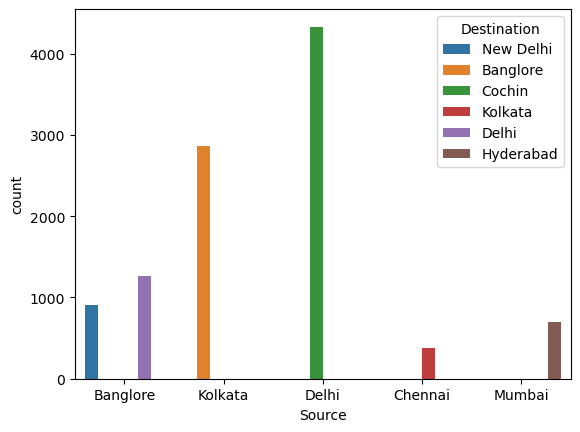

In [96]:
sns.countplot(data=df,x='Source',hue='Destination')

In [97]:
df[df['Source']=='Banglore']['Destination'].value_counts()

Delhi        1264
New Delhi     913
Name: Destination, dtype: int64

___
### Destination feature

In [98]:
df.Destination.value_counts()

Cochin       4333
Banglore     2860
Delhi        1264
New Delhi     913
Hyderabad     695
Kolkata       380
Name: Destination, dtype: int64

In [99]:
df['Destination']=df['Destination'].replace('New Delhi','Delhi')

In [100]:
df['Destination'].unique()

array(['Delhi', 'Banglore', 'Cochin', 'Kolkata', 'Hyderabad'],
      dtype=object)

In [101]:
df.Destination.value_counts()

Cochin       4333
Banglore     2860
Delhi        2177
Hyderabad     695
Kolkata       380
Name: Destination, dtype: int64

<Axes: xlabel='Destination', ylabel='count'>

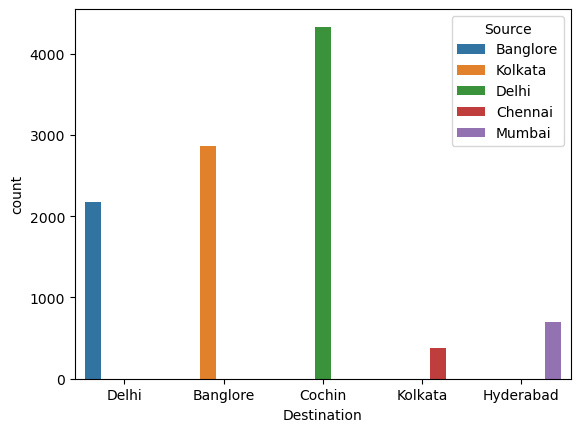

In [102]:
sns.countplot(data=df,x='Destination',hue='Source')

In [103]:
df[['Source','Destination']].value_counts()

Source    Destination
Delhi     Cochin         4333
Kolkata   Banglore       2860
Banglore  Delhi          2177
Mumbai    Hyderabad       695
Chennai   Kolkata         380
dtype: int64

* **As seen above Destination has strong positive correlation with Source, we will drop Destination column to avoid multicolinearity**

In [104]:
df.drop(columns='Destination',inplace=True)

___
* converting sources into dummy variables

In [105]:
df=pd.get_dummies(data=df,columns=['Source'])

In [106]:
df.columns

Index(['Total_Stops', 'Price', 'Date', 'Month', 'Dep_Hour', 'Dep_Minute',
       'Arr_Hour', 'Arr_Minute', 'Total_Duration_Minutes',
       'Additional_Info_1 Long layover',
       ...
       'Airline_Jet Airways', 'Airline_Jet Airways Business',
       'Airline_Multiple carriers', 'Airline_SpiceJet', 'Airline_Vistara',
       'Source_Banglore', 'Source_Chennai', 'Source_Delhi', 'Source_Kolkata',
       'Source_Mumbai'],
      dtype='object', length=159)

In [107]:
#df.drop(columns='Source_Chennai',inplace=True)

___
### Price feature

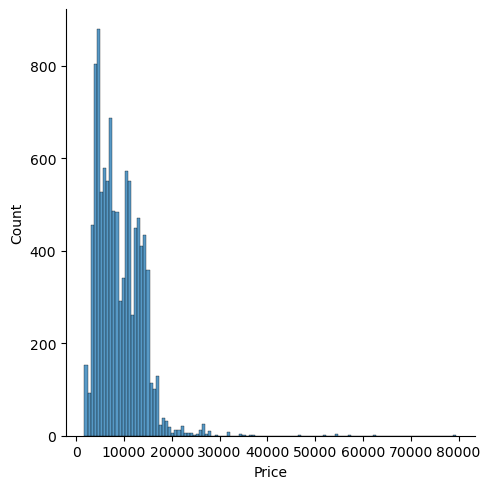

In [108]:
sns.displot(data=df,x='Price')

<Axes: xlabel='Price'>

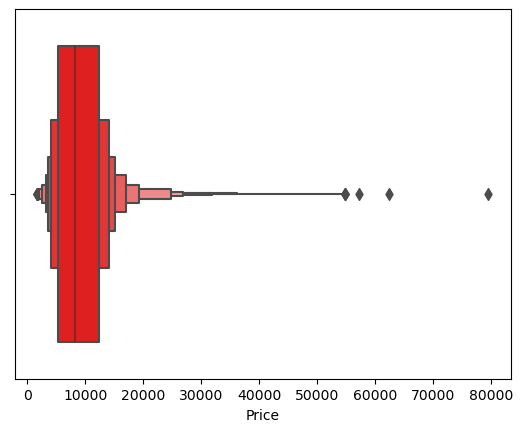

In [109]:
sns.boxenplot(data=df,x='Price',color='red')

In [110]:
df[df['Price']>50000]

,Total_Stops,Price,Date,Month,Dep_Hour,Dep_Minute,Arr_Hour,Arr_Minute,Total_Duration_Minutes,Additional_Info_1 Long layover,Additional_Info_1 Short layover,Additional_Info_2 Long layover,Additional_Info_Business class,Additional_Info_Change airports,Additional_Info_In-flight meal not included,Additional_Info_No check-in baggage included,Additional_Info_Red-eye flight,Route_encoded_1,Route_encoded_2,Route_encoded_3,Route_encoded_4,Route_encoded_5,Route_encoded_6,Route_encoded_7,Route_encoded_8,Route_encoded_9,Route_encoded_10,Route_encoded_11,Route_encoded_12,Route_encoded_13,Route_encoded_14,Route_encoded_15,Route_encoded_16,Route_encoded_17,Route_encoded_18,Route_encoded_19,Route_encoded_20,Route_encoded_21,Route_encoded_22,Route_encoded_23,Route_encoded_24,Route_encoded_25,Route_encoded_26,Route_encoded_27,Route_encoded_28,Route_encoded_29,Route_encoded_30,Route_encoded_31,Route_encoded_32,Route_encoded_33,Route_encoded_34,Route_encoded_35,Route_encoded_36,Route_encoded_37,Route_encoded_38,Route_encoded_39,Route_encoded_40,Route_encoded_41,Route_encoded_42,Route_encoded_43,Route_encoded_44,Route_encoded_45,Route_encoded_46,Route_encoded_47,Route_encoded_48,Route_encoded_49,Route_encoded_50,Route_encoded_51,Route_encoded_52,Route_encoded_53,Route_encoded_54,Route_encoded_55,Route_encoded_56,Route_encoded_57,Route_encoded_58,Route_encoded_59,Route_encoded_60,Route_encoded_61,Route_encoded_62,Route_encoded_63,Route_encoded_64,Route_encoded_65,Route_encoded_66,Route_encoded_67,Route_encoded_68,Route_encoded_69,Route_encoded_70,Route_encoded_71,Route_encoded_72,Route_encoded_73,Route_encoded_74,Route_encoded_75,Route_encoded_76,Route_encoded_77,Route_encoded_78,Route_encoded_79,Route_encoded_80,Route_encoded_81,Route_encoded_82,Route_encoded_83,Route_encoded_84,Route_encoded_85,Route_encoded_86,Route_encoded_87,Route_encoded_88,Route_encoded_89,Route_encoded_90,Route_encoded_91,Route_encoded_92,Route_encoded_93,Route_encoded_94,Route_encoded_95,Route_encoded_96,Route_encoded_97,Route_encoded_98,Route_encoded_99,Route_encoded_100,Route_encoded_101,Route_encoded_102,Route_encoded_103,Route_encoded_104,Route_encoded_105,Route_encoded_106,Route_encoded_107,Route_encoded_108,Route_encoded_109,Route_encoded_110,Route_encoded_111,Route_encoded_112,Route_encoded_113,Route_encoded_114,Route_encoded_115,Route_encoded_116,Route_encoded_117,Route_encoded_118,Route_encoded_119,Route_encoded_120,Route_encoded_121,Route_encoded_122,Route_encoded_123,Route_encoded_124,Route_encoded_125,Route_encoded_126,Route_encoded_127,Route_encoded_128,Airline_Air Asia,Airline_Air India,Airline_GoAir,Airline_IndiGo,Airline_Jet Airways,Airline_Jet Airways Business,Airline_Multiple carriers,Airline_SpiceJet,Airline_Vistara,Source_Banglore,Source_Chennai,Source_Delhi,Source_Kolkata,Source_Mumbai
657,1,52229,1,3,5,45,10,45,300,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0
1478,1,54826,18,3,18,40,0,45,365,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0
2618,1,54826,18,3,22,50,5,5,375,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0
2924,1,79512,1,3,5,45,11,25,340,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0

In [111]:
#df[df['Route_encoded']==6]

In [112]:
original[original['Price']>50000]

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price
657,Jet Airways Business,01/03/2019,Banglore,New Delhi,BLR → BOM → DEL,05:45,10:45,5h,1 stop,Null,52229
1478,Jet Airways,18/03/2019,Banglore,New Delhi,BLR → BOM → DEL,18:40,00:45 16 Mar,6h 5m,1 stop,Null,54826
2618,Jet Airways,18/03/2019,Banglore,New Delhi,BLR → BOM → DEL,22:50,05:05 16 Mar,6h 15m,1 stop,Null,54826
2924,Jet Airways Business,01/03/2019,Banglore,New Delhi,BLR → BOM → DEL,05:45,11:25,5h 40m,1 stop,Business class,79512
5372,Jet Airways Business,01/03/2019,Banglore,New Delhi,BLR → BOM → DEL,05:45,12:25,6h 40m,1 stop,Business class,62427
5439,Jet Airways,01/03/2019,Banglore,New Delhi,BLR → BOM → DEL,16:55,23:00,6h 5m,1 stop,Null,54826
9715,Jet Airways Business,6/03/2019,Delhi,Cochin,DEL → ATQ → BOM → COK,20:05,04:25 07 Mar,8h 20m,2 stops,Null,52285
10364,Jet Airways Business,01/03/2019,Banglore,New Delhi,BLR → MAA → DEL,09:45,14:25,4h 40m,1 stop,Business class,57209


In [113]:
df[df['Price']>50000]

,Total_Stops,Price,Date,Month,Dep_Hour,Dep_Minute,Arr_Hour,Arr_Minute,Total_Duration_Minutes,Additional_Info_1 Long layover,Additional_Info_1 Short layover,Additional_Info_2 Long layover,Additional_Info_Business class,Additional_Info_Change airports,Additional_Info_In-flight meal not included,Additional_Info_No check-in baggage included,Additional_Info_Red-eye flight,Route_encoded_1,Route_encoded_2,Route_encoded_3,Route_encoded_4,Route_encoded_5,Route_encoded_6,Route_encoded_7,Route_encoded_8,Route_encoded_9,Route_encoded_10,Route_encoded_11,Route_encoded_12,Route_encoded_13,Route_encoded_14,Route_encoded_15,Route_encoded_16,Route_encoded_17,Route_encoded_18,Route_encoded_19,Route_encoded_20,Route_encoded_21,Route_encoded_22,Route_encoded_23,Route_encoded_24,Route_encoded_25,Route_encoded_26,Route_encoded_27,Route_encoded_28,Route_encoded_29,Route_encoded_30,Route_encoded_31,Route_encoded_32,Route_encoded_33,Route_encoded_34,Route_encoded_35,Route_encoded_36,Route_encoded_37,Route_encoded_38,Route_encoded_39,Route_encoded_40,Route_encoded_41,Route_encoded_42,Route_encoded_43,Route_encoded_44,Route_encoded_45,Route_encoded_46,Route_encoded_47,Route_encoded_48,Route_encoded_49,Route_encoded_50,Route_encoded_51,Route_encoded_52,Route_encoded_53,Route_encoded_54,Route_encoded_55,Route_encoded_56,Route_encoded_57,Route_encoded_58,Route_encoded_59,Route_encoded_60,Route_encoded_61,Route_encoded_62,Route_encoded_63,Route_encoded_64,Route_encoded_65,Route_encoded_66,Route_encoded_67,Route_encoded_68,Route_encoded_69,Route_encoded_70,Route_encoded_71,Route_encoded_72,Route_encoded_73,Route_encoded_74,Route_encoded_75,Route_encoded_76,Route_encoded_77,Route_encoded_78,Route_encoded_79,Route_encoded_80,Route_encoded_81,Route_encoded_82,Route_encoded_83,Route_encoded_84,Route_encoded_85,Route_encoded_86,Route_encoded_87,Route_encoded_88,Route_encoded_89,Route_encoded_90,Route_encoded_91,Route_encoded_92,Route_encoded_93,Route_encoded_94,Route_encoded_95,Route_encoded_96,Route_encoded_97,Route_encoded_98,Route_encoded_99,Route_encoded_100,Route_encoded_101,Route_encoded_102,Route_encoded_103,Route_encoded_104,Route_encoded_105,Route_encoded_106,Route_encoded_107,Route_encoded_108,Route_encoded_109,Route_encoded_110,Route_encoded_111,Route_encoded_112,Route_encoded_113,Route_encoded_114,Route_encoded_115,Route_encoded_116,Route_encoded_117,Route_encoded_118,Route_encoded_119,Route_encoded_120,Route_encoded_121,Route_encoded_122,Route_encoded_123,Route_encoded_124,Route_encoded_125,Route_encoded_126,Route_encoded_127,Route_encoded_128,Airline_Air Asia,Airline_Air India,Airline_GoAir,Airline_IndiGo,Airline_Jet Airways,Airline_Jet Airways Business,Airline_Multiple carriers,Airline_SpiceJet,Airline_Vistara,Source_Banglore,Source_Chennai,Source_Delhi,Source_Kolkata,Source_Mumbai
657,1,52229,1,3,5,45,10,45,300,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0
1478,1,54826,18,3,18,40,0,45,365,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0
2618,1,54826,18,3,22,50,5,5,375,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0
2924,1,79512,1,3,5,45,11,25,340,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0

In [114]:
df.shape

(10445, 159)

In [115]:
# # Removeing price outliers
# df=df[df['Price']<50000]

In [116]:
df.shape

(10445, 159)

In [117]:
df.columns

Index(['Total_Stops', 'Price', 'Date', 'Month', 'Dep_Hour', 'Dep_Minute',
       'Arr_Hour', 'Arr_Minute', 'Total_Duration_Minutes',
       'Additional_Info_1 Long layover',
       ...
       'Airline_Jet Airways', 'Airline_Jet Airways Business',
       'Airline_Multiple carriers', 'Airline_SpiceJet', 'Airline_Vistara',
       'Source_Banglore', 'Source_Chennai', 'Source_Delhi', 'Source_Kolkata',
       'Source_Mumbai'],
      dtype='object', length=159)

In [118]:
original[original['Airline']=='Jet Airways Business']

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price
657,Jet Airways Business,01/03/2019,Banglore,New Delhi,BLR → BOM → DEL,05:45,10:45,5h,1 stop,Null,52229
2924,Jet Airways Business,01/03/2019,Banglore,New Delhi,BLR → BOM → DEL,05:45,11:25,5h 40m,1 stop,Business class,79512
5372,Jet Airways Business,01/03/2019,Banglore,New Delhi,BLR → BOM → DEL,05:45,12:25,6h 40m,1 stop,Business class,62427
7351,Jet Airways Business,3/03/2019,Delhi,Cochin,DEL → ATQ → BOM → COK,20:05,04:25 04 Mar,8h 20m,2 stops,Null,46490
9715,Jet Airways Business,6/03/2019,Delhi,Cochin,DEL → ATQ → BOM → COK,20:05,04:25 07 Mar,8h 20m,2 stops,Null,52285
10364,Jet Airways Business,01/03/2019,Banglore,New Delhi,BLR → MAA → DEL,09:45,14:25,4h 40m,1 stop,Business class,57209


---
### Creating new feature Price_Category

In [119]:


# Define the bins and labels for the price categories
bins = [0, 4000, 8000, 15000, 25000, float('inf')]
labels = ['Very Low', 'Low', 'Medium', 'High', 'Very High']

# Create the Price_category column
df['Price_category'] = pd.cut(df['Price'], bins=bins, labels=labels, right=False)




In [120]:
df.Price_category.value_counts()

Medium       4659
Low          3847
Very Low     1160
High          697
Very High      82
Name: Price_category, dtype: int64

In [121]:
df['Price_category'] = df['Price_category'].map({'Very Low':1, 'Low':2, 'Medium':3, 'High':4, 'Very High':5}).astype(int)

In [122]:
df.Price_category.value_counts()

3    4659
2    3847
1    1160
4     697
5      82
Name: Price_category, dtype: int64

In [123]:
df.Price.describe()

count    10445.000000
mean      9023.356726
std       4626.364056
min       1759.000000
25%       5224.000000
50%       8266.000000
75%      12346.000000
max      79512.000000
Name: Price, dtype: float64

In [124]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10445 entries, 0 to 10682
Columns: 160 entries, Total_Stops to Price_category
dtypes: int32(6), int64(4), uint8(150)
memory usage: 2.4 MB


In [125]:
# df.Price.min()

In [126]:
# df[df['Airline']=='Jet Airways Business']

In [127]:
# dxvbbfbxbxf

##### Applying Log transformation to Price feature

In [128]:
import plotly.graph_objs as go
import plotly.subplots as sp
import numpy as np

# Create a subplot with two histograms
fig = sp.make_subplots(rows=1, cols=2, subplot_titles=('Original Price Distribution', 'Log-transformed Price Distribution'))

# Original Price Distribution
fig.add_trace(go.Histogram(x=df['Price'], nbinsx=50, histnorm='probability', marker=dict(color='red')), row=1, col=1)

# Log-transformed Price Distribution
fig.add_trace(go.Histogram(x=np.log(df['Price']), nbinsx=50, histnorm='probability', marker=dict(color='green')), row=1, col=2)

# Update layout for better visualization
fig.update_layout(
    title_text="Price Distribution Before and After Log Transformation",
    showlegend=False,
    height=400,
    width=800,
    bargap=0.2
)

# Show the plot
fig.show()


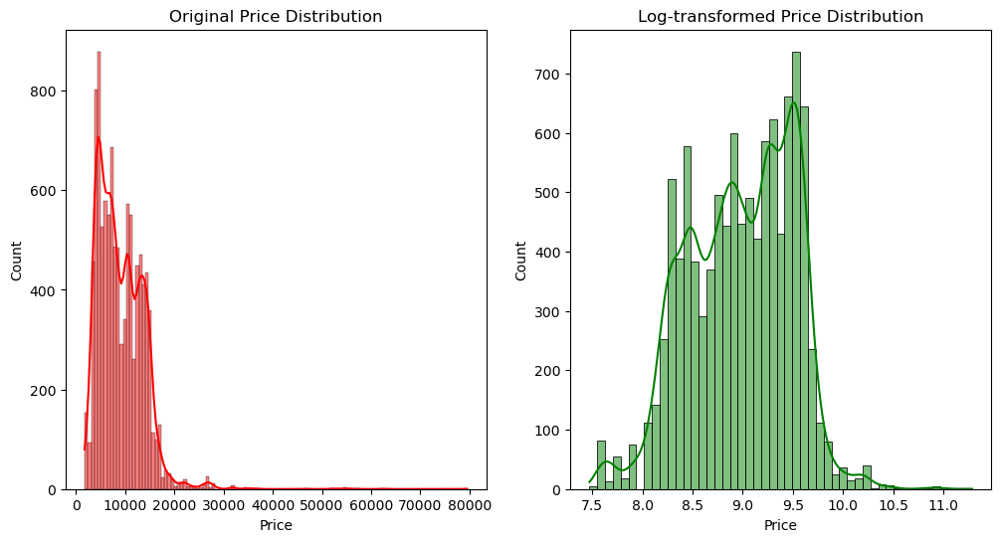

In [129]:


# Visualize the distribution before and after transformation
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
sns.histplot(df['Price'], kde=True,color='red')
plt.title('Original Price Distribution')

plt.subplot(1, 2, 2)
sns.histplot(np.log(df['Price']), kde=True,color='green')
plt.title('Log-transformed Price Distribution')

plt.show()


In [130]:


 # Apply Log transformation
df['Price']=np.log(df['Price'])



In [131]:
df

,Total_Stops,Price,Date,Month,Dep_Hour,Dep_Minute,Arr_Hour,Arr_Minute,Total_Duration_Minutes,Additional_Info_1 Long layover,Additional_Info_1 Short layover,Additional_Info_2 Long layover,Additional_Info_Business class,Additional_Info_Change airports,Additional_Info_In-flight meal not included,Additional_Info_No check-in baggage included,Additional_Info_Red-eye flight,Route_encoded_1,Route_encoded_2,Route_encoded_3,Route_encoded_4,Route_encoded_5,Route_encoded_6,Route_encoded_7,Route_encoded_8,Route_encoded_9,Route_encoded_10,Route_encoded_11,Route_encoded_12,Route_encoded_13,Route_encoded_14,Route_encoded_15,Route_encoded_16,Route_encoded_17,Route_encoded_18,Route_encoded_19,Route_encoded_20,Route_encoded_21,Route_encoded_22,Route_encoded_23,Route_encoded_24,Route_encoded_25,Route_encoded_26,Route_encoded_27,Route_encoded_28,Route_encoded_29,Route_encoded_30,Route_encoded_31,Route_encoded_32,Route_encoded_33,Route_encoded_34,Route_encoded_35,Route_encoded_36,Route_encoded_37,Route_encoded_38,Route_encoded_39,Route_encoded_40,Route_encoded_41,Route_encoded_42,Route_encoded_43,Route_encoded_44,Route_encoded_45,Route_encoded_46,Route_encoded_47,Route_encoded_48,Route_encoded_49,Route_encoded_50,Route_encoded_51,Route_encoded_52,Route_encoded_53,Route_encoded_54,Route_encoded_55,Route_encoded_56,Route_encoded_57,Route_encoded_58,Route_encoded_59,Route_encoded_60,Route_encoded_61,Route_encoded_62,Route_encoded_63,Route_encoded_64,Route_encoded_65,Route_encoded_66,Route_encoded_67,Route_encoded_68,Route_encoded_69,Route_encoded_70,Route_encoded_71,Route_encoded_72,Route_encoded_73,Route_encoded_74,Route_encoded_75,Route_encoded_76,Route_encoded_77,Route_encoded_78,Route_encoded_79,Route_encoded_80,Route_encoded_81,Route_encoded_82,Route_encoded_83,Route_encoded_84,Route_encoded_85,Route_encoded_86,Route_encoded_87,Route_encoded_88,Route_encoded_89,Route_encoded_90,Route_encoded_91,Route_encoded_92,Route_encoded_93,Route_encoded_94,Route_encoded_95,Route_encoded_96,Route_encoded_97,Route_encoded_98,Route_encoded_99,Route_encoded_100,Route_encoded_101,Route_encoded_102,Route_encoded_103,Route_encoded_104,Route_encoded_105,Route_encoded_106,Route_encoded_107,Route_encoded_108,Route_encoded_109,Route_encoded_110,Route_encoded_111,Route_encoded_112,Route_encoded_113,Route_encoded_114,Route_encoded_115,Route_encoded_116,Route_encoded_117,Route_encoded_118,Route_encoded_119,Route_encoded_120,Route_encoded_121,Route_encoded_122,Route_encoded_123,Route_encoded_124,Route_encoded_125,Route_encoded_126,Route_encoded_127,Route_encoded_128,Airline_Air Asia,Airline_Air India,Airline_GoAir,Airline_IndiGo,Airline_Jet Airways,Airline_Jet Airways Business,Airline_Multiple carriers,Airline_SpiceJet,Airline_Vistara,Source_Banglore,Source_Chennai,Source_Delhi,Source_Kolkata,Source_Mumbai,Price_category
0,0,8.267962,24,3,22,20,1,10,170,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1
1,2,8.944028,1,5,5,50,13,15,445,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,2
2,2,9.538348,9,6,9,25,4,25,1140,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,3
3,1,8.735204,12,5,18,5,23,30,325,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,

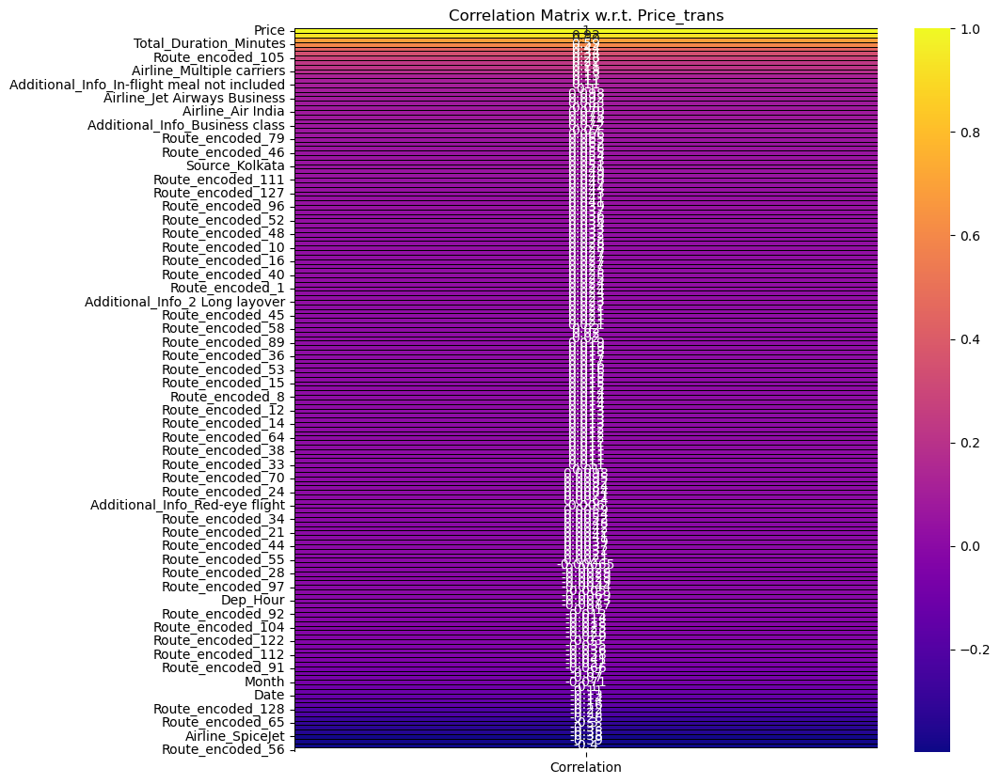

In [132]:
corr = df.corrwith(df['Price']).sort_values(ascending = False).to_frame()
corr.columns = ['Correlation']
plt.subplots(figsize = (10,10))
sns.heatmap(corr, annot=True, cmap='plasma', linewidths = 0.4, linecolor='black')
plt.title("Correlation Matrix w.r.t. Price_trans")
plt.show()

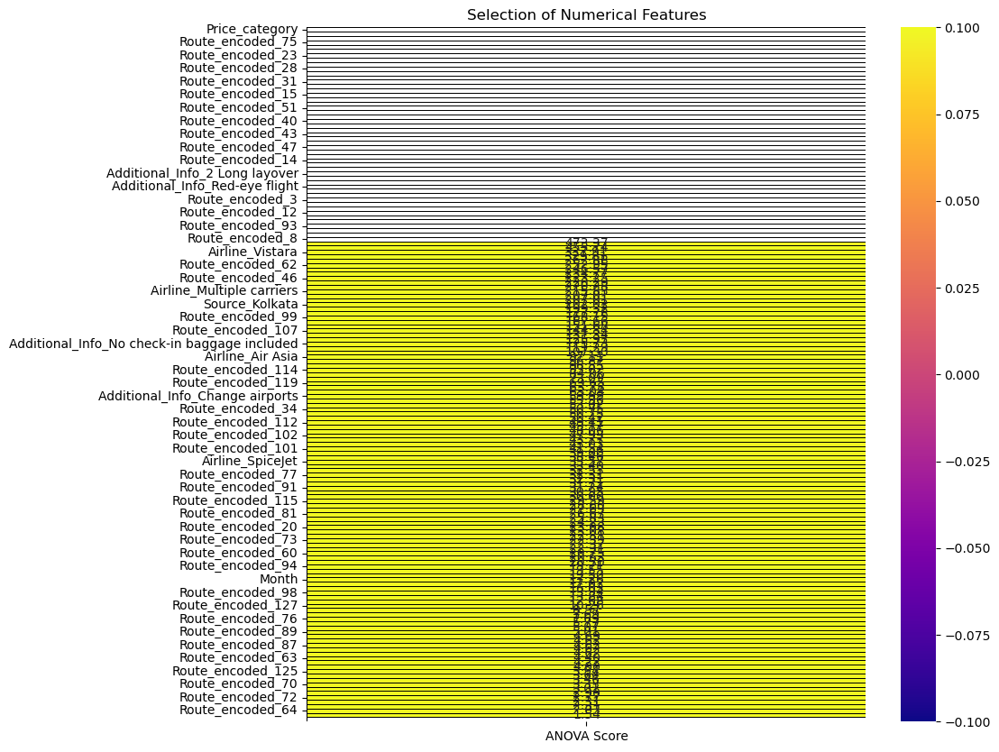

In [133]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_classif
features = df.drop(columns=['Price'])
target = df.Price

best_features = SelectKBest(score_func = f_classif, k='all')
fit = best_features.fit(features, target)

featureScores = pd.DataFrame(data = fit.scores_, index= list(features.columns),
                             columns = ['ANOVA Score'])

plt.subplots(figsize=(10,10))
sns.heatmap(featureScores.sort_values(ascending = False, by = 'ANOVA Score'),
            annot=True, cmap = 'plasma', linewidths = 0.4, linecolor = 'black', fmt = '.2f');
plt.title('Selection of Numerical Features')
plt.show()

In [134]:
corr[(corr['Correlation']< 0.1) & (corr['Correlation']>-0.1)]

,Correlation
Route_encoded_98,0.099610
Route_encoded_114,0.097547
Airline_Jet Airways Business,0.092103
Route_encoded_100,0.082939
Route_encoded_118,0.079637
...,...
Dep_Minute,-0.052162
Route_encoded_91,-0.065949
Route_encoded_107,-0.069798
Route_encoded_81,-0.069851


In [135]:
featureScores[featureScores['ANOVA Score']<100].sort_values(by='ANOVA Score')

,ANOVA Score
Route_encoded_57,1.538769
Route_encoded_64,2.030679
Route_encoded_82,2.308374
Route_encoded_24,2.308374
Route_encoded_72,2.769430
...,...
Route_encoded_111,84.061078
Route_encoded_114,93.020174
Route_encoded_106,96.551575
Route_encoded_17,96.872563


In [136]:
df.columns

Index(['Total_Stops', 'Price', 'Date', 'Month', 'Dep_Hour', 'Dep_Minute',
       'Arr_Hour', 'Arr_Minute', 'Total_Duration_Minutes',
       'Additional_Info_1 Long layover',
       ...
       'Airline_Jet Airways Business', 'Airline_Multiple carriers',
       'Airline_SpiceJet', 'Airline_Vistara', 'Source_Banglore',
       'Source_Chennai', 'Source_Delhi', 'Source_Kolkata', 'Source_Mumbai',
       'Price_category'],
      dtype='object', length=160)

In [137]:
# Let's define a function for the multiple regression
def OLS_Regression_Stats(x,y):
    
    x = sm.add_constant(x)
    
    # defining the model, fitting the model and printing the model summary
    sm_model = sm.OLS(y,x).fit()
    print(sm_model.summary())

In [138]:
OLS_Regression_Stats(df.drop(columns=['Price']),df['Price'])

                            OLS Regression Results                            
Dep. Variable:                  Price   R-squared:                       0.923
Model:                            OLS   Adj. R-squared:                  0.922
Method:                 Least Squares   F-statistic:                     823.3
Date:                Wed, 04 Sep 2024   Prob (F-statistic):               0.00
Time:                        12:11:48   Log-Likelihood:                 5505.7
No. Observations:               10445   AIC:                        -1.071e+04
Df Residuals:                   10294   BIC:                            -9614.
Df Model:                         150                                         
Covariance Type:            nonrobust                                         
                                                   coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------

In [139]:
#df.drop(columns=['Date','Month','Dep_Hour','Dep_Minute','Arr_Hour','Arr_Minute','Airline_GoAir'],inplace=True)

<Axes: xlabel='Total_Duration_Minutes', ylabel='count'>

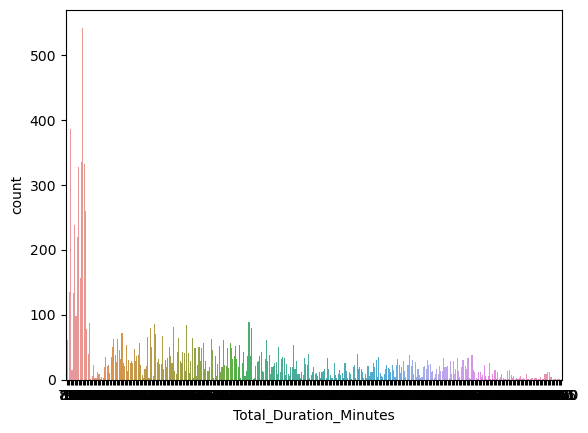

In [140]:
sns.countplot(data=df,x=df['Total_Duration_Minutes'])

In [141]:
#df['Total_Duration_Minutes']=np.log(df['Total_Duration_Minutes'])

In [142]:
df.columns

Index(['Total_Stops', 'Price', 'Date', 'Month', 'Dep_Hour', 'Dep_Minute',
       'Arr_Hour', 'Arr_Minute', 'Total_Duration_Minutes',
       'Additional_Info_1 Long layover',
       ...
       'Airline_Jet Airways Business', 'Airline_Multiple carriers',
       'Airline_SpiceJet', 'Airline_Vistara', 'Source_Banglore',
       'Source_Chennai', 'Source_Delhi', 'Source_Kolkata', 'Source_Mumbai',
       'Price_category'],
      dtype='object', length=160)

In [143]:
df.shape

(10445, 160)

In [144]:
df.corr()

,Total_Stops,Price,Date,Month,Dep_Hour,Dep_Minute,Arr_Hour,Arr_Minute,Total_Duration_Minutes,Additional_Info_1 Long layover,Additional_Info_1 Short layover,Additional_Info_2 Long layover,Additional_Info_Business class,Additional_Info_Change airports,Additional_Info_In-flight meal not included,Additional_Info_No check-in baggage included,Additional_Info_Red-eye flight,Route_encoded_1,Route_encoded_2,Route_encoded_3,Route_encoded_4,Route_encoded_5,Route_encoded_6,Route_encoded_7,Route_encoded_8,Route_encoded_9,Route_encoded_10,Route_encoded_11,Route_encoded_12,Route_encoded_13,Route_encoded_14,Route_encoded_15,Route_encoded_16,Route_encoded_17,Route_encoded_18,Route_encoded_19,Route_encoded_20,Route_encoded_21,Route_encoded_22,Route_encoded_23,Route_encoded_24,Route_encoded_25,Route_encoded_26,Route_encoded_27,Route_encoded_28,Route_encoded_29,Route_encoded_30,Route_encoded_31,Route_encoded_32,Route_encoded_33,Route_encoded_34,Route_encoded_35,Route_encoded_36,Route_encoded_37,Route_encoded_38,Route_encoded_39,Route_encoded_40,Route_encoded_41,Route_encoded_42,Route_encoded_43,Route_encoded_44,Route_encoded_45,Route_encoded_46,Route_encoded_47,Route_encoded_48,Route_encoded_49,Route_encoded_50,Route_encoded_51,Route_encoded_52,Route_encoded_53,Route_encoded_54,Route_encoded_55,Route_encoded_56,Route_encoded_57,Route_encoded_58,Route_encoded_59,Route_encoded_60,Route_encoded_61,Route_encoded_62,Route_encoded_63,Route_encoded_64,Route_encoded_65,Route_encoded_66,Route_encoded_67,Route_encoded_68,Route_encoded_69,Route_encoded_70,Route_encoded_71,Route_encoded_72,Route_encoded_73,Route_encoded_74,Route_encoded_75,Route_encoded_76,Route_encoded_77,Route_encoded_78,Route_encoded_79,Route_encoded_80,Route_encoded_81,Route_encoded_82,Route_encoded_83,Route_encoded_84,Route_encoded_85,Route_encoded_86,Route_encoded_87,Route_encoded_88,Route_encoded_89,Route_encoded_90,Route_encoded_91,Route_encoded_92,Route_encoded_93,Route_encoded_94,Route_encoded_95,Route_encoded_96,Route_encoded_97,Route_encoded_98,Route_encoded_99,Route_encoded_100,Route_encoded_101,Route_encoded_102,Route_encoded_103,Route_encoded_104,Route_encoded_105,Route_encoded_106,Route_encoded_107,Route_encoded_108,Route_encoded_109,Route_encoded_110,Route_encoded_111,Route_encoded_112,Route_encoded_113,Route_encoded_114,Route_encoded_115,Route_encoded_116,Route_encoded_117,Route_encoded_118,Route_encoded_119,Route_encoded_120,Route_encoded_121,Route_encoded_122,Route_encoded_123,Route_encoded_124,Route_encoded_125,Route_encoded_126,Route_encoded_127,Route_encoded_128,Airline_Air Asia,Airline_Air India,Airline_GoAir,Airline_IndiGo,Airline_Jet Airways,Airline_Jet Airways Business,Airline_Multiple carriers,Airline_SpiceJet,Airline_Vistara,Source_Banglore,Source_Chennai,Source_Delhi,Source_Kolkata,Source_Mumbai,Price_category
Total_Stops,1.000000,0.689467,-0.019555,0.039526,-0.068049,-0.002508,0.051300,-0.107515,0.728403,0.012778,0.017736,0.017736,0.005859,0.046939,0.101972,-0.201620,-0.011878,0.012436,0.006550,0.008287,0.035477,0.058852,0.059884,0.039667,0.046025,0.017736,0.043455,0.053229,0.030723,0.039667,0.046025,0.047351,0.009719,0.058852,0.011351,-0.503664,0.005073,0.007751,0.032543,0.032543,0.032543,0.017846,0.056111,0.006550,0.005073,0.015793,0.005073,0.006550,0.004142,0.025084,0.008790,0.035477,0.025084,0.035477,0.002929,0.025084,0.046939,0.032543,0.005073,0.002929,0.017736,0.017736,0.016851,0.002929,0.039667,-0.305206,0.025084,0.017736,0.030723,0.032543,0.002929,0.005073,NaN,0.017736,0.017736,0.017736,0.009719,0.020759,0.115169,0.053229,0.046025,-0.331288,0.053229,0.096258,0.097280,0.063985,0.043455,0.035477,0.025084,0.081355,0.071577,0.095640,0.065096,0.035477,0.018790,0.109527,0.072783,0.021376,0.002929,0.013110,0.017736,0.043455,0.120552,0.017736,0.063985,0.043455,0.009266,0.023686,0.008790,0.009266,0.012778,0.017736,0.056111,0.002929,0.214305,0.014661,0.112383,0.006550,0.092274,0.123157,0.045112,0.161846,0.117891,-0.175146,0.025084,0.117891,0.092077,0.119229,0.053

In [145]:
df[df['Total_Stops']==4]

,Total_Stops,Price,Date,Month,Dep_Hour,Dep_Minute,Arr_Hour,Arr_Minute,Total_Duration_Minutes,Additional_Info_1 Long layover,Additional_Info_1 Short layover,Additional_Info_2 Long layover,Additional_Info_Business class,Additional_Info_Change airports,Additional_Info_In-flight meal not included,Additional_Info_No check-in baggage included,Additional_Info_Red-eye flight,Route_encoded_1,Route_encoded_2,Route_encoded_3,Route_encoded_4,Route_encoded_5,Route_encoded_6,Route_encoded_7,Route_encoded_8,Route_encoded_9,Route_encoded_10,Route_encoded_11,Route_encoded_12,Route_encoded_13,Route_encoded_14,Route_encoded_15,Route_encoded_16,Route_encoded_17,Route_encoded_18,Route_encoded_19,Route_encoded_20,Route_encoded_21,Route_encoded_22,Route_encoded_23,Route_encoded_24,Route_encoded_25,Route_encoded_26,Route_encoded_27,Route_encoded_28,Route_encoded_29,Route_encoded_30,Route_encoded_31,Route_encoded_32,Route_encoded_33,Route_encoded_34,Route_encoded_35,Route_encoded_36,Route_encoded_37,Route_encoded_38,Route_encoded_39,Route_encoded_40,Route_encoded_41,Route_encoded_42,Route_encoded_43,Route_encoded_44,Route_encoded_45,Route_encoded_46,Route_encoded_47,Route_encoded_48,Route_encoded_49,Route_encoded_50,Route_encoded_51,Route_encoded_52,Route_encoded_53,Route_encoded_54,Route_encoded_55,Route_encoded_56,Route_encoded_57,Route_encoded_58,Route_encoded_59,Route_encoded_60,Route_encoded_61,Route_encoded_62,Route_encoded_63,Route_encoded_64,Route_encoded_65,Route_encoded_66,Route_encoded_67,Route_encoded_68,Route_encoded_69,Route_encoded_70,Route_encoded_71,Route_encoded_72,Route_encoded_73,Route_encoded_74,Route_encoded_75,Route_encoded_76,Route_encoded_77,Route_encoded_78,Route_encoded_79,Route_encoded_80,Route_encoded_81,Route_encoded_82,Route_encoded_83,Route_encoded_84,Route_encoded_85,Route_encoded_86,Route_encoded_87,Route_encoded_88,Route_encoded_89,Route_encoded_90,Route_encoded_91,Route_encoded_92,Route_encoded_93,Route_encoded_94,Route_encoded_95,Route_encoded_96,Route_encoded_97,Route_encoded_98,Route_encoded_99,Route_encoded_100,Route_encoded_101,Route_encoded_102,Route_encoded_103,Route_encoded_104,Route_encoded_105,Route_encoded_106,Route_encoded_107,Route_encoded_108,Route_encoded_109,Route_encoded_110,Route_encoded_111,Route_encoded_112,Route_encoded_113,Route_encoded_114,Route_encoded_115,Route_encoded_116,Route_encoded_117,Route_encoded_118,Route_encoded_119,Route_encoded_120,Route_encoded_121,Route_encoded_122,Route_encoded_123,Route_encoded_124,Route_encoded_125,Route_encoded_126,Route_encoded_127,Route_encoded_128,Airline_Air Asia,Airline_Air India,Airline_GoAir,Airline_IndiGo,Airline_Jet Airways,Airline_Jet Airways Business,Airline_Multiple carriers,Airline_SpiceJet,Airline_Vistara,Source_Banglore,Source_Chennai,Source_Delhi,Source_Kolkata,Source_Mumbai,Price_category
9182,4,9.780529,1,3,5,50,11,20,1770,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,4


In [146]:
df.shape

(10445, 160)

In [147]:
# only 1 row with 4 stops, thus we can drop it
#df=df[df['Total_Stops']!=4]

In [148]:
df.columns

Index(['Total_Stops', 'Price', 'Date', 'Month', 'Dep_Hour', 'Dep_Minute',
       'Arr_Hour', 'Arr_Minute', 'Total_Duration_Minutes',
       'Additional_Info_1 Long layover',
       ...
       'Airline_Jet Airways Business', 'Airline_Multiple carriers',
       'Airline_SpiceJet', 'Airline_Vistara', 'Source_Banglore',
       'Source_Chennai', 'Source_Delhi', 'Source_Kolkata', 'Source_Mumbai',
       'Price_category'],
      dtype='object', length=160)

In [149]:
df.shape

(10445, 160)

## **Model Training**

In [150]:
X=df.drop(columns=['Price'])
y=df.Price

In [151]:

from sklearn.model_selection import train_test_split


# Original Split
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.2, random_state=100,stratify=df['Price_category'])
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)


print("Train set shape:", X_train.shape, y_train.shape)
print("Validation set shape:", X_val.shape, y_val.shape)
print("Test set shape:", X_test.shape, y_test.shape)

Train set shape: (8356, 159) (8356,)
Validation set shape: (1044, 159) (1044,)
Test set shape: (1045, 159) (1045,)


In [152]:
# X_train['Price_category'].value_counts()

In [153]:
3287/7311

0.44959649842702776

In [154]:
# X_temp['Price_category'].value_counts()

In [155]:
1372/3134

0.4377791959157626

In [156]:
# X_test['Price_category'].value_counts()

In [157]:
691/1567

0.4409700063816209

In [158]:
# X_val['Price_category'].value_counts()

In [159]:
681/1567

0.4345883854499043

___
#### Scaling Train,Test, Val sets with StandardScaler

In [160]:
from sklearn.preprocessing import StandardScaler

# Initialize the scaler
scaler = StandardScaler()

# Fit the scaler on the training data and transform the training data
X_train = scaler.fit_transform(X_train)

# Transform the validation and test data using the same scaler
X_val = scaler.transform(X_val)
X_test = scaler.transform(X_test)

In [161]:
pd.DataFrame(X_train)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158
0,0.301115,0.891509,0.254998,1.313776,-1.306610,-1.376175,0.923382,-0.217181,-0.040967,0.0,-0.01094,-0.015473,-0.026806,-0.471732,-0.1767,0.0,-0.0438,-0.021884,-0.030957,-0.015473,-0.032836,-0.197598,-0.024469,-0.015473,-0.01094,-0.026806,-0.028956,-0.018951,-0.021884,-0.015473,-0.01094,-0.026806,-0.036306,-0.036306,-0.41645,-0.018951,-0.026806,0.0,0.0,0.0,-0.062968,-0.034615,-0.024469,-0.015473,-0.057984,-0.018951,-0.021884,0.0,-0.01094,-0.026806,-0.018951,-0.015473,-0.021884,-0.01094,-0.01094,-0.024469,-0.01094,-0.018951,-0.01094,-0.01094,-0.01094,-0.05478,0.0,-0.021884,-0.252012,-0.01094,0.0,-0.015473,-0.01094,-0.01094,-0.018951,0.0,-0.01094,-0.01094,-0.01094,-0.034615,-0.066691,-0.066691,-0.028956,-0.015473,-0.275128,-0.028956,3.147795,-0.056936,-0.036306,-0.026806,-0.018951,-0.015473,-0.0438,-0.241366,-0.051379,-0.018951,-0.021884,-0.063918,-0.063918,-0.018951,-0.07022,0.0,-0.0438,-0.01094,-0.021884,-0.068478,-0.01094,-0.032836,-0.021884,-0.030957,-0.082875,-0.026806,-0.028956,-0.042407,-0.01094,-0.032836,-0.01094,-0.119682,-0.047739,-0.061022,-0.024469,-0.050195,-0.069354,-0.147108,-0.541570,-0.063918,-0.147108,-0.01094,-0.064855,-0.030957,-0.064855,-0.180976,-0.088543,-0.089906,-0.034615,-0.034615,-0.13101,-0.056936,-0.064855,-0.0438,-0.032836,-0.117084,-0.061022,-0.065779,-0.036306,-0.034615,-0.0438,-0.189614,-0.1767,-0.440324,-0.136571,-0.496033,1.368741,-0.018951,-0.362605,-0.291881,-0.225692,-0.515253,-0.189614,-0.840240,1.62364,-0.267244,0.629165
1,0.301115,-0.171331,1.116957,0.265131,-1.040401,-0.500326,-1.191772,1.141713,-0.040967,0.0,-0.01094,-0.015473,-0.026806,-0.471732,-0.1767,0.0,-0.0438,-0.021884,-0.030957,-0.015473,-0.032836,-0.197598,-0.024469,-0.015473,-0.01094,-0.026806,-0.028956,-0.018951,-0.021884,-0.015473,-0.01094,-0.026806,-0.036306,-0.036306,-0.41645,-0.018951,-0.026806,0.0,0.0,0.0,-0.062968,-0.034615,-0.024469,-0.015473,-0.057984,-0.018951,-0.021884,0.0,-0.01094,-0.026806,-0.018951,-0.015473,-0.021884,-0.01094,-0.01094,-0.024469,-0.01094,-0.018951,-0.01094,-0.01094,-0.01094,-0.05478,0.0,-0.021884,-0.252012,-0.01094,0.0,-0.015473,-0.01094,-0.01094,-0.018951,0.0,-0.01094,-0.01094,-0.01094,-0.034615,-0.066691,-0.066691,-0.028956,-0.015473,-0.275128,-0.028956,3.147795,-0.056936,-0.036306,-0.026806,-0.018951,-0.015473,-0.0438,-0.241366,-0.051379,-0.018951,-0.021884,-0.063918,-0.063918,-0.018951,-0.07022,0.0,-0.0438,-0.01094,-0.021884,-0.068478,-0.01094,-0.032836,-0.021884,-0.030957,-0.082875,-0.026806,-0.028956,-0.042407,-0.01094,-0.032836,-0.01094,-0.119682,-0.047739,-0.061022,-0.024469,-0.050195,-0.069354,-0.147108,-0.541570,-0.063918,-0.147108,-0.01094,-0.064855,-0.030957,-0.064855,-0.180976,-0.088543,-0.089906,-0.034615,-0.034615,-0.13101,-0.056936,-0.064855,-0.0438,-0.032836,-0.117084,-0.061022,-0.065779,-0.036306,-0.034615,-0.0438,-0.189614,-0.1767,-0.440324,-0.136571,-0.496033,1.368741,-0.018951,-0.362605,-0.291881,-0.225692,-0.515253,-0.189614,-0.840240,1.62364,-0.267244,0.629165
2,1.813204,1.600068,-1.468921,1.139002,-0.774192,0.813448,1.225546,1.691266,-0.040967,0.0,-0.01094,-0.015473,-0.026806,-0.471732,-0.1767,0.0,-0.0438,-0.021884,-0.030957,-0.015473,-0.032836,-0.197598,-0.024469,-0.015473,-0.01094,-0.026806,-0.028956,-0.018951,-0.021884,-0.015473,-0.01094,-0.026806,-0.036306,-0.036306,-0.41645,-0.018951,-0.026806,0.0,0.0,0.0,-0.062968,-0.034615,-0.024469,-0.015473,-0.057984,-0.018951,-0.021884,0.0,-0.01094,-0.026806,-0.018951,-0.015473,-0.021884,-0.01094,-0.01094,-0.0244

___
### LRM

In [162]:
lrm=LinearRegression()
lrm.fit(X_train,y_train)

LinearRegression()

In [163]:
#                                       Make predictions on the train set
y_train_pred_lrm = lrm.predict(X_train)

# Calculate evaluation metrics on the X_train2 set
mse_lrm_tr = mean_squared_error(y_train, y_train_pred_lrm)
rmse_lrm_tr = mse_lrm_tr ** 0.5
mape_lrm_tr = mean_absolute_percentage_error(y_train, y_train_pred_lrm) * 100
r2_lrm_tr = r2_score(y_train, y_train_pred_lrm)

# Adjusted R-squared
n = len(y_train)
p = X_train.shape[1]
adjusted_r2_lrm_tr = 1 - (1 - r2_lrm_tr) * (n - 1) / (n - p - 1)

#  Evaluation metrics
print('*** Linear Regression model ***')
print("Train2 Set Performance:")
print("Linear Regression - MSE:", mse_lrm_tr)
print("Linear Regression - RMSE:", rmse_lrm_tr)
print("Mean Absolute Percentage Error (MAPE):", round(mape_lrm_tr, 2), '%')
print("Linear Regression - R-squared:", r2_lrm_tr)
print("Adjusted R-squared:", adjusted_r2_lrm_tr)

print('__'*20)


#                                      Make predictions on the test set
y_test_pred_lrm = lrm.predict(X_test)

# Calculate evaluation metrics on the test set
mse_lrm_ts = mean_squared_error(y_test, y_test_pred_lrm)
rmse_lrm_ts = mse_lrm_ts ** 0.5
mape_lrm_ts = mean_absolute_percentage_error(y_test, y_test_pred_lrm) * 100
r2_lrm_ts = r2_score(y_test, y_test_pred_lrm)

# Adjusted R-squared
n = len(y_test)
p = X_test.shape[1]
adjusted_r2_lrm_ts = 1 - (1 - r2_lrm_ts) * (n - 1) / (n - p - 1)

#  Evaluation metrics
print("Test2 Set Performance:")
print("Linear Regression - MSE:", mse_lrm_ts)
print("Linear Regression - RMSE:", rmse_lrm_ts)
print("Mean Absolute Percentage Error (MAPE):", round(mape_lrm_ts, 2), '%')
print("Linear Regression - R-squared:", r2_lrm_ts)
print("Adjusted R-squared:", adjusted_r2_lrm_ts)


print('__'*20)


#                                      Make predictions on the Val1 set
y_val_pred_lrm = lrm.predict(X_val)

# Calculate evaluation metrics on the Val1 set
mse_lrm_val = mean_squared_error(y_val, y_val_pred_lrm)
rmse_lrm_val = mse_lrm_val ** 0.5
mape_lrm_val = mean_absolute_percentage_error(y_val, y_val_pred_lrm) * 100
r2_lrm_val = r2_score(y_val, y_val_pred_lrm)

# Adjusted R-squared
n = len(y_val)
p = X_val.shape[1]
adjusted_r2_lrm_val = 1 - (1 - r2_lrm_val) * (n - 1) / (n - p - 1)

#  Evaluation metrics
print("Val 1 Set Performance:")
print("Linear Regression - MSE:", mse_lrm_val)
print("Linear Regression - RMSE:", rmse_lrm_val)
print("Mean Absolute Percentage Error (MAPE):", round(mape_lrm_val, 2), '%')
print("Linear Regression - R-squared:", r2_lrm_val)
print("Adjusted R-squared:", adjusted_r2_lrm_val)

print('__'*20)


*** Linear Regression model ***
Train2 Set Performance:
Linear Regression - MSE: 0.020454187013826706
Linear Regression - RMSE: 0.1430181352620244
Mean Absolute Percentage Error (MAPE): 1.25 %
Linear Regression - R-squared: 0.9228405151344087
Adjusted R-squared: 0.9213436437223017
________________________________________
Test2 Set Performance:
Linear Regression - MSE: 2.056155861772725e+21
Linear Regression - RMSE: 45344854854.46751
Mean Absolute Percentage Error (MAPE): 23451918254.02 %
Linear Regression - R-squared: -7.834954636034425e+21
Adjusted R-squared: -9.242590553694847e+21
________________________________________
Val 1 Set Performance:
Linear Regression - MSE: 1.248733536133408e+22
Linear Regression - RMSE: 111746746535.78993
Mean Absolute Percentage Error (MAPE): 81937666605.53 %
Linear Regression - R-squared: -4.653734766481545e+22
Adjusted R-squared: -5.49077529574689e+22
________________________________________


In [164]:

# Define your model
lrm = LinearRegression()

# Prepare your data (replace with your actual data)
X = df.drop(columns='Price')
y = df.Price

# Define cross-validation strategy
cv = KFold(n_splits=5, shuffle=True, random_state=42)

# Evaluate model using cross-validation
cv_results = cross_val_score(lrm, X, y, cv=cv, scoring='neg_mean_squared_error')

# Convert negative MSE to positive MSE
cv_results = -cv_results

# Print the results
print("Mean Cross-Validated MSE:", np.mean(cv_results))
print("Standard Deviation of Cross-Validated MSE:", np.std(cv_results))

Mean Cross-Validated MSE: 9068016008673.34
Standard Deviation of Cross-Validated MSE: 12502264382502.797


___
##### KdePlot for Actual and Predicted values of Train,Test, Val1, Val2 sets with Linear regression model

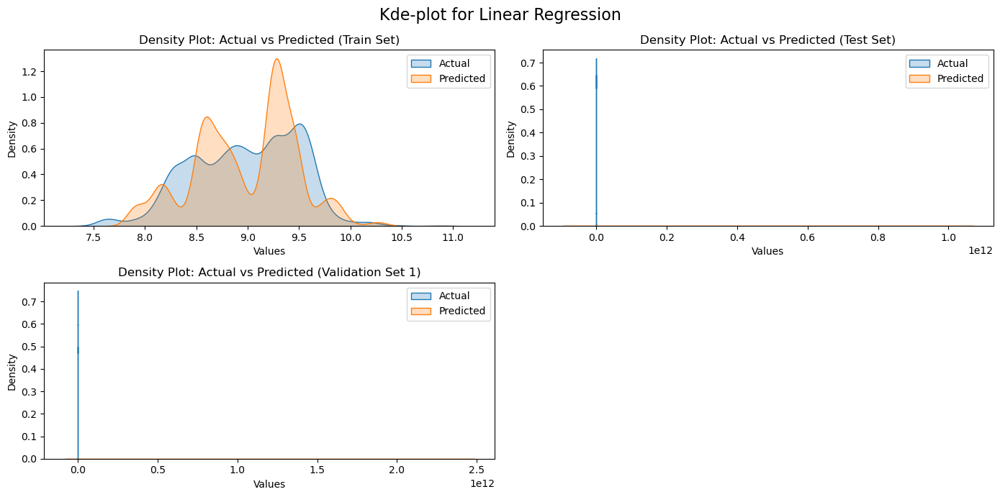

In [165]:
# Create DataFrames for actual and predicted values
train_results = pd.DataFrame({'Actual': y_train, 'Predicted': y_train_pred_lrm})
test_results = pd.DataFrame({'Actual': y_test, 'Predicted': y_test_pred_lrm})
val1_results = pd.DataFrame({'Actual': y_val, 'Predicted': y_val_pred_lrm})


# Create the plot
plt.figure(figsize=(14, 7))

# Train set
plt.subplot(2, 2, 1)
sns.kdeplot(train_results['Actual'], label='Actual', shade=True)
sns.kdeplot(train_results['Predicted'], label='Predicted', shade=True)
plt.title('Density Plot: Actual vs Predicted (Train Set)')
plt.xlabel('Values')
plt.ylabel('Density')
plt.legend()

# Test set
plt.subplot(2, 2, 2)
sns.kdeplot(test_results['Actual'], label='Actual', shade=True)
sns.kdeplot(test_results['Predicted'], label='Predicted', shade=True)
plt.title('Density Plot: Actual vs Predicted (Test Set)')
plt.xlabel('Values')
plt.ylabel('Density')
plt.legend()

# Validation set 1
plt.subplot(2, 2, 3)
sns.kdeplot(val1_results['Actual'], label='Actual', shade=True)
sns.kdeplot(val1_results['Predicted'], label='Predicted', shade=True)
plt.title('Density Plot: Actual vs Predicted (Validation Set 1)')
plt.xlabel('Values')
plt.ylabel('Density')
plt.legend()



plt.suptitle('Kde-plot for Linear Regression', fontsize=16)

plt.tight_layout()
plt.show()

In [166]:
import plotly.graph_objs as go
import plotly.subplots as sp

# Create subplots: 2 rows, 2 columns
fig = sp.make_subplots(
    rows=2, cols=2,
    subplot_titles=('Train Set', 'Test Set', 'Validation Set 1'),
    shared_xaxes=False,
    shared_yaxes=False
)

# Train set
fig.add_trace(go.Histogram(x=train_results['Actual'], histnorm='probability density', name='Actual', opacity=0.6, marker=dict(color='blue')), row=1, col=1)
fig.add_trace(go.Histogram(x=train_results['Predicted'], histnorm='probability density', name='Predicted', opacity=0.6, marker=dict(color='orange')), row=1, col=1)

# Test set
fig.add_trace(go.Histogram(x=test_results['Actual'], histnorm='probability density', name='Actual', opacity=0.6, marker=dict(color='blue')), row=1, col=2)
fig.add_trace(go.Histogram(x=test_results['Predicted'], histnorm='probability density', name='Predicted', opacity=0.6, marker=dict(color='orange')), row=1, col=2)

# Validation set 1
fig.add_trace(go.Histogram(x=val1_results['Actual'], histnorm='probability density', name='Actual', opacity=0.6, marker=dict(color='blue')), row=2, col=1)
fig.add_trace(go.Histogram(x=val1_results['Predicted'], histnorm='probability density', name='Predicted', opacity=0.6, marker=dict(color='orange')), row=2, col=1)

# Update layout
fig.update_layout(
    title_text="Density Plot: Actual vs Predicted (Train, Test, Validation)",
    height=700,
    width=1000,
    showlegend=True,
    legend_title_text='Legend',
    legend=dict(
        x=1,
        y=0.5,
        traceorder='normal',
        font=dict(size=12),
    )
)

# Update x-axis and y-axis titles
fig.update_xaxes(title_text="Values")
fig.update_yaxes(title_text="Density")

# Show the plot
fig.show()


___
##### HexbinPlot for Actual and Predicted values of Train,Test, Val1, Val2 sets with Linear regression model

In [167]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import pandas as pd

# Assuming train_results, test_results, and val1_results are already defined
# Example:
# train_results = pd.DataFrame({'Actual': y_train, 'Predicted': y_train_pred_lrm})
# test_results = pd.DataFrame({'Actual': y_test, 'Predicted': y_test_pred_lrm})
# val1_results = pd.DataFrame({'Actual': y_val, 'Predicted': y_val_pred_lrm})

# Create a 2x2 subplot grid
fig = make_subplots(
    rows=2, cols=2,
    subplot_titles=(
        'Hexbin Plot: Actual vs Predicted (Train Set)',
        'Hexbin Plot: Actual vs Predicted (Test Set)',
        'Hexbin Plot: Actual vs Predicted (Validation Set 1)',
        ''  # Empty subplot or additional info
    )
)

# Define colorscales for each subplot
colorscales = ['Blues', 'Greens', 'Reds']

# Function to add Histogram2d and y=x line to a subplot
def add_hexbin_subplot(fig, row, col, df, colorscale, title):
    # Add 2D histogram
    fig.add_trace(
        go.Histogram2d(
            x=df['Actual'],
            y=df['Predicted'],
            colorscale=colorscale,
            nbinsx=50,
            nbinsy=50,
            showscale=False,
            name='Hexbin',
            hovertemplate='Actual: %{x}<br>Predicted: %{y}<br>Count: %{z}<extra></extra>'
        ),
        row=row, col=col
    )
    
    # Determine the range for the y=x line
    min_val = min(df['Actual'].min(), df['Predicted'].min())
    max_val = max(df['Actual'].max(), df['Predicted'].max())
    
    # Add y=x line
    fig.add_trace(
        go.Scatter(
            x=[min_val, max_val],
            y=[min_val, max_val],
            mode='lines',
            line=dict(color='red', dash='dash'),
            name='y=x',
            showlegend=False,
            hoverinfo='none'
        ),
        row=row, col=col
    )

# Add hexbin plots for Train, Test, and Validation sets
add_hexbin_subplot(fig, 1, 1, train_results, colorscales[0], 'Train Set')
add_hexbin_subplot(fig, 1, 2, test_results, colorscales[1], 'Test Set')
add_hexbin_subplot(fig, 2, 1, val1_results, colorscales[2], 'Validation Set 1')

# Optionally, you can add information or leave the fourth subplot empty
# For example, adding an empty annotation
fig.add_annotation(
    text="",
    xref="paper", yref="paper",
    x=0.95, y=0.05,
    showarrow=False,
    row=2, col=2
)

# Update layout
fig.update_layout(
    title_text='HexBin Plots for Linear Regression',
    height=800,
    width=1200,
    showlegend=False,
    template='plotly_white'
)

# Update axes titles for each subplot
for i in range(1, 3):
    for j in range(1, 3):
        # Skip the empty subplot
        if i == 2 and j == 2:
            continue
        fig.update_xaxes(title_text='Actual Values', row=i, col=j)
        fig.update_yaxes(title_text='Predicted Values', row=i, col=j)

# Show the plot
fig.show()


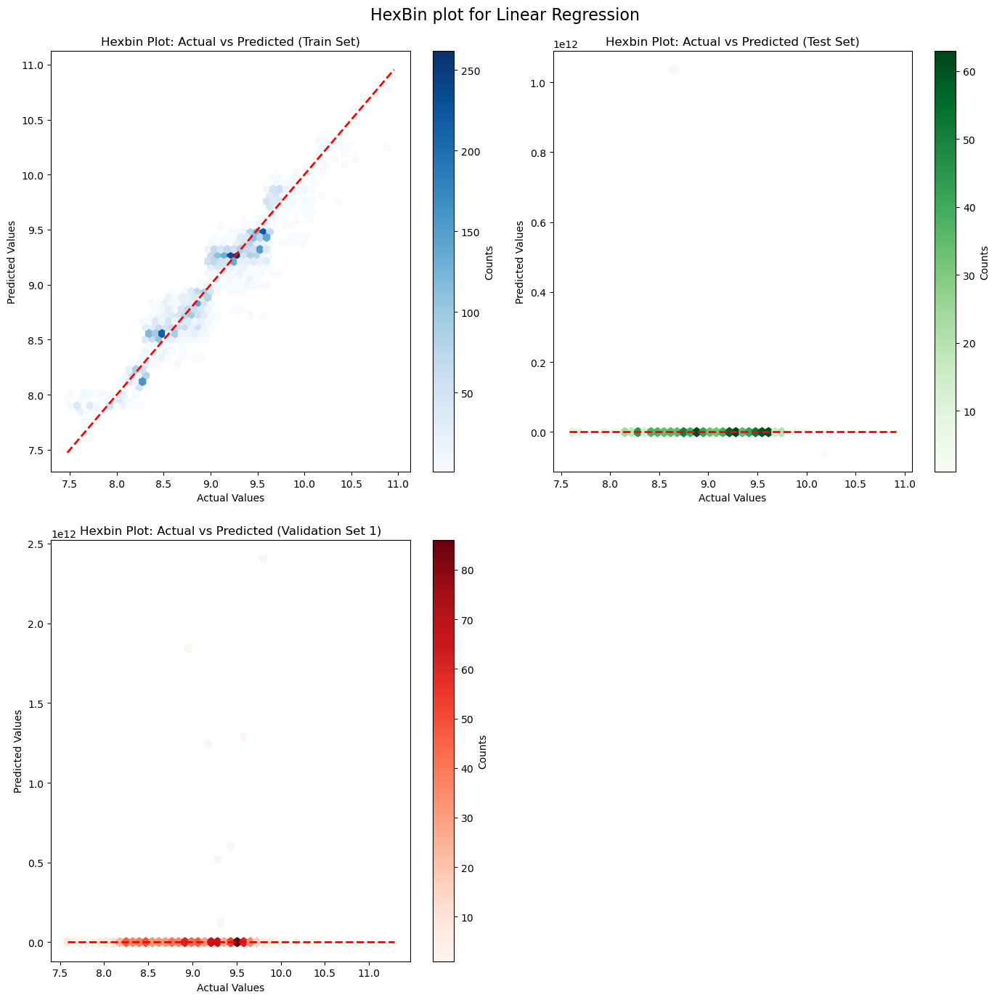

In [168]:


# Create DataFrames for actual and predicted values
train_results = pd.DataFrame({'Actual': y_train, 'Predicted': y_train_pred_lrm})
test_results = pd.DataFrame({'Actual': y_test, 'Predicted': y_test_pred_lrm})
val1_results = pd.DataFrame({'Actual': y_val, 'Predicted': y_val_pred_lrm})


# Create the plot
plt.figure(figsize=(14, 14))

# Train set
plt.subplot(2, 2, 1)
plt.hexbin(train_results['Actual'], train_results['Predicted'], gridsize=50, cmap='Blues', mincnt=1)
plt.plot([train_results['Actual'].min(), train_results['Actual'].max()], [train_results['Actual'].min(), train_results['Actual'].max()], 'r--', lw=2)
plt.title('Hexbin Plot: Actual vs Predicted (Train Set)')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.colorbar(label='Counts')

# Test set
plt.subplot(2, 2, 2)
plt.hexbin(test_results['Actual'], test_results['Predicted'], gridsize=50, cmap='Greens', mincnt=1)
plt.plot([test_results['Actual'].min(), test_results['Actual'].max()], [test_results['Actual'].min(), test_results['Actual'].max()], 'r--', lw=2)
plt.title('Hexbin Plot: Actual vs Predicted (Test Set)')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.colorbar(label='Counts')

# Validation set 1
plt.subplot(2, 2, 3)
plt.hexbin(val1_results['Actual'], val1_results['Predicted'], gridsize=50, cmap='Reds', mincnt=1)
plt.plot([val1_results['Actual'].min(), val1_results['Actual'].max()], [val1_results['Actual'].min(), val1_results['Actual'].max()], 'r--', lw=2)
plt.title('Hexbin Plot: Actual vs Predicted (Validation Set 1)')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.colorbar(label='Counts')



plt.suptitle('HexBin plot for Linear Regression', fontsize=16)

plt.tight_layout()
plt.show()



___
##### HeatMap for Actual and Predicted values of Train,Test, Val1, Val2 sets with Linear regression model

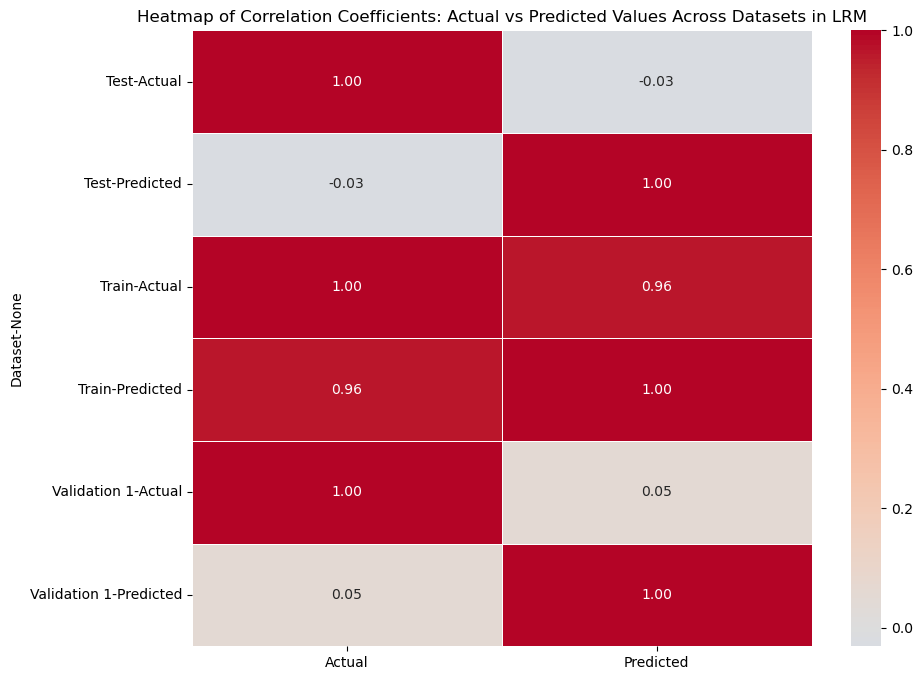

In [169]:

# Create DataFrames for actual and predicted values
train_results = pd.DataFrame({'Actual': y_train, 'Predicted': y_train_pred_lrm, 'Dataset': 'Train'})
test_results = pd.DataFrame({'Actual': y_test, 'Predicted': y_test_pred_lrm, 'Dataset': 'Test'})
val1_results = pd.DataFrame({'Actual': y_val, 'Predicted': y_val_pred_lrm, 'Dataset': 'Validation 1'})


# Concatenate all results
all_results = pd.concat([train_results, test_results, val1_results])

# Pivot data to get correlation matrix for each dataset
corr_matrix = all_results.pivot_table(index='Dataset', values=['Actual', 'Predicted'], aggfunc='corr')

# Create the heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', center=0, fmt='.2f', linewidths=.5)
plt.title('Heatmap of Correlation Coefficients: Actual vs Predicted Values Across Datasets in LRM')
plt.show()


___
##### Pairplot for Actual and Predicted values of Train,Test, Val  sets with Linear regression model

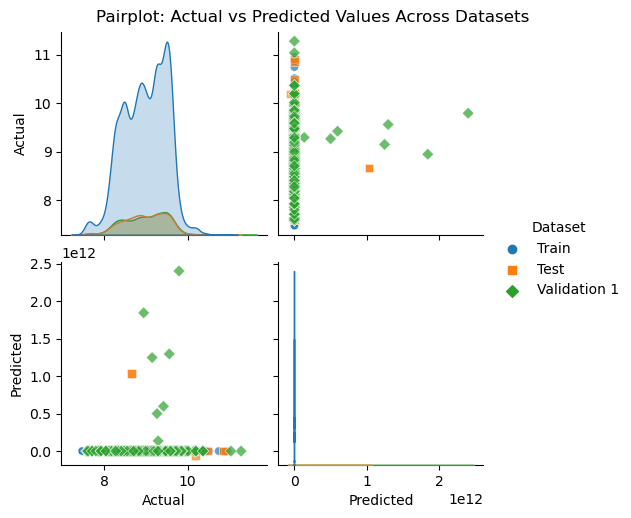

In [170]:

# Create DataFrames for actual and predicted values
train_results = pd.DataFrame({'Actual': y_train, 'Predicted': y_train_pred_lrm, 'Dataset': 'Train'})
test_results = pd.DataFrame({'Actual': y_test, 'Predicted': y_test_pred_lrm, 'Dataset': 'Test'})
val1_results = pd.DataFrame({'Actual': y_val, 'Predicted': y_val_pred_lrm, 'Dataset': 'Validation 1'})


# Concatenate all results
all_results = pd.concat([train_results, test_results, val1_results])

# Create the pairplot
sns.pairplot(all_results, hue='Dataset', palette='tab10', markers=["o", "s", "D", "^"], plot_kws={'alpha': 0.7})

# Customize plot
plt.suptitle('Pairplot: Actual vs Predicted Values Across Datasets', y=1.02)
plt.show()


___
##### t-SNE plot for Actual and Predicted values of Train,Test, Val sets with Linear regression model

In [171]:

# # Create DataFrames for actual and predicted values
# train_results = pd.DataFrame({'Actual': y_train, 'Predicted': y_train_pred_lrm, 'Dataset': 'Train'})
# test_results = pd.DataFrame({'Actual': y_test, 'Predicted': y_test_pred_lrm, 'Dataset': 'Test'})
# val1_results = pd.DataFrame({'Actual': y_val, 'Predicted': y_val_pred_lrm, 'Dataset': 'Validation 1'})

# # Concatenate all results
# all_results = pd.concat([train_results, test_results, val1_results])

# # Feature matrix for t-SNE
# X = all_results[['Actual', 'Predicted']].values
# y = all_results['Dataset'].values

# # Perform t-SNE
# tsne = TSNE(n_components=2, random_state=0)
# X_tsne = tsne.fit_transform(X)

# # Create DataFrame for t-SNE results
# tsne_results = pd.DataFrame({'Dim1': X_tsne[:, 0], 'Dim2': X_tsne[:, 1], 'Dataset': y})

# # Create the plot
# plt.figure(figsize=(12, 8))
# sns.scatterplot(data=tsne_results, x='Dim1', y='Dim2', hue='Dataset', palette='tab10', s=100, alpha=0.7)
# plt.title('t-SNE Plot: Actual vs Predicted Values Across Datasets in LRM')
# plt.xlabel('Dimension 1')
# plt.ylabel('Dimension 2')
# plt.legend(title='Dataset')
# plt.show()


___
### DTM

In [172]:
dtm = DecisionTreeRegressor(max_depth=10, random_state=42)
dtm.fit(X_train, y_train)

DecisionTreeRegressor(max_depth=10, random_state=42)

In [173]:
#                                       Make predictions on the train set
y_train_pred_dtm = dtm.predict(X_train)

# Calculate evaluation metrics on the X_train set
mse_dtm_tr = mean_squared_error(y_train, y_train_pred_dtm)
rmse_dtm_tr = mse_dtm_tr ** 0.5
mape_dtm_tr = mean_absolute_percentage_error(y_train, y_train_pred_dtm) * 100
r2_dtm_tr = r2_score(y_train, y_train_pred_dtm)

# Adjusted R-squared
n = len(y_train)
p = X_train.shape[1]
adjusted_r2_dtm_tr = 1 - (1 - r2_dtm_tr) * (n - 1) / (n - p - 1)

#  Evaluation metrics
print('*** Decision Tree Regression model ***')
print("Train Set Performance:")
print("Decision Tree Regression - MSE:", mse_dtm_tr)
print("Decision Tree Regression - RMSE:", rmse_dtm_tr)
print("Mean Absolute Percentage Error (MAPE):", round(mape_dtm_tr, 2), '%')
print("Decision Tree Regression - R-squared:", r2_dtm_tr)
print("Adjusted R-squared:", adjusted_r2_dtm_tr)

print('__'*20)


#                                      Make predictions on the test set
y_test_pred_dtm = dtm.predict(X_test)

# Calculate evaluation metrics on the test set
mse_dtm_ts = mean_squared_error(y_test, y_test_pred_dtm)
rmse_dtm_ts = mse_dtm_ts ** 0.5
mape_dtm_ts = mean_absolute_percentage_error(y_test, y_test_pred_dtm) * 100
r2_dtm_ts = r2_score(y_test, y_test_pred_dtm)

# Adjusted R-squared
n = len(y_test)
p = X_test.shape[1]
adjusted_r2_dtm_ts = 1 - (1 - r2_dtm_ts) * (n - 1) / (n - p - 1)

#  Evaluation metrics
print("Test Set Performance:")
print("Decision Tree Regression - MSE:", mse_dtm_ts)
print("Decision Tree Regression - RMSE:", rmse_dtm_ts)
print("Mean Absolute Percentage Error (MAPE):", round(mape_dtm_ts, 2), '%')
print("Decision Tree Regression - R-squared:", r2_dtm_ts)
print("Adjusted R-squared:", adjusted_r2_dtm_ts)

print('__'*20)


#                                      Make predictions on the Val set
y_val_pred_dtm = dtm.predict(X_val)

# Calculate evaluation metrics on the Val set
mse_dtm_val = mean_squared_error(y_val, y_val_pred_dtm)
rmse_dtm_val = mse_dtm_val ** 0.5
mape_dtm_val = mean_absolute_percentage_error(y_val, y_val_pred_dtm) * 100
r2_dtm_val = r2_score(y_val, y_val_pred_dtm)

# Adjusted R-squared
n = len(y_val)
p = X_val.shape[1]
adjusted_r2_dtm_val = 1 - (1 - r2_dtm_val) * (n - 1) / (n - p - 1)

#  Evaluation metrics
print("Validation Set Performance:")
print("Decision Tree Regression - MSE:", mse_dtm_val)
print("Decision Tree Regression - RMSE:", rmse_dtm_val)
print("Mean Absolute Percentage Error (MAPE):", round(mape_dtm_val, 2), '%')
print("Decision Tree Regression - R-squared:", r2_dtm_val)
print("Adjusted R-squared:", adjusted_r2_dtm_val)

print('__'*20)


*** Decision Tree Regression model ***
Train Set Performance:
Decision Tree Regression - MSE: 0.00778630879412255
Decision Tree Regression - RMSE: 0.08824006342995538
Mean Absolute Percentage Error (MAPE): 0.63 %
Decision Tree Regression - R-squared: 0.9706276482583837
Adjusted R-squared: 0.9700578332355778
________________________________________
Test Set Performance:
Decision Tree Regression - MSE: 0.011103371014906153
Decision Tree Regression - RMSE: 0.1053725344428336
Mean Absolute Percentage Error (MAPE): 0.77 %
Decision Tree Regression - R-squared: 0.957690752035769
Adjusted R-squared: 0.9500894295201614
________________________________________
Validation Set Performance:
Decision Tree Regression - MSE: 0.011206501445833288
Decision Tree Regression - RMSE: 0.10586076443061088
Mean Absolute Percentage Error (MAPE): 0.77 %
Decision Tree Regression - R-squared: 0.9582360176290416
Adjusted R-squared: 0.9507241701211431
________________________________________


___
### RFM

In [174]:
rfm = RandomForestRegressor(n_estimators=100, max_depth=10, min_samples_leaf=1, min_samples_split=10, random_state=42)
rfm.fit(X_train, y_train)

RandomForestRegressor(max_depth=10, min_samples_split=10, random_state=42)

In [175]:
#                                       Make predictions on the train set
y_train_pred_rfm = rfm.predict(X_train)

# Calculate evaluation metrics on the X_train set
mse_rfm_tr = mean_squared_error(y_train, y_train_pred_rfm)
rmse_rfm_tr = mse_rfm_tr ** 0.5
mape_rfm_tr = mean_absolute_percentage_error(y_train, y_train_pred_rfm) * 100
r2_rfm_tr = r2_score(y_train, y_train_pred_rfm)

# Adjusted R-squared
n = len(y_train)
p = X_train.shape[1]
adjusted_r2_rfm_tr = 1 - (1 - r2_rfm_tr) * (n - 1) / (n - p - 1)

#  Evaluation metrics
print('*** Random Forest Regression model ***')
print("Train Set Performance:")
print("Random Forest Regression - MSE:", mse_rfm_tr)
print("Random Forest Regression - RMSE:", rmse_rfm_tr)
print("Mean Absolute Percentage Error (MAPE):", round(mape_rfm_tr, 2), '%')
print("Random Forest Regression - R-squared:", r2_rfm_tr)
print("Adjusted R-squared:", adjusted_r2_rfm_tr)

print('__'*20)


#                                      Make predictions on the test set
y_test_pred_rfm = rfm.predict(X_test)

# Calculate evaluation metrics on the test set
mse_rfm_ts = mean_squared_error(y_test, y_test_pred_rfm)
rmse_rfm_ts = mse_rfm_ts ** 0.5
mape_rfm_ts = mean_absolute_percentage_error(y_test, y_test_pred_rfm) * 100
r2_rfm_ts = r2_score(y_test, y_test_pred_rfm)

# Adjusted R-squared
n = len(y_test)
p = X_test.shape[1]
adjusted_r2_rfm_ts = 1 - (1 - r2_rfm_ts) * (n - 1) / (n - p - 1)

#  Evaluation metrics
print("Test Set Performance:")
print("Random Forest Regression - MSE:", mse_rfm_ts)
print("Random Forest Regression - RMSE:", rmse_rfm_ts)
print("Mean Absolute Percentage Error (MAPE):", round(mape_rfm_ts, 2), '%')
print("Random Forest Regression - R-squared:", r2_rfm_ts)
print("Adjusted R-squared:", adjusted_r2_rfm_ts)

print('__'*20)


#                                      Make predictions on the Val set
y_val_pred_rfm = rfm.predict(X_val)

# Calculate evaluation metrics on the Val set
mse_rfm_val = mean_squared_error(y_val, y_val_pred_rfm)
rmse_rfm_val = mse_rfm_val ** 0.5
mape_rfm_val = mean_absolute_percentage_error(y_val, y_val_pred_rfm) * 100
r2_rfm_val = r2_score(y_val, y_val_pred_rfm)

# Adjusted R-squared
n = len(y_val)
p = X_val.shape[1]
adjusted_r2_rfm_val = 1 - (1 - r2_rfm_val) * (n - 1) / (n - p - 1)

#  Evaluation metrics
print("Validation Set Performance:")
print("Random Forest Regression - MSE:", mse_rfm_val)
print("Random Forest Regression - RMSE:", rmse_rfm_val)
print("Mean Absolute Percentage Error (MAPE):", round(mape_rfm_val, 2), '%')
print("Random Forest Regression - R-squared:", r2_rfm_val)
print("Adjusted R-squared:", adjusted_r2_rfm_val)

print('__'*20)


*** Random Forest Regression model ***
Train Set Performance:
Random Forest Regression - MSE: 0.006777954946778247
Random Forest Regression - RMSE: 0.08232833623229761
Mean Absolute Percentage Error (MAPE): 0.64 %
Random Forest Regression - R-squared: 0.9744314691274668
Adjusted R-squared: 0.9739354471156644
________________________________________
Test Set Performance:
Random Forest Regression - MSE: 0.008709756513157392
Random Forest Regression - RMSE: 0.09332607627644801
Mean Absolute Percentage Error (MAPE): 0.72 %
Random Forest Regression - R-squared: 0.966811588342987
Adjusted R-squared: 0.9608489245537609
________________________________________
Validation Set Performance:
Random Forest Regression - MSE: 0.009580686819249269
Random Forest Regression - RMSE: 0.09788098292952145
Mean Absolute Percentage Error (MAPE): 0.74 %
Random Forest Regression - R-squared: 0.9642950445011925
Adjusted R-squared: 0.9578729993379455
________________________________________


___
### GBM

In [176]:
gbm = GradientBoostingRegressor(n_estimators=100, 
                                max_depth=5,
                                min_samples_split=10,
                                min_samples_leaf=5,
                                learning_rate=0.1,
                                random_state=42)

gbm.fit(X_train, y_train)

GradientBoostingRegressor(max_depth=5, min_samples_leaf=5, min_samples_split=10,
                          random_state=42)

In [177]:
#                                       Make predictions on the train set
y_train_pred_gbm = gbm.predict(X_train)

# Calculate evaluation metrics on the X_train set
mse_gbm_tr = mean_squared_error(y_train, y_train_pred_gbm)
rmse_gbm_tr = mse_gbm_tr ** 0.5
mape_gbm_tr = mean_absolute_percentage_error(y_train, y_train_pred_gbm) * 100
r2_gbm_tr = r2_score(y_train, y_train_pred_gbm)

# Adjusted R-squared
n = len(y_train)
p = X_train.shape[1]
adjusted_r2_gbm_tr = 1 - (1 - r2_gbm_tr) * (n - 1) / (n - p - 1)

#  Evaluation metrics
print('*** Gradient Boosting Machine model ***')
print("Train Set Performance:")
print("Gradient Boosting Machine - MSE:", mse_gbm_tr)
print("Gradient Boosting Machine - RMSE:", rmse_gbm_tr)
print("Mean Absolute Percentage Error (MAPE):", round(mape_gbm_tr, 2), '%')
print("Gradient Boosting Machine - R-squared:", r2_gbm_tr)
print("Adjusted R-squared:", adjusted_r2_gbm_tr)

print('__'*20)


#                                      Make predictions on the test set
y_test_pred_gbm = gbm.predict(X_test)

# Calculate evaluation metrics on the test set
mse_gbm_ts = mean_squared_error(y_test, y_test_pred_gbm)
rmse_gbm_ts = mse_gbm_ts ** 0.5
mape_gbm_ts = mean_absolute_percentage_error(y_test, y_test_pred_gbm) * 100
r2_gbm_ts = r2_score(y_test, y_test_pred_gbm)

# Adjusted R-squared
n = len(y_test)
p = X_test.shape[1]
adjusted_r2_gbm_ts = 1 - (1 - r2_gbm_ts) * (n - 1) / (n - p - 1)

#  Evaluation metrics
print("Test Set Performance:")
print("Gradient Boosting Machine - MSE:", mse_gbm_ts)
print("Gradient Boosting Machine - RMSE:", rmse_gbm_ts)
print("Mean Absolute Percentage Error (MAPE):", round(mape_gbm_ts, 2), '%')
print("Gradient Boosting Machine - R-squared:", r2_gbm_ts)
print("Adjusted R-squared:", adjusted_r2_gbm_ts)

print('__'*20)


#                                      Make predictions on the Val set
y_val_pred_gbm = gbm.predict(X_val)

# Calculate evaluation metrics on the Val set
mse_gbm_val = mean_squared_error(y_val, y_val_pred_gbm)
rmse_gbm_val = mse_gbm_val ** 0.5
mape_gbm_val = mean_absolute_percentage_error(y_val, y_val_pred_gbm) * 100
r2_gbm_val = r2_score(y_val, y_val_pred_gbm)

# Adjusted R-squared
n = len(y_val)
p = X_val.shape[1]
adjusted_r2_gbm_val = 1 - (1 - r2_gbm_val) * (n - 1) / (n - p - 1)

#  Evaluation metrics
print("Validation Set Performance:")
print("Gradient Boosting Machine - MSE:", mse_gbm_val)
print("Gradient Boosting Machine - RMSE:", rmse_gbm_val)
print("Mean Absolute Percentage Error (MAPE):", round(mape_gbm_val, 2), '%')
print("Gradient Boosting Machine - R-squared:", r2_gbm_val)
print("Adjusted R-squared:", adjusted_r2_gbm_val)

print('__'*20)


*** Gradient Boosting Machine model ***
Train Set Performance:
Gradient Boosting Machine - MSE: 0.009713027363183835
Gradient Boosting Machine - RMSE: 0.09855469224336219
Mean Absolute Percentage Error (MAPE): 0.84 %
Gradient Boosting Machine - R-squared: 0.9633594731816014
Adjusted R-squared: 0.9626486576906149
________________________________________
Test Set Performance:
Gradient Boosting Machine - MSE: 0.011189019550992841
Gradient Boosting Machine - RMSE: 0.10577816197586741
Mean Absolute Percentage Error (MAPE): 0.89 %
Gradient Boosting Machine - R-squared: 0.9573643894251528
Adjusted R-squared: 0.9497044322710277
________________________________________
Validation Set Performance:
Gradient Boosting Machine - MSE: 0.011836932514116726
Gradient Boosting Machine - RMSE: 0.10879766777884867
Mean Absolute Percentage Error (MAPE): 0.89 %
Gradient Boosting Machine - R-squared: 0.9558865500321153
Adjusted R-squared: 0.947952117289023
________________________________________


___
### ABM

In [178]:
base_estimator = DecisionTreeRegressor(max_depth=10)  
abm = AdaBoostRegressor(base_estimator=base_estimator, n_estimators=100, learning_rate=0.1, random_state=42)
abm.fit(X_train, y_train)

AdaBoostRegressor(base_estimator=DecisionTreeRegressor(max_depth=10),
                  learning_rate=0.1, n_estimators=100, random_state=42)

In [179]:
#                                       Make predictions on the train set
y_train_pred_abm = abm.predict(X_train)

# Calculate evaluation metrics on the X_train set
mse_abm_tr = mean_squared_error(y_train, y_train_pred_abm)
rmse_abm_tr = mse_abm_tr ** 0.5
mape_abm_tr = mean_absolute_percentage_error(y_train, y_train_pred_abm) * 100
r2_abm_tr = r2_score(y_train, y_train_pred_abm)

# Adjusted R-squared
n = len(y_train)
p = X_train.shape[1]
adjusted_r2_abm_tr = 1 - (1 - r2_abm_tr) * (n - 1) / (n - p - 1)

#  Evaluation metrics
print('*** AdaBoost Model ***')
print("Train Set Performance:")
print("AdaBoost - MSE:", mse_abm_tr)
print("AdaBoost - RMSE:", rmse_abm_tr)
print("Mean Absolute Percentage Error (MAPE):", round(mape_abm_tr, 2), '%')
print("AdaBoost - R-squared:", r2_abm_tr)
print("Adjusted R-squared:", adjusted_r2_abm_tr)

print('__'*20)


#                                      Make predictions on the test set
y_test_pred_abm = abm.predict(X_test)

# Calculate evaluation metrics on the test set
mse_abm_ts = mean_squared_error(y_test, y_test_pred_abm)
rmse_abm_ts = mse_abm_ts ** 0.5
mape_abm_ts = mean_absolute_percentage_error(y_test, y_test_pred_abm) * 100
r2_abm_ts = r2_score(y_test, y_test_pred_abm)

# Adjusted R-squared
n = len(y_test)
p = X_test.shape[1]
adjusted_r2_abm_ts = 1 - (1 - r2_abm_ts) * (n - 1) / (n - p - 1)

#  Evaluation metrics
print("Test Set Performance:")
print("AdaBoost - MSE:", mse_abm_ts)
print("AdaBoost - RMSE:", rmse_abm_ts)
print("Mean Absolute Percentage Error (MAPE):", round(mape_abm_ts, 2), '%')
print("AdaBoost - R-squared:", r2_abm_ts)
print("Adjusted R-squared:", adjusted_r2_abm_ts)

print('__'*20)


#                                      Make predictions on the Val set
y_val_pred_abm = abm.predict(X_val)

# Calculate evaluation metrics on the Val set
mse_abm_val = mean_squared_error(y_val, y_val_pred_abm)
rmse_abm_val = mse_abm_val ** 0.5
mape_abm_val = mean_absolute_percentage_error(y_val, y_val_pred_abm) * 100
r2_abm_val = r2_score(y_val, y_val_pred_abm)

# Adjusted R-squared
n = len(y_val)
p = X_val.shape[1]
adjusted_r2_abm_val = 1 - (1 - r2_abm_val) * (n - 1) / (n - p - 1)

#  Evaluation metrics
print("Validation Set Performance:")
print("AdaBoost - MSE:", mse_abm_val)
print("AdaBoost - RMSE:", rmse_abm_val)
print("Mean Absolute Percentage Error (MAPE):", round(mape_abm_val, 2), '%')
print("AdaBoost - R-squared:", r2_abm_val)
print("Adjusted R-squared:", adjusted_r2_abm_val)

print('__'*20)


*** AdaBoost Model ***
Train Set Performance:
AdaBoost - MSE: 0.00502461493801275
AdaBoost - RMSE: 0.07088451832391013
Mean Absolute Percentage Error (MAPE): 0.55 %
AdaBoost - R-squared: 0.9810456069457593
Adjusted R-squared: 0.9806778972708418
________________________________________
Test Set Performance:
AdaBoost - MSE: 0.008325978677090392
AdaBoost - RMSE: 0.09124680091428078
Mean Absolute Percentage Error (MAPE): 0.7 %
AdaBoost - R-squared: 0.9682739686964432
Adjusted R-squared: 0.9625740376486855
________________________________________
Validation Set Performance:
AdaBoost - MSE: 0.008463345741176067
AdaBoost - RMSE: 0.09199644417680537
Mean Absolute Percentage Error (MAPE): 0.7 %
AdaBoost - R-squared: 0.968459110629462
Adjusted R-squared: 0.962786032111458
________________________________________


*** AdaBoost Model ***
Train Set Performance:
AdaBoost - MSE: 0.004362733653817274
AdaBoost - RMSE: 0.06605099282991342
Mean Absolute Percentage Error (MAPE): 0.5 %
AdaBoost - R-squared: 0.9835334007641148
Adjusted R-squared: 0.9834610002178729
________________________________________
Test Set Performance:
AdaBoost - MSE: 0.008343847466447545
AdaBoost - RMSE: 0.09134466304304563
Mean Absolute Percentage Error (MAPE): 0.68 %
AdaBoost - R-squared: 0.969604661693614
Adjusted R-squared: 0.9689705998775747
________________________________________
Validation Set Performance:
AdaBoost - MSE: 0.008586454567864365
AdaBoost - RMSE: 0.09266312409941921
Mean Absolute Percentage Error (MAPE): 0.71 %
AdaBoost - R-squared: 0.9665464456888052
Adjusted R-squared: 0.9658485879717529
________________________________________

___
### XGBM

In [180]:
# Instantiate the model
xgbm = xgb.XGBRegressor(objective='reg:squarederror', random_state=42)

# Train the model on the training set
xgbm.fit(X_train, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=None, n_jobs=None,
             num_parallel_tree=None, random_state=42, ...)

In [181]:
#                                       Make predictions on the train set
y_train_pred_xgbm = xgbm.predict(X_train)

# Calculate evaluation metrics on the X_train set
mse_xgbm_tr = mean_squared_error(y_train, y_train_pred_xgbm)
rmse_xgbm_tr = mse_xgbm_tr ** 0.5
mape_xgbm_tr = mean_absolute_percentage_error(y_train, y_train_pred_xgbm) * 100
r2_xgbm_tr = r2_score(y_train, y_train_pred_xgbm)

# Adjusted R-squared
n = len(y_train)
p = X_train.shape[1]
adjusted_r2_xgbm_tr = 1 - (1 - r2_xgbm_tr) * (n - 1) / (n - p - 1)

#  Evaluation metrics
print('*** XGBoost Model ***')
print("Train Set Performance:")
print("XGBoost - MSE:", mse_xgbm_tr)
print("XGBoost - RMSE:", rmse_xgbm_tr)
print("Mean Absolute Percentage Error (MAPE):", round(mape_xgbm_tr, 2), '%')
print("XGBoost - R-squared:", r2_xgbm_tr)
print("Adjusted R-squared:", adjusted_r2_xgbm_tr)

print('__'*20)


#                                      Make predictions on the test set
y_test_pred_xgbm = xgbm.predict(X_test)

# Calculate evaluation metrics on the test set
mse_xgbm_ts = mean_squared_error(y_test, y_test_pred_xgbm)
rmse_xgbm_ts = mse_xgbm_ts ** 0.5
mape_xgbm_ts = mean_absolute_percentage_error(y_test, y_test_pred_xgbm) * 100
r2_xgbm_ts = r2_score(y_test, y_test_pred_xgbm)

# Adjusted R-squared
n = len(y_test)
p = X_test.shape[1]
adjusted_r2_xgbm_ts = 1 - (1 - r2_xgbm_ts) * (n - 1) / (n - p - 1)

#  Evaluation metrics
print("Test Set Performance:")
print("XGBoost - MSE:", mse_xgbm_ts)
print("XGBoost - RMSE:", rmse_xgbm_ts)
print("Mean Absolute Percentage Error (MAPE):", round(mape_xgbm_ts, 2), '%')
print("XGBoost - R-squared:", r2_xgbm_ts)
print("Adjusted R-squared:", adjusted_r2_xgbm_ts)

print('__'*20)


#                                      Make predictions on the Val set
y_val_pred_xgbm = xgbm.predict(X_val)

# Calculate evaluation metrics on the Val set
mse_xgbm_val = mean_squared_error(y_val, y_val_pred_xgbm)
rmse_xgbm_val = mse_xgbm_val ** 0.5
mape_xgbm_val = mean_absolute_percentage_error(y_val, y_val_pred_xgbm) * 100
r2_xgbm_val = r2_score(y_val, y_val_pred_xgbm)

# Adjusted R-squared
n = len(y_val)
p = X_val.shape[1]
adjusted_r2_xgbm_val = 1 - (1 - r2_xgbm_val) * (n - 1) / (n - p - 1)

#  Evaluation metrics
print("Validation Set Performance:")
print("XGBoost - MSE:", mse_xgbm_val)
print("XGBoost - RMSE:", rmse_xgbm_val)
print("Mean Absolute Percentage Error (MAPE):", round(mape_xgbm_val, 2), '%')
print("XGBoost - R-squared:", r2_xgbm_val)
print("Adjusted R-squared:", adjusted_r2_xgbm_val)

print('__'*20)


*** XGBoost Model ***
Train Set Performance:
XGBoost - MSE: 0.0046006839113038375
XGBoost - RMSE: 0.06782834150488892
Mean Absolute Percentage Error (MAPE): 0.53 %
XGBoost - R-squared: 0.9826448051743316
Adjusted R-squared: 0.9823081194767619
________________________________________
Test Set Performance:
XGBoost - MSE: 0.007604589094120148
XGBoost - RMSE: 0.08720429515866834
Mean Absolute Percentage Error (MAPE): 0.68 %
XGBoost - R-squared: 0.9710228141329982
Adjusted R-squared: 0.965816743451808
________________________________________
Validation Set Performance:
XGBoost - MSE: 0.0075322437790445815
XGBoost - RMSE: 0.08678850026958976
Mean Absolute Percentage Error (MAPE): 0.66 %
XGBoost - R-squared: 0.9719291075879224
Adjusted R-squared: 0.9668801574821302
________________________________________


___
##### KdePlot for Actual and Predicted values of Train,Test, Val1 sets with XG Boost regression model

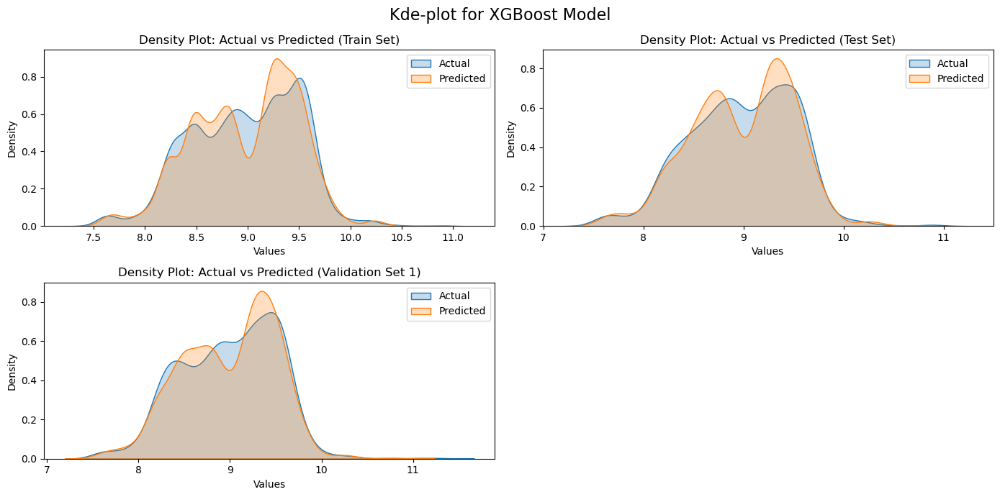

In [182]:
# Create DataFrames for actual and predicted values
train_xgbm_results = pd.DataFrame({'Actual': y_train, 'Predicted': y_train_pred_xgbm, 'Dataset': 'Train'})
test_xgbm_results = pd.DataFrame({'Actual': y_test, 'Predicted': y_test_pred_xgbm, 'Dataset': 'Test'})
val1_xgbm_results = pd.DataFrame({'Actual': y_val, 'Predicted': y_val_pred_xgbm, 'Dataset': 'Val'})


# Create the plot
plt.figure(figsize=(14, 7))

# Train set
plt.subplot(2, 2, 1)
sns.kdeplot(train_xgbm_results['Actual'], label='Actual', shade=True)
sns.kdeplot(train_xgbm_results['Predicted'], label='Predicted', shade=True)
plt.title('Density Plot: Actual vs Predicted (Train Set)')
plt.xlabel('Values')
plt.ylabel('Density')
plt.legend()

# Test set
plt.subplot(2, 2, 2)
sns.kdeplot(test_xgbm_results['Actual'], label='Actual', shade=True)
sns.kdeplot(test_xgbm_results['Predicted'], label='Predicted', shade=True)
plt.title('Density Plot: Actual vs Predicted (Test Set)')
plt.xlabel('Values')
plt.ylabel('Density')
plt.legend()

# Validation set 1
plt.subplot(2, 2, 3)
sns.kdeplot(val1_xgbm_results['Actual'], label='Actual', shade=True)
sns.kdeplot(val1_xgbm_results['Predicted'], label='Predicted', shade=True)
plt.title('Density Plot: Actual vs Predicted (Validation Set 1)')
plt.xlabel('Values')
plt.ylabel('Density')
plt.legend()



plt.suptitle('Kde-plot for XGBoost Model', fontsize=16)

plt.tight_layout()
plt.show()

___
##### HexbinPlot for Actual and Predicted values of Train,Test, Val1, Val2 sets with Linear regression model

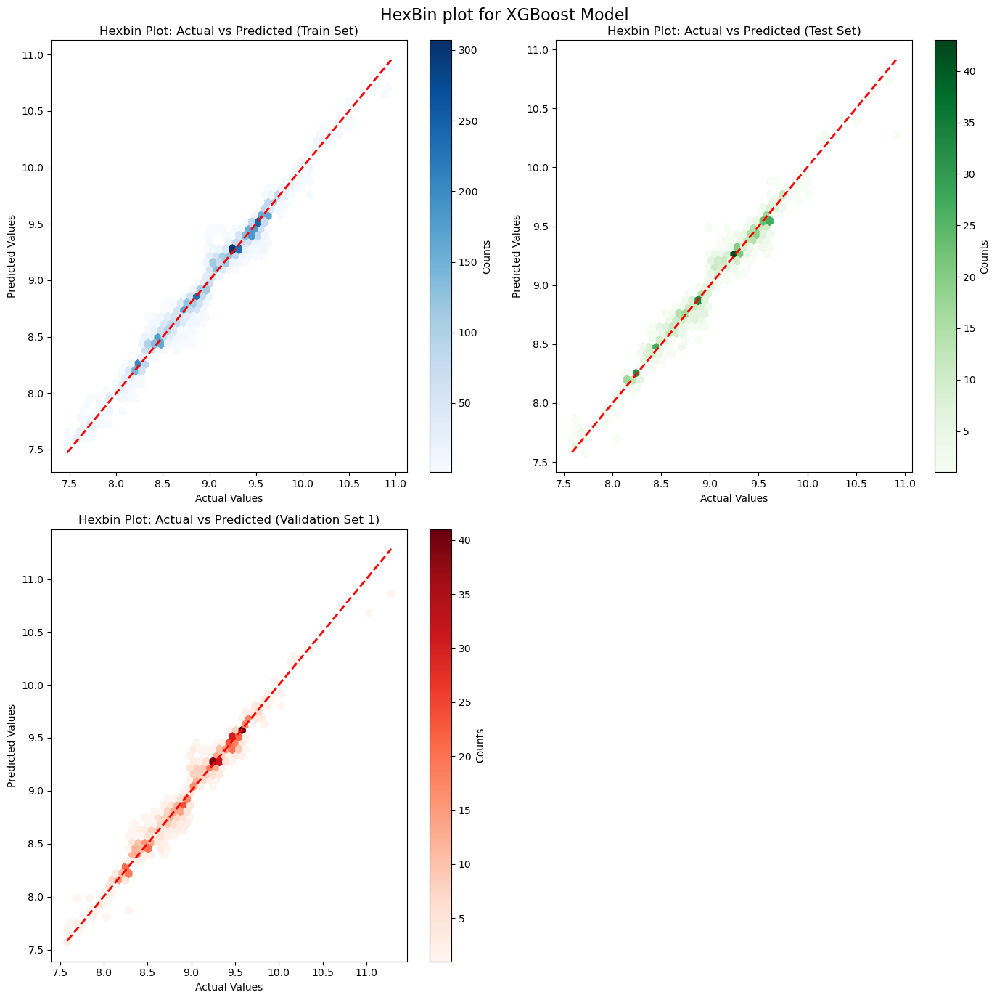

In [183]:





# Create the plot
plt.figure(figsize=(14, 14))

# Train set
plt.subplot(2, 2, 1)
plt.hexbin(train_xgbm_results['Actual'], train_xgbm_results['Predicted'], gridsize=50, cmap='Blues', mincnt=1)
plt.plot([train_xgbm_results['Actual'].min(), train_xgbm_results['Actual'].max()], [train_xgbm_results['Actual'].min(), train_xgbm_results['Actual'].max()], 'r--', lw=2)
plt.title('Hexbin Plot: Actual vs Predicted (Train Set)')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.colorbar(label='Counts')

# Test set
plt.subplot(2, 2, 2)
plt.hexbin(test_xgbm_results['Actual'], test_xgbm_results['Predicted'], gridsize=50, cmap='Greens', mincnt=1)
plt.plot([test_xgbm_results['Actual'].min(), test_xgbm_results['Actual'].max()], [test_xgbm_results['Actual'].min(), test_xgbm_results['Actual'].max()], 'r--', lw=2)
plt.title('Hexbin Plot: Actual vs Predicted (Test Set)')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.colorbar(label='Counts')

# Validation set 1
plt.subplot(2, 2, 3)
plt.hexbin(val1_xgbm_results['Actual'], val1_xgbm_results['Predicted'], gridsize=50, cmap='Reds', mincnt=1)
plt.plot([val1_xgbm_results['Actual'].min(), val1_xgbm_results['Actual'].max()], [val1_xgbm_results['Actual'].min(), val1_xgbm_results['Actual'].max()], 'r--', lw=2)
plt.title('Hexbin Plot: Actual vs Predicted (Validation Set 1)')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.colorbar(label='Counts')



plt.suptitle('HexBin plot for XGBoost Model', fontsize=16)

plt.tight_layout()
plt.show()



___
##### HeatMap for Actual and Predicted values of Train,Test, Val1, Val2 sets with Linear regression model

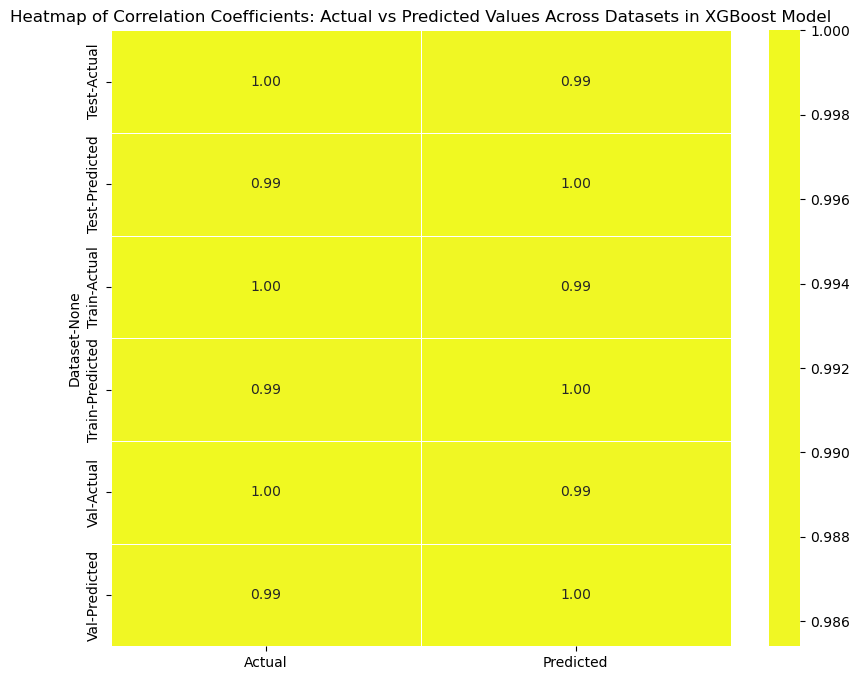

In [184]:




# Concatenate all results
all_results = pd.concat([train_xgbm_results, test_xgbm_results, val1_xgbm_results])

# Pivot data to get correlation matrix for each dataset
corr_matrix = all_results.pivot_table(index='Dataset', values=['Actual', 'Predicted'], aggfunc='corr')

# Create the heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='plasma', center=0, fmt='.2f', linewidths=.5)
plt.title('Heatmap of Correlation Coefficients: Actual vs Predicted Values Across Datasets in XGBoost Model')
plt.show()


In [185]:
corr_matrix

Actual  Predicted
Dataset                               
Test    Actual     1.000000   0.985407
        Predicted  0.985407   1.000000
Train   Actual     1.000000   0.991308
        Predicted  0.991308   1.000000
Val     Actual     1.000000   0.985870
        Predicted  0.985870   1.000000

___
## **Comparison of all models**

In [186]:

# Metrics for Linear Regression (lrm)
metrics_lrm = {
    'Model': 'Linear Regression',
    'Set': ['Train', 'Test', 'Val'],
    'MSE': [mse_lrm_tr, mse_lrm_ts, mse_lrm_val,],
    'RMSE': [rmse_lrm_tr, rmse_lrm_ts, rmse_lrm_val],
    'MAPE': [mape_lrm_tr,mape_lrm_ts,mape_lrm_val],
    'R-squared': [r2_lrm_tr, r2_lrm_ts, r2_lrm_val],
    'Adjusted R-squared': [adjusted_r2_lrm_tr, adjusted_r2_lrm_ts, adjusted_r2_lrm_val]
}




# Metrics for Decision Tree Model (dtm)
metrics_dtm = {
    'Model': 'Decision Tree Model',
    'Set': ['Train', 'Test', 'Val'],
    'MSE': [mse_dtm_tr, mse_dtm_ts, mse_dtm_val],
    'RMSE': [rmse_dtm_tr, rmse_dtm_ts, rmse_dtm_val],
    'MAPE': [mape_dtm_tr, mape_dtm_ts, mape_dtm_val],
    'R-squared': [r2_dtm_tr, r2_dtm_ts, r2_dtm_val],
    'Adjusted R-squared': [adjusted_r2_dtm_tr, adjusted_r2_dtm_ts, adjusted_r2_dtm_val]
}


# Metrics for Random Forest Model (rfm)
metrics_rfm = {
    'Model': 'Random Forest Model',
    'Set': ['Train', 'Test', 'Val'],
    'MSE': [mse_rfm_tr, mse_rfm_ts, mse_rfm_val],
    'RMSE': [rmse_rfm_tr, rmse_rfm_ts, rmse_rfm_val],
    'MAPE': [mape_rfm_tr, mape_rfm_ts, mape_rfm_val],
    'R-squared': [r2_rfm_tr, r2_rfm_ts, r2_rfm_val],
    'Adjusted R-squared': [adjusted_r2_rfm_tr, adjusted_r2_rfm_ts, adjusted_r2_rfm_val]
}

# Metrics for Gradient Boosting Machine Model (gbm)
metrics_gbm = {
    'Model': 'Gradient Boosting Machine Model',
    'Set': ['Train', 'Test', 'Val'],
    'MSE': [mse_gbm_tr, mse_gbm_ts, mse_gbm_val],
    'RMSE': [rmse_gbm_tr, rmse_gbm_ts, rmse_gbm_val],
    'MAPE': [mape_gbm_tr, mape_gbm_ts, mape_gbm_val],
    'R-squared': [r2_gbm_tr, r2_gbm_ts, r2_gbm_val],
    'Adjusted R-squared': [adjusted_r2_gbm_tr, adjusted_r2_gbm_ts, adjusted_r2_gbm_val]
}

# Metrics for AdaBoost Model (abm)
metrics_abm = {
    'Model': 'AdaBoost Model',
    'Set': ['Train', 'Test', 'Val'],
    'MSE': [mse_abm_tr, mse_abm_ts, mse_abm_val],
    'RMSE': [rmse_abm_tr, rmse_abm_ts, rmse_abm_val],
    'MAPE': [mape_abm_tr, mape_abm_ts, mape_abm_val],
    'R-squared': [r2_abm_tr, r2_abm_ts, r2_abm_val],
    'Adjusted R-squared': [adjusted_r2_abm_tr, adjusted_r2_abm_ts, adjusted_r2_abm_val]
}


# Metrics for XGBoost Model (xgbm)
metrics_xgbm = {
    'Model': 'XGBoost Model',
    'Set': ['Train', 'Test', 'Val'],
    'MSE': [mse_xgbm_tr, mse_xgbm_ts, mse_xgbm_val],
    'RMSE': [rmse_xgbm_tr, rmse_xgbm_ts, rmse_xgbm_val],
    'MAPE': [mape_xgbm_tr, mape_xgbm_ts, mape_xgbm_val],
    'R-squared': [r2_xgbm_tr, r2_xgbm_ts, r2_xgbm_val],
    'Adjusted R-squared': [adjusted_r2_xgbm_tr, adjusted_r2_xgbm_ts, adjusted_r2_xgbm_val]
}




# Create DataFrames
df_lrm = pd.DataFrame(metrics_lrm)
df_dtm = pd.DataFrame(metrics_dtm)
df_rfm = pd.DataFrame(metrics_rfm)
df_gbm = pd.DataFrame(metrics_gbm)
df_abm = pd.DataFrame(metrics_abm)
df_xgbm = pd.DataFrame(metrics_xgbm)

# Concatenate DataFrames
df_metrics = pd.concat([df_lrm, df_dtm, df_rfm, df_gbm, df_abm, df_xgbm], ignore_index=True)

df_metrics


,Model,Set,MSE,RMSE,MAPE,R-squared,Adjusted R-squared
0,Linear Regression,Train,2.045419e-02,1.430181e-01,1.253353e+00,9.228405e-01,9.213436e-01
1,Linear Regression,Test,2.056156e+21,4.534485e+10,2.345192e+10,-7.834955e+21,-9.242591e+21
2,Linear Regression,Val,1.248734e+22,1.117467e+11,8.193767e+10,-4.653735e+22,-5.490775e+22
3,Decision Tree Model,Train,7.786309e-03,8.824006e-02,6.275884e-01,9.706276e-01,9.700578e-01
4,Decision Tree Model,Test,1.110337e-02,1.053725e-01,7.707977e-01,9.576908e-01,9.500894e-01
5,Decision Tree Model,Val,1.120650e-02,1.058608e-01,7.700288e-01,9.582360e-01,9.507242e-01
6,Random Forest Model,Train,6.777955e-03,8.232834e-02,6.355306e-01,9.744315e-01,9.739354e-01
7,Random Forest Model,Test,8.709757e-03,9.332608e-02,7.157686e-01,9.668116e-01,9.608489e-01
8,Random Forest Model,Val,9.580687e-03,9.788098e-02,7.368212e-01,9.642950e-01,9.578730e-01
9,Gradient Boosting Machine Model,Train,9.713027e-03,9.855469e-02,8.389404e-01,9.633595e-01,9.626487e-01


In [187]:
# Melt the DataFrame for better plotting
df_melted = df_metrics.melt(id_vars=['Model', 'Set'], 
                            value_vars=['MSE', 'RMSE', 'MAPE', 'R-squared', 'Adjusted R-squared'], 
                            var_name='Metric', value_name='Value')
df_melted

,Model,Set,Metric,Value
0,Linear Regression,Train,MSE,2.045419e-02
1,Linear Regression,Test,MSE,2.056156e+21
2,Linear Regression,Val,MSE,1.248734e+22
3,Decision Tree Model,Train,MSE,7.786309e-03
4,Decision Tree Model,Test,MSE,1.110337e-02
...,...,...,...,...
85,AdaBoost Model,Test,Adjusted R-squared,9.625740e-01
86,AdaBoost Model,Val,Adjusted R-squared,9.627860e-01
87,XGBoost Model,Train,Adjusted R-squared,9.823081e-01
88,XGBoost Model,Test,Adjusted R-squared,9.658167e-01


In [188]:
# Pivot the DataFrame for heatmap
df_pivot = df_metrics.pivot_table(index='Model', columns='Set', values=['MSE', 'RMSE', 'MAPE', 'R-squared', 'Adjusted R-squared'])
df_pivot

Adjusted R-squared                          \
Set                                           Test     Train           Val   
Model                                                                        
AdaBoost Model                        9.625740e-01  0.980678  9.627860e-01   
Decision Tree Model                   9.500894e-01  0.970058  9.507242e-01   
Gradient Boosting Machine Model       9.497044e-01  0.962649  9.479521e-01   
Linear Regression                    -9.242591e+21  0.921344 -5.490775e+22   
Random Forest Model                   9.608489e-01  0.973935  9.578730e-01   
XGBoost Model                         9.658167e-01  0.982308  9.668802e-01   

                                         MAPE                          \
Set                                      Test     Train           Val   
Model                                                                   
AdaBoost Model                   6.955632e-01  0.554041  7.027686e-01   
Decision Tree Model              7.707977e-01  0.627588  7.700288e-01   
Gradient Boosting Machine Model  8.902271e-01  0.838940  8.887153e-01   
Linear Regression                2.345192e+10  1.253353  8.193767e+10   
Random Forest Model              7.157686e-01  0.635531  7.368212e-01   
XGBoost Model                    6.757400e-01  0.527861  6.614041e-01   

                                          MSE                          \
Set                                      Test     Train           Val   
Model                                                                   
AdaBoost Model                   8.325979e-03  0.005025  8.463346e-03   
Decision Tree Model              1.110337e-02  0.007786  1.120650e-02   
Gradient Boosting Machine Model  1.118902e-02  0.009713  1.183693e-02   
Linear Regression                2.056156e+21  0.020454  1.248734e+22   
Random Forest Model              8.709757e-03  0.006778  9.580687e-03   
XGBoost Model                    7.604589e-03  0.004601  7.532244e-03   

                                    R-squared                          \
Set                                      Test     Train           Val   
Model                                                                   
AdaBoost Model                   9.682740e-01  0.981046  9.684591e-01   
Decision Tree Model              9.576908e-01  0.970628  9.582360e-01   
Gradient Boosting Machine Model  9.573644e-01  0.963359  9.558866e-01   
Linear Regression               -7.834955e+21  0.922841 -4.653735e+22   
Random Forest Model              9.668116e-01  0.974431  9.642950e-01   
XGBoost Model                    9.710228e-01  0.982645  9.719291e-01   

                                         RMSE                          
Set                                      Test     Train           Val  
Model                                                                  
AdaBoost Model                   9.124680e-02  0.070885  9.199644e-02  
Decision Tree Model              1.053725e-01  0.088240  1.058608e-01  
Gradient Boosting Machine Model  1.057782e-01  0.098555  1.087977e-01  
Linear Regression                4.534485e+10  0.143018  1.117467e+11  
Random Forest Model              9.332608e-02  0.082328  9.788098e-02  
XGBoost Model                    8.720430e-02  0.067828  8.678850e-02

___
#### FacetGrid plot of multiple Model Performance Metrics Across Datasets

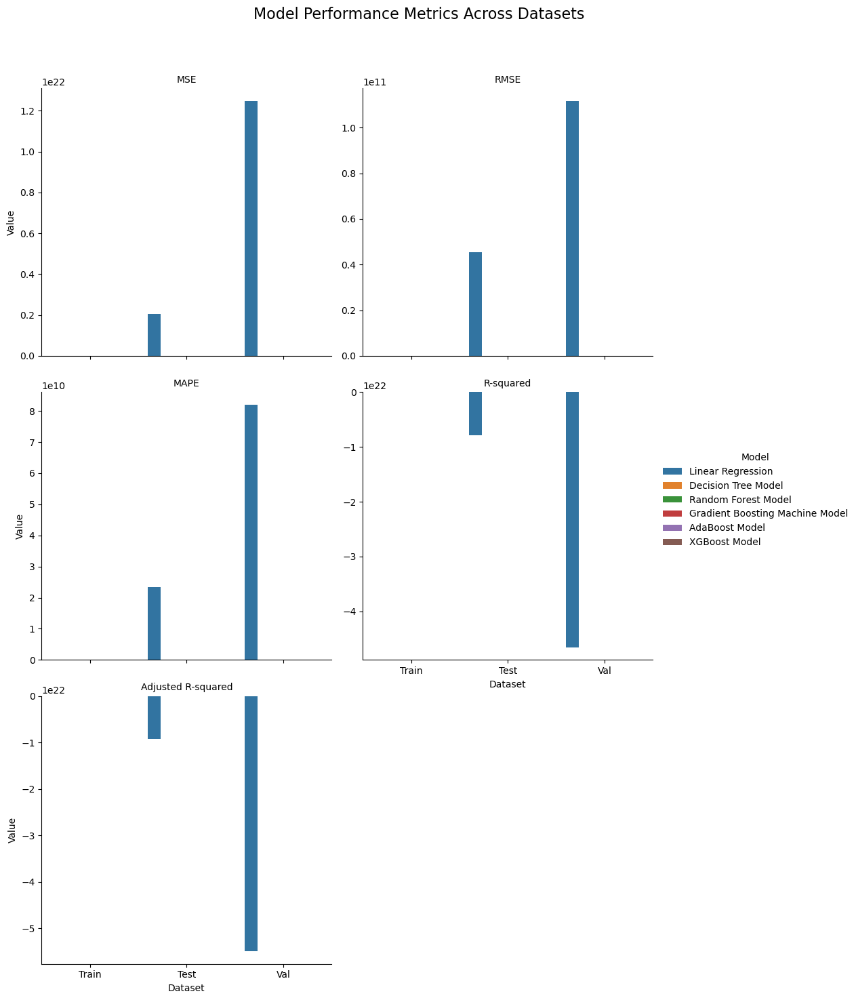

In [189]:
# Melt the DataFrame for better plotting
# df_melted = df_metrics.melt(id_vars=['Model', 'Set'], 
#                             value_vars=['MSE', 'RMSE', 'MAPE', 'R-squared', 'Adjusted R-squared'], 
#                             var_name='Metric', value_name='Value')

# Create a facet grid for each metric
g = sns.FacetGrid(df_melted, col='Metric', col_wrap=2, height=5, sharey=False)
g.map_dataframe(sns.barplot, x='Set', y='Value', hue='Model', palette='tab10')

# Add titles and adjust layout
g.set_titles(col_template='{col_name}')
g.set_axis_labels('Dataset', 'Value')
g.add_legend(title='Model')
plt.subplots_adjust(top=0.9)
g.fig.suptitle('Model Performance Metrics Across Datasets', fontsize=16)

plt.show()


___
#### BarPlot for Evaluation metrics of Multiple Model Performance Metrics Across Datasets

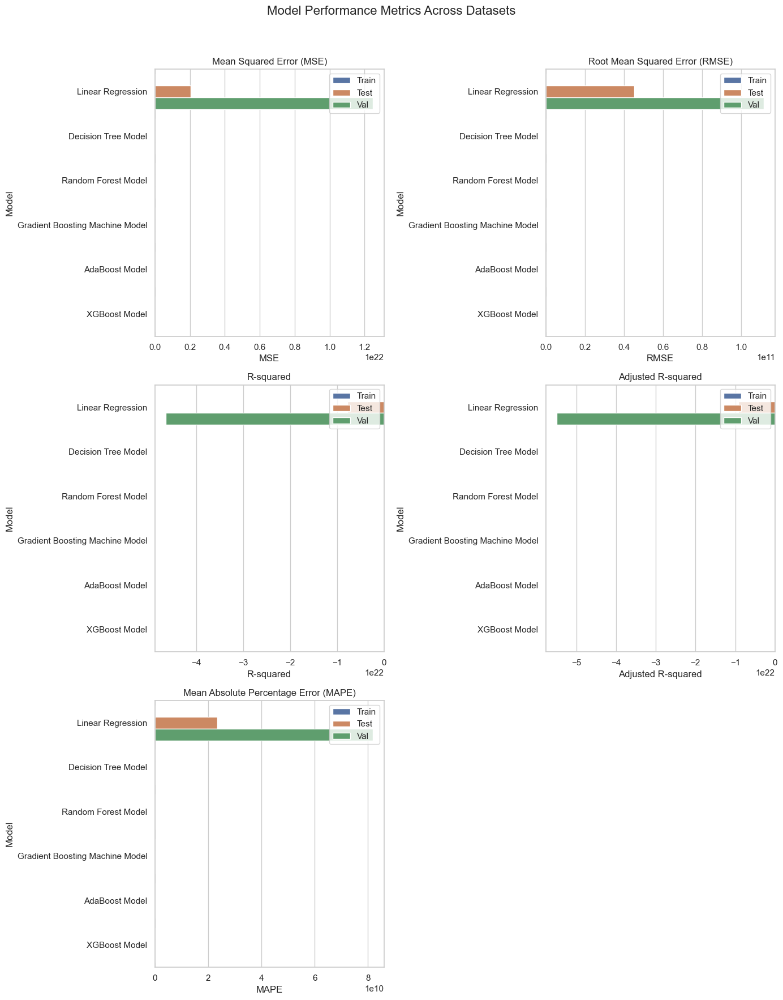

In [190]:
# Set the style
sns.set(style="whitegrid")

# Initialize the matplotlib figure with 3 rows and 2 columns to fit 5 subplots
f, axes = plt.subplots(3, 2, figsize=(14, 18))

# Plot MSE
sns.barplot(x="MSE", y="Model", hue="Set", data=df_metrics, ax=axes[0, 0])
axes[0, 0].set_title('Mean Squared Error (MSE)')
axes[0, 0].legend(loc='upper right')

# Plot RMSE
sns.barplot(x="RMSE", y="Model", hue="Set", data=df_metrics, ax=axes[0, 1])
axes[0, 1].set_title('Root Mean Squared Error (RMSE)')
axes[0, 1].legend(loc='upper right')

# Plot R-squared
sns.barplot(x="R-squared", y="Model", hue="Set", data=df_metrics, ax=axes[1, 0])
axes[1, 0].set_title('R-squared')
axes[1, 0].legend(loc='upper right')

# Plot Adjusted R-squared
sns.barplot(x="Adjusted R-squared", y="Model", hue="Set", data=df_metrics, ax=axes[1, 1])
axes[1, 1].set_title('Adjusted R-squared')
axes[1, 1].legend(loc='upper right')

# Plot MAPE
sns.barplot(x="MAPE", y="Model", hue="Set", data=df_metrics, ax=axes[2, 0])
axes[2, 0].set_title('Mean Absolute Percentage Error (MAPE)')
axes[2, 0].legend(loc='upper right')

# Remove the empty subplot
f.delaxes(axes[2, 1])

# Adjust the spacing
plt.suptitle('Model Performance Metrics Across Datasets', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


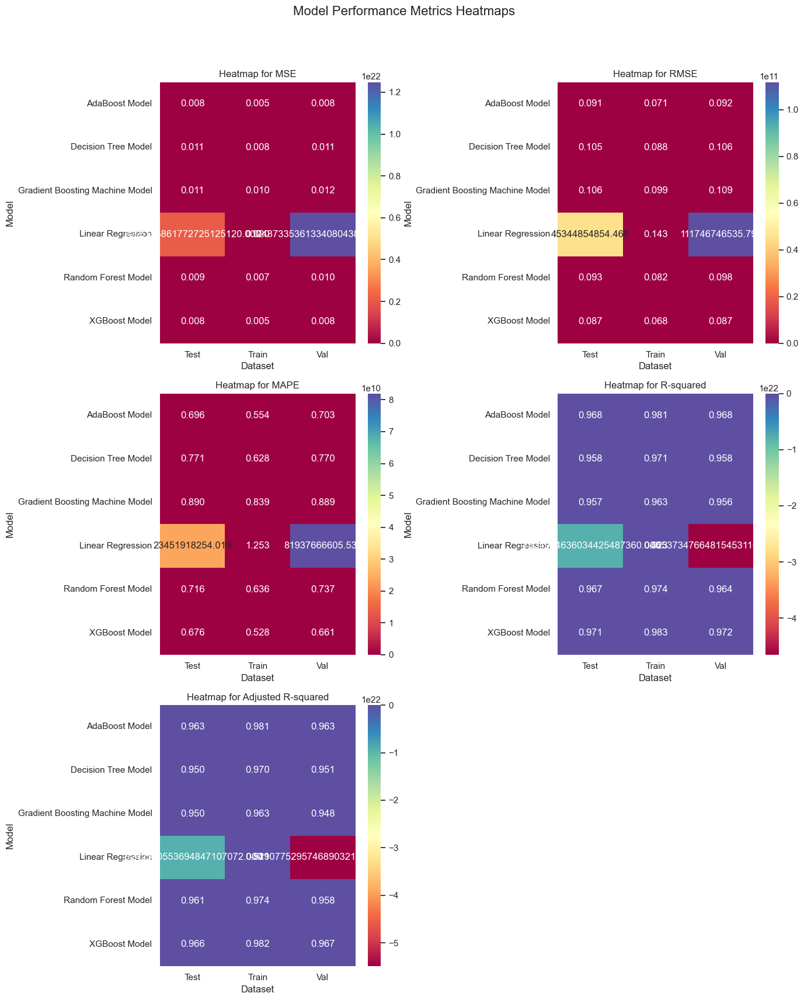

In [191]:
# Pivot the DataFrame for heatmap
#df_pivot = df_metrics.pivot_table(index='Model', columns='Set', values=['MSE', 'RMSE', 'MAPE', 'R-squared', 'Adjusted R-squared'])

# Plotting
plt.figure(figsize=(14, 18))

for i, metric in enumerate(['MSE', 'RMSE', 'MAPE', 'R-squared', 'Adjusted R-squared']):
    plt.subplot(3, 2, i+1)  # Adjusted to 3 rows and 2 columns
    sns.heatmap(df_pivot[metric], annot=True, cmap='Spectral', fmt=".3f", cbar=True)  # Round off to 3 decimal places
    plt.title(f'Heatmap for {metric}')
    plt.xlabel('Dataset')
    plt.ylabel('Model')

# Remove the empty subplot if any
if len(['MSE', 'RMSE', 'MAPE', 'R-squared', 'Adjusted R-squared']) < 6:
    plt.subplot(3, 2, 6).remove()

plt.suptitle('Model Performance Metrics Heatmaps', fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()



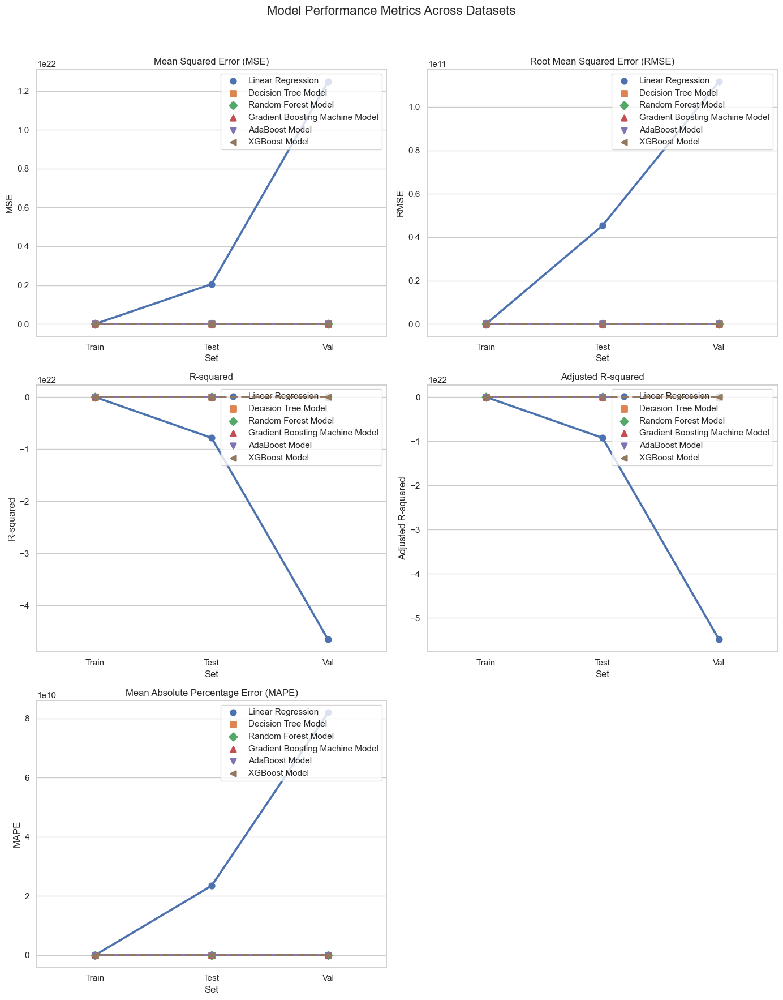

In [192]:

# Set the style
sns.set(style="whitegrid")

# Get the number of unique models
num_models = df_metrics['Model'].nunique()

# Generate markers and linestyles to match the number of models
markers = ['o', 's', 'D', '^', 'v', '<', '>', 'p', 'P', '*', 'X', 'd'][:num_models]
linestyles = ['-', '--', '-.', ':', '-', '--', '-.', ':', '-', '--', '-.', ':'][:num_models]

# Initialize the matplotlib figure with 3 rows and 2 columns to fit 5 subplots
f, axes = plt.subplots(3, 2, figsize=(14, 18))

# Plot MSE
sns.pointplot(x="Set", y="MSE", hue="Model", data=df_metrics, ax=axes[0, 0], markers=markers, linestyles=linestyles)
axes[0, 0].set_title('Mean Squared Error (MSE)')
axes[0, 0].legend(loc='upper right')

# Plot RMSE
sns.pointplot(x="Set", y="RMSE", hue="Model", data=df_metrics, ax=axes[0, 1], markers=markers, linestyles=linestyles)
axes[0, 1].set_title('Root Mean Squared Error (RMSE)')
axes[0, 1].legend(loc='upper right')

# Plot R-squared
sns.pointplot(x="Set", y="R-squared", hue="Model", data=df_metrics, ax=axes[1, 0], markers=markers, linestyles=linestyles)
axes[1, 0].set_title('R-squared')
axes[1, 0].legend(loc='upper right')

# Plot Adjusted R-squared
sns.pointplot(x="Set", y="Adjusted R-squared", hue="Model", data=df_metrics, ax=axes[1, 1], markers=markers, linestyles=linestyles)
axes[1, 1].set_title('Adjusted R-squared')
axes[1, 1].legend(loc='upper right')

# Plot MAPE
sns.pointplot(x="Set", y="MAPE", hue="Model", data=df_metrics, ax=axes[2, 0], markers=markers, linestyles=linestyles)
axes[2, 0].set_title('Mean Absolute Percentage Error (MAPE)')
axes[2, 0].legend(loc='upper right')

# Remove the empty subplot
f.delaxes(axes[2, 1])

# Adjust the spacing
plt.suptitle('Model Performance Metrics Across Datasets', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


In [193]:
# Round off all values to 3 decimal places
df_pivot = df_pivot.round(3)

In [194]:
df_pivot

Adjusted R-squared                       \
Set                                           Test  Train           Val   
Model                                                                     
AdaBoost Model                        9.630000e-01  0.981  9.630000e-01   
Decision Tree Model                   9.500000e-01  0.970  9.510000e-01   
Gradient Boosting Machine Model       9.500000e-01  0.963  9.480000e-01   
Linear Regression                    -9.242591e+21  0.921 -5.490775e+22   
Random Forest Model                   9.610000e-01  0.974  9.580000e-01   
XGBoost Model                         9.660000e-01  0.982  9.670000e-01   

                                         MAPE                       \
Set                                      Test  Train           Val   
Model                                                                
AdaBoost Model                   6.960000e-01  0.554  7.030000e-01   
Decision Tree Model              7.710000e-01  0.628  7.700000e-01   
Gradient Boosting Machine Model  8.900000e-01  0.839  8.890000e-01   
Linear Regression                2.345192e+10  1.253  8.193767e+10   
Random Forest Model              7.160000e-01  0.636  7.370000e-01   
XGBoost Model                    6.760000e-01  0.528  6.610000e-01   

                                          MSE                       \
Set                                      Test  Train           Val   
Model                                                                
AdaBoost Model                   8.000000e-03  0.005  8.000000e-03   
Decision Tree Model              1.100000e-02  0.008  1.100000e-02   
Gradient Boosting Machine Model  1.100000e-02  0.010  1.200000e-02   
Linear Regression                2.056156e+21  0.020  1.248734e+22   
Random Forest Model              9.000000e-03  0.007  1.000000e-02   
XGBoost Model                    8.000000e-03  0.005  8.000000e-03   

                                    R-squared                       \
Set                                      Test  Train           Val   
Model                                                                
AdaBoost Model                   9.680000e-01  0.981  9.680000e-01   
Decision Tree Model              9.580000e-01  0.971  9.580000e-01   
Gradient Boosting Machine Model  9.570000e-01  0.963  9.560000e-01   
Linear Regression               -7.834955e+21  0.923 -4.653735e+22   
Random Forest Model              9.670000e-01  0.974  9.640000e-01   
XGBoost Model                    9.710000e-01  0.983  9.720000e-01   

                                         RMSE                       
Set                                      Test  Train           Val  
Model                                                               
AdaBoost Model                   9.100000e-02  0.071  9.200000e-02  
Decision Tree Model              1.050000e-01  0.088  1.060000e-01  
Gradient Boosting Machine Model  1.060000e-01  0.099  1.090000e-01  
Linear Regression                4.534485e+10  0.143  1.117467e+11  
Random Forest Model              9.300000e-02  0.082  9.800000e-02  
XGBoost Model                    8.700000e-02  0.068  8.700000e-02

___
## **Cross Validation**

In [195]:

from sklearn.model_selection import cross_val_score, KFold
from sklearn.metrics import mean_squared_error, r2_score


In [196]:

# Define your model
model = xgb.XGBRegressor(objective='reg:squarederror', random_state=42)

# Prepare your data (replace with your actual data)
X = df.drop(columns='Price')
y = df.Price

# Define cross-validation strategy
cv = KFold(n_splits=5, shuffle=True, random_state=42)

# Evaluate model using cross-validation
cv_results = cross_val_score(model, X, y, cv=cv, scoring='neg_mean_squared_error')

# Convert negative MSE to positive MSE
cv_results = -cv_results

# Print the results
print("Mean Cross-Validated MSE:", np.mean(cv_results))
print("Standard Deviation of Cross-Validated MSE:", np.std(cv_results))


Mean Cross-Validated MSE: 0.007543441106880613
Standard Deviation of Cross-Validated MSE: 0.00038687490251428715


## **HyperParameter Tuning of XGBoost Regressor model**

In [197]:
from sklearn.model_selection import RandomizedSearchCV

# Define the parameter distributions
param_dist = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 5, 7],
    'min_child_weight': [1, 3, 5],
    'subsample': [0.8, 0.9, 1.0],
    'colsample_bytree': [0.8, 0.9, 1.0],
    'gamma': [0, 0.1, 0.2]
}

# Create an XGBoost regressor instance
xg_reg = xgb.XGBRegressor(random_state=42)

# Set up RandomizedSearchCV
random_search = RandomizedSearchCV(estimator=xg_reg, param_distributions=param_dist, 
                                    n_iter=50, scoring='neg_mean_squared_error', 
                                    cv=5, verbose=1, n_jobs=-1, random_state=42)

# Fit RandomizedSearchCV
random_search.fit(X_train, y_train)

# Get the best parameters and best score
best_params = random_search.best_params_
best_score = random_search.best_score_

print("Best Parameters:", best_params)
print("Best Score:", best_score)


Fitting 5 folds for each of 50 candidates, totalling 250 fits
Best Parameters: {'subsample': 1.0, 'n_estimators': 200, 'min_child_weight': 5, 'max_depth': 5, 'learning_rate': 0.2, 'gamma': 0, 'colsample_bytree': 0.9}
Best Score: -0.008190762511745072


In [198]:
# from sklearn.model_selection import GridSearchCV

# # Define the parameter grid
# param_grid = {
#     'n_estimators': [100, 200, 300],
#     'learning_rate': [0.01, 0.1, 0.2],
#     'max_depth': [3, 5, 7],
#     'min_child_weight': [1, 3, 5],
#     'subsample': [0.8, 0.9, 1.0],
#     'colsample_bytree': [0.8, 0.9, 1.0],
#     'gamma': [0, 0.1, 0.2]
# }

# # Create an XGBoost regressor instance
# xg_reg = xgb.XGBRegressor(random_state=42)

# # Set up GridSearchCV
# grid_search = GridSearchCV(estimator=xg_reg, param_grid=param_grid, 
#                            scoring='neg_mean_squared_error', 
#                            cv=5, verbose=1, n_jobs=-1)

# # Fit GridSearchCV
# grid_search.fit(X_train, y_train)

# # Get the best parameters and best score
# best_params = grid_search.best_params_
# best_score = grid_search.best_score_

# print("Best Parameters:", best_params)
# print("Best Score:", best_score)


___
###  *XGB Model tuning with best parameters*

In [199]:
xgbm_best = xgb.XGBRegressor(
    subsample=1.0, 
    n_estimators=200, 
    min_child_weight=5, 
    max_depth=5, 
    learning_rate=0.2, 
    gamma=0, 
    colsample_bytree=0.9,
    random_state=42
)

xgbm_best.fit(X_train, y_train)


XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.9, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=0, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.2, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=5, max_leaves=None,
             min_child_weight=5, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=200, n_jobs=None,
             num_parallel_tree=None, random_state=42, ...)

<Figure size 1600x1400 with 0 Axes>

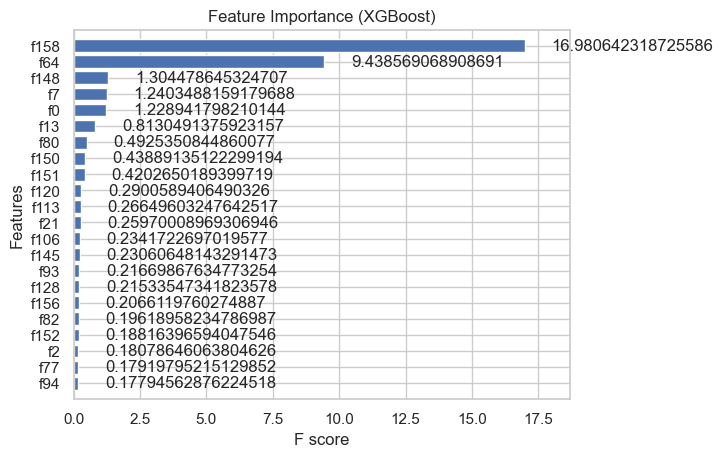

In [200]:

# Plot feature importance
plt.figure(figsize=(16, 14))
xgb.plot_importance(xgbm_best, importance_type='gain', max_num_features=22, height=0.8)
plt.title('Feature Importance (XGBoost)')
plt.show()



In [201]:
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error

# Make predictions on the train set
y_train_pred_xgbm_best = xgbm_best.predict(X_train)

# Calculate evaluation metrics on the train set
mse_xgbm_best_tr = mean_squared_error(y_train, y_train_pred_xgbm_best)
rmse_xgbm_best_tr = mse_xgbm_best_tr ** 0.5
mape_xgbm_best_tr = mean_absolute_percentage_error(y_train, y_train_pred_xgbm_best) * 100
r2_xgbm_best_tr = r2_score(y_train, y_train_pred_xgbm_best)

# Adjusted R-squared for train set
n_train = len(y_train)
p_train = X_train.shape[1]
adjusted_r2_xgbm_best_tr = 1 - (1 - r2_xgbm_best_tr) * (n_train - 1) / (n_train - p_train - 1)

# Evaluation metrics for train set
print('*** XGBoost Best Model ***')
print("Train Set Performance:")
print("XGBoost - MSE:", mse_xgbm_best_tr)
print("XGBoost - RMSE:", rmse_xgbm_best_tr)
print("Mean Absolute Percentage Error (MAPE):", round(mape_xgbm_best_tr, 2), '%')
print("XGBoost - R-squared:", r2_xgbm_best_tr)
print("Adjusted R-squared:", adjusted_r2_xgbm_best_tr)

print('__'*20)

# Make predictions on the test set
y_test_pred_xgbm_best = xgbm_best.predict(X_test)

# Calculate evaluation metrics on the test set
mse_xgbm_best_ts = mean_squared_error(y_test, y_test_pred_xgbm_best)
rmse_xgbm_best_ts = mse_xgbm_best_ts ** 0.5
mape_xgbm_best_ts = mean_absolute_percentage_error(y_test, y_test_pred_xgbm_best) * 100
r2_xgbm_best_ts = r2_score(y_test, y_test_pred_xgbm_best)

# Adjusted R-squared for test set
n_test = len(y_test)
p_test = X_test.shape[1]
adjusted_r2_xgbm_best_ts = 1 - (1 - r2_xgbm_best_ts) * (n_test - 1) / (n_test - p_test - 1)

# Evaluation metrics for test set
print("Test Set Performance:")
print("XGBoost - MSE:", mse_xgbm_best_ts)
print("XGBoost - RMSE:", rmse_xgbm_best_ts)
print("Mean Absolute Percentage Error (MAPE):", round(mape_xgbm_best_ts, 2), '%')
print("XGBoost - R-squared:", r2_xgbm_best_ts)
print("Adjusted R-squared:", adjusted_r2_xgbm_best_ts)

print('__'*20)

# Make predictions on the validation set
y_val_pred_xgbm_best = xgbm_best.predict(X_val)

# Calculate evaluation metrics on the validation set
mse_xgbm_best_val = mean_squared_error(y_val, y_val_pred_xgbm_best)
rmse_xgbm_best_val = mse_xgbm_best_val ** 0.5
mape_xgbm_best_val = mean_absolute_percentage_error(y_val, y_val_pred_xgbm_best) * 100
r2_xgbm_best_val = r2_score(y_val, y_val_pred_xgbm_best)

# Adjusted R-squared for validation set
n_val = len(y_val)
p_val = X_val.shape[1]
adjusted_r2_xgbm_best_val = 1 - (1 - r2_xgbm_best_val) * (n_val - 1) / (n_val - p_val - 1)

# Evaluation metrics for validation set
print("Validation Set Performance:")
print("XGBoost - MSE:", mse_xgbm_best_val)
print("XGBoost - RMSE:", rmse_xgbm_best_val)
print("Mean Absolute Percentage Error (MAPE):", round(mape_xgbm_best_val, 2), '%')
print("XGBoost - R-squared:", r2_xgbm_best_val)
print("Adjusted R-squared:", adjusted_r2_xgbm_best_val)

print('__'*20)


*** XGBoost Best Model ***
Train Set Performance:
XGBoost - MSE: 0.005257036260376881
XGBoost - RMSE: 0.07250542228259126
Mean Absolute Percentage Error (MAPE): 0.57 %
XGBoost - R-squared: 0.9801688422279402
Adjusted R-squared: 0.9797841235742363
________________________________________
Test Set Performance:
XGBoost - MSE: 0.008209920502938516
XGBoost - RMSE: 0.09060861163784883
Mean Absolute Percentage Error (MAPE): 0.7 %
XGBoost - R-squared: 0.968716206829518
Adjusted R-squared: 0.9630957287344822
________________________________________
Validation Set Performance:
XGBoost - MSE: 0.008610646334483432
XGBoost - RMSE: 0.09279356838964342
Mean Absolute Percentage Error (MAPE): 0.7 %
XGBoost - R-squared: 0.9679101561308742
Adjusted R-squared: 0.9621383403218345
________________________________________


___
##### KdePlot for Actual and Predicted values of Train,Test, Val1 sets with Best XG Boost regression model

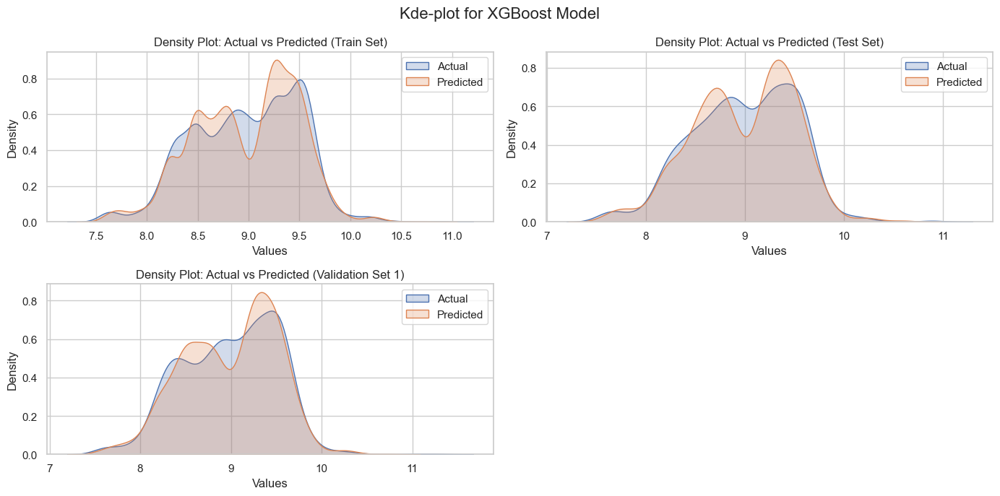

In [202]:
# Create DataFrames for actual and predicted values
train_xgbm_results = pd.DataFrame({'Actual': y_train, 'Predicted': y_train_pred_xgbm_best, 'Dataset': 'Train'})
test_xgbm_results = pd.DataFrame({'Actual': y_test, 'Predicted': y_test_pred_xgbm_best, 'Dataset': 'Test'})
val1_xgbm_results = pd.DataFrame({'Actual': y_val, 'Predicted': y_val_pred_xgbm_best, 'Dataset': 'Val'})


# Create the plot
plt.figure(figsize=(14, 7))

# Train set
plt.subplot(2, 2, 1)
sns.kdeplot(train_xgbm_results['Actual'], label='Actual', shade=True)
sns.kdeplot(train_xgbm_results['Predicted'], label='Predicted', shade=True)
plt.title('Density Plot: Actual vs Predicted (Train Set)')
plt.xlabel('Values')
plt.ylabel('Density')
plt.legend()

# Test set
plt.subplot(2, 2, 2)
sns.kdeplot(test_xgbm_results['Actual'], label='Actual', shade=True)
sns.kdeplot(test_xgbm_results['Predicted'], label='Predicted', shade=True)
plt.title('Density Plot: Actual vs Predicted (Test Set)')
plt.xlabel('Values')
plt.ylabel('Density')
plt.legend()

# Validation set 1
plt.subplot(2, 2, 3)
sns.kdeplot(val1_xgbm_results['Actual'], label='Actual', shade=True)
sns.kdeplot(val1_xgbm_results['Predicted'], label='Predicted', shade=True)
plt.title('Density Plot: Actual vs Predicted (Validation Set 1)')
plt.xlabel('Values')
plt.ylabel('Density')
plt.legend()



plt.suptitle('Kde-plot for XGBoost Model', fontsize=16)

plt.tight_layout()
plt.show()

___
##### HexbinPlot for Actual and Predicted values of Train,Test, Val1, Val2 sets with Linear regression model

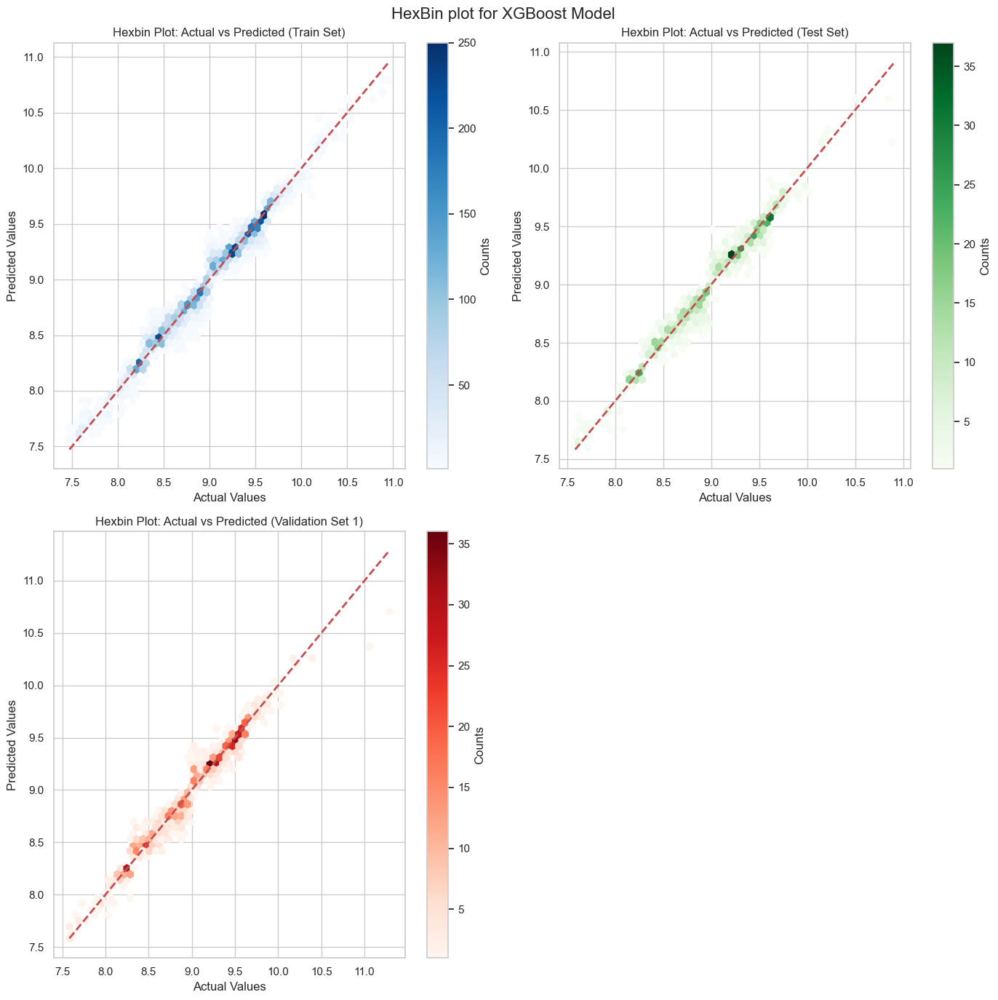

In [203]:





# Create the plot
plt.figure(figsize=(14, 14))

# Train set
plt.subplot(2, 2, 1)
plt.hexbin(train_xgbm_results['Actual'], train_xgbm_results['Predicted'], gridsize=50, cmap='Blues', mincnt=1)
plt.plot([train_xgbm_results['Actual'].min(), train_xgbm_results['Actual'].max()], [train_xgbm_results['Actual'].min(), train_xgbm_results['Actual'].max()], 'r--', lw=2)
plt.title('Hexbin Plot: Actual vs Predicted (Train Set)')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.colorbar(label='Counts')

# Test set
plt.subplot(2, 2, 2)
plt.hexbin(test_xgbm_results['Actual'], test_xgbm_results['Predicted'], gridsize=50, cmap='Greens', mincnt=1)
plt.plot([test_xgbm_results['Actual'].min(), test_xgbm_results['Actual'].max()], [test_xgbm_results['Actual'].min(), test_xgbm_results['Actual'].max()], 'r--', lw=2)
plt.title('Hexbin Plot: Actual vs Predicted (Test Set)')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.colorbar(label='Counts')

# Validation set 1
plt.subplot(2, 2, 3)
plt.hexbin(val1_xgbm_results['Actual'], val1_xgbm_results['Predicted'], gridsize=50, cmap='Reds', mincnt=1)
plt.plot([val1_xgbm_results['Actual'].min(), val1_xgbm_results['Actual'].max()], [val1_xgbm_results['Actual'].min(), val1_xgbm_results['Actual'].max()], 'r--', lw=2)
plt.title('Hexbin Plot: Actual vs Predicted (Validation Set 1)')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.colorbar(label='Counts')



plt.suptitle('HexBin plot for XGBoost Model', fontsize=16)

plt.tight_layout()
plt.show()


#### ***XGBoost Best Model***

* **Train Set** Performance:
1. XGBoost - **MSE: 0.004**003112913061488
2. XGBoost - **RMSE: 0.063**27015815581219
3. Mean Absolute Percentage Error **(MAPE): 0.49 %**
4. XGBoost - **R-squared: 0.98**50710689422334
5. **Adjusted R-squared: 0.98**50054292343674
________________________________________
* **Test Set** Performance:
1. XGBoost - **MSE: 0.007**762305992807185
2. XGBoost - **RMSE: 0.088**10394992738513
3. Mean Absolute Percentage Error **(MAPE): 0.67 %**
4. XGBoost - **R-squared: 0.97**08118133236119
5. **Adjusted R-squared: 0.97**02029332886416
________________________________________
* **Validation Set** Performance:
1. XGBoost - **MSE: 0.008**233505813182388
2. XGBoost - **RMSE: 0.090**7386676846337
3. Mean Absolute Percentage Error **(MAPE): 0.7 %**
4. XGBoost - **R-squared: 0.96**70484075889036
5. **Adjusted R-squared: 0.96**63610210457778
________________________________________

### **Cross Validation of XGB best parameters model**

In [204]:

# Define your model
model = xgb.XGBRegressor(
    subsample=1.0, 
    n_estimators=200, 
    min_child_weight=5, 
    max_depth=5, 
    learning_rate=0.2, 
    gamma=0, 
    colsample_bytree=0.9,
    random_state=42
)

# Prepare your data (replace with your actual data)
X = df.drop(columns='Price')
y = df.Price

# Define cross-validation strategy
cv = KFold(n_splits=5, shuffle=True, random_state=42)

# Evaluate model using cross-validation
cv_results = cross_val_score(model, X, y, cv=cv, scoring='neg_mean_squared_error')

# Convert negative MSE to positive MSE
cv_results = -cv_results

# Print the results
print("Mean Cross-Validated MSE:", np.mean(cv_results))
print("Standard Deviation of Cross-Validated MSE:", np.std(cv_results))

Mean Cross-Validated MSE: 0.007936450029433492
Standard Deviation of Cross-Validated MSE: 0.0003571963203414718


## **HyperParameter Tuning to Gradient Boosting Regressor Model**

In [205]:
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint

# Define the parameter distribution
param_dist = {
    'n_estimators': randint(50, 200),          # Number of boosting stages
    'max_depth': randint(3, 10),               # Maximum depth of each tree
    'min_samples_split': randint(2, 20),       # Minimum number of samples required to split an internal node
    'min_samples_leaf': randint(1, 10),        # Minimum number of samples required to be at a leaf node
    'learning_rate': [0.01, 0.05, 0.1, 0.2],   # Learning rate shrinks the contribution of each tree
    'subsample': [0.6, 0.8, 1.0],              # Fraction of samples used for fitting the individual base learners
}

# Instantiate the model
gbm = GradientBoostingRegressor(random_state=42)

# Perform randomized search with cross-validation
random_search = RandomizedSearchCV(estimator=gbm, param_distributions=param_dist,
                                   n_iter=50, cv=5, scoring='neg_mean_squared_error',
                                   verbose=1, random_state=42, n_jobs=-1)


# Fit the randomized search
random_search.fit(X_train, y_train)

# Best parameters found by randomized search
print("Best Parameters:", random_search.best_params_)


Fitting 5 folds for each of 50 candidates, totalling 250 fits
Best Parameters: {'learning_rate': 0.2, 'max_depth': 8, 'min_samples_leaf': 2, 'min_samples_split': 3, 'n_estimators': 103, 'subsample': 1.0}


###  *GB Model tuning with best parameters*

In [206]:
# Retrieve the best model
gbm_best = random_search.best_estimator_

# Evaluate performance on train, test, and validation sets
# (Use the same code as before for these steps)
gbm_best.fit(X_train,y_train)

GradientBoostingRegressor(learning_rate=0.2, max_depth=8, min_samples_leaf=2,
                          min_samples_split=3, n_estimators=103,
                          random_state=42)

In [207]:
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error

# Make predictions on the train set
y_train_pred_gbm_best = gbm_best.predict(X_train)

# Calculate evaluation metrics on the train set
mse_gbm_best_tr = mean_squared_error(y_train, y_train_pred_gbm_best)
rmse_gbm_best_tr = mse_gbm_best_tr ** 0.5
mape_gbm_best_tr = mean_absolute_percentage_error(y_train, y_train_pred_gbm_best) * 100
r2_gbm_best_tr = r2_score(y_train, y_train_pred_gbm_best)

# Adjusted R-squared for train set
n_train = len(y_train)
p_train = X_train.shape[1]
adjusted_r2_gbm_best_tr = 1 - (1 - r2_gbm_best_tr) * (n_train - 1) / (n_train - p_train - 1)

# Evaluation metrics for train set
print('*** Gradient Boosting Best Model ***')
print("Train Set Performance:")
print("Gradient Boosting - MSE:", mse_gbm_best_tr)
print("Gradient Boosting - RMSE:", rmse_gbm_best_tr)
print("Mean Absolute Percentage Error (MAPE):", round(mape_gbm_best_tr, 2), '%')
print("Gradient Boosting - R-squared:", r2_gbm_best_tr)
print("Adjusted R-squared:", adjusted_r2_gbm_best_tr)

print('__'*20)

# Make predictions on the test set
y_test_pred_gbm_best = gbm_best.predict(X_test)

# Calculate evaluation metrics on the test set
mse_gbm_best_ts = mean_squared_error(y_test, y_test_pred_gbm_best)
rmse_gbm_best_ts = mse_gbm_best_ts ** 0.5
mape_gbm_best_ts = mean_absolute_percentage_error(y_test, y_test_pred_gbm_best) * 100
r2_gbm_best_ts = r2_score(y_test, y_test_pred_gbm_best)

# Adjusted R-squared for test set
n_test = len(y_test)
p_test = X_test.shape[1]
adjusted_r2_gbm_best_ts = 1 - (1 - r2_gbm_best_ts) * (n_test - 1) / (n_test - p_test - 1)

# Evaluation metrics for test set
print("Test Set Performance:")
print("Gradient Boosting - MSE:", mse_gbm_best_ts)
print("Gradient Boosting - RMSE:", rmse_gbm_best_ts)
print("Mean Absolute Percentage Error (MAPE):", round(mape_gbm_best_ts, 2), '%')
print("Gradient Boosting - R-squared:", r2_gbm_best_ts)
print("Adjusted R-squared:", adjusted_r2_gbm_best_ts)

print('__'*20)

# Make predictions on the validation set
y_val_pred_gbm_best = gbm_best.predict(X_val)

# Calculate evaluation metrics on the validation set
mse_gbm_best_val = mean_squared_error(y_val, y_val_pred_gbm_best)
rmse_gbm_best_val = mse_gbm_best_val ** 0.5
mape_gbm_best_val = mean_absolute_percentage_error(y_val, y_val_pred_gbm_best) * 100
r2_gbm_best_val = r2_score(y_val, y_val_pred_gbm_best)

# Adjusted R-squared for validation set
n_val = len(y_val)
p_val = X_val.shape[1]
adjusted_r2_gbm_best_val = 1 - (1 - r2_gbm_best_val) * (n_val - 1) / (n_val - p_val - 1)

# Evaluation metrics for validation set
print("Validation Set Performance:")
print("Gradient Boosting - MSE:", mse_gbm_best_val)
print("Gradient Boosting - RMSE:", rmse_gbm_best_val)
print("Mean Absolute Percentage Error (MAPE):", round(mape_gbm_best_val, 2), '%')
print("Gradient Boosting - R-squared:", r2_gbm_best_val)
print("Adjusted R-squared:", adjusted_r2_gbm_best_val)

print('__'*20)


*** Gradient Boosting Best Model ***
Train Set Performance:
Gradient Boosting - MSE: 0.002585189312241197
Gradient Boosting - RMSE: 0.05084475697887834
Mean Absolute Percentage Error (MAPE): 0.37 %
Gradient Boosting - R-squared: 0.990247870742664
Adjusted R-squared: 0.9900586822907463
________________________________________
Test Set Performance:
Gradient Boosting - MSE: 0.006356891892730555
Gradient Boosting - RMSE: 0.07973011910646162
Mean Absolute Percentage Error (MAPE): 0.59 %
Gradient Boosting - R-squared: 0.9757771477679817
Adjusted R-squared: 0.9714252455025683
________________________________________
Validation Set Performance:
Gradient Boosting - MSE: 0.006918900928132697
Gradient Boosting - RMSE: 0.08317993104188472
Mean Absolute Percentage Error (MAPE): 0.6 %
Gradient Boosting - R-squared: 0.9742148914372933
Adjusted R-squared: 0.9695770721369875
________________________________________


### **Gradient Boosting Best Model**
* **Train Set** Performance:
1. Gradient Boosting - MSE: 0.0021614775921032733
2. Gradient Boosting - RMSE: 0.04649169379688455
3. Mean Absolute Percentage Error (MAPE): 0.35 %
4. Gradient Boosting - R-squared: 0.9919391357035845
5. Adjusted R-squared: 0.9919036935962081
________________________________________
* **Test Set** Performance:
1. Gradient Boosting - MSE: 0.0066698850704344954
2. Gradient Boosting - RMSE: 0.08166936433225433
3. Mean Absolute Percentage Error (MAPE): 0.59 %
4. Gradient Boosting - R-squared: 0.9749195856583991
5. Adjusted R-squared: 0.9743963957894739
________________________________________
* **Validation Set** Performance:
1. Gradient Boosting - MSE: 0.007011018951030381
2. Gradient Boosting - RMSE: 0.08373182758682854
3. Mean Absolute Percentage Error (MAPE): 0.62 %
4. Gradient Boosting - R-squared: 0.9719409636547605
5. Adjusted R-squared: 0.9713556382551205
________________________________________

In [208]:



# Prepare your data (replace with your actual data)
X = df.drop(columns='Price')
y = df.Price

# Define cross-validation strategy
cv = KFold(n_splits=5, shuffle=True, random_state=42)

# Evaluate model using cross-validation
cv_results = cross_val_score(gbm_best, X, y, cv=cv, scoring='neg_mean_squared_error')

# Convert negative MSE to positive MSE
cv_results = -cv_results

# Print the results
print("GBM Mean Cross-Validated MSE:", np.mean(cv_results))
print("GBM Standard Deviation of Cross-Validated MSE:", np.std(cv_results))

GBM Mean Cross-Validated MSE: 0.00665518643990307
GBM Standard Deviation of Cross-Validated MSE: 0.00036870181840209374


___
## Inverse Transform Actual and Predicted Price

In [209]:

# Inverse the log transformation for the actual target values
y_train = np.exp(y_train).astype(int)
y_test = np.exp(y_test).astype(int)
y_val = np.exp(y_val).astype(int)

# Inverse the log transformation for the predicted values
y_train_pred = np.exp(y_train_pred_xgbm_best).astype(int)
y_test_pred = np.exp(y_test_pred_xgbm_best).astype(int)
y_val_pred = np.exp(y_val_pred_xgbm_best).astype(int)



In [210]:
# Create DataFrames for each set to compare the original price and predicted price, keeping their original indices
df_train_comparison = pd.DataFrame({
    'Original_Price': y_train,
    'Predicted_Price': y_train_pred
}, index=y_train.index)

df_test_comparison = pd.DataFrame({
    'Original_Price': y_test,
    'Predicted_Price': y_test_pred
}, index=y_test.index)

df_val_comparison = pd.DataFrame({
    'Original_Price': y_val,
    'Predicted_Price': y_val_pred
}, index=y_val.index)

# Concatenate all the comparison DataFrames into a single DataFrame, preserving the original indices
df_comparison = pd.concat([df_train_comparison, df_test_comparison, df_val_comparison]).round().astype(int)

# Now concatenate the comparison DataFrame with the original DataFrame
df_final = pd.concat([original, df_comparison], axis=1)

In [211]:
df_comparison

,Original_Price,Predicted_Price
3474,14780,13852
3232,13043,13453
712,10976,10558
1195,10844,10001
472,6316,6369
...,...,...
4934,14570,14679
10631,6037,6384
8605,9793,10444
1823,10844,10746


In [212]:
df_final.drop(columns='Original_Price',inplace=True)

In [213]:
df_final

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price,Predicted_Price
0,IndiGo,24/03/2019,Banglore,New Delhi,BLR → DEL,22:20,01:10 22 Mar,2h 50m,non-stop,Null,3897,3795.0
1,Air India,1/05/2019,Kolkata,Banglore,CCU → IXR → BBI → BLR,05:50,13:15,7h 25m,2 stops,Null,7662,7848.0
2,Jet Airways,9/06/2019,Delhi,Cochin,DEL → LKO → BOM → COK,09:25,04:25 10 Jun,19h,2 stops,Null,13882,13961.0
3,IndiGo,12/05/2019,Kolkata,Banglore,CCU → NAG → BLR,18:05,23:30,5h 25m,1 stop,Null,6218,6111.0
4,IndiGo,01/03/2019,Banglore,New Delhi,BLR → NAG → DEL,16:50,21:35,4h 45m,1 stop,Null,13302,11943.0
...,...,...,...,...,...,...,...,...,...,...,...,...
10678,Air Asia,9/04/2019,Kolkata,Banglore,CCU → BLR,19:55,22:25,2h 30m,non-stop,Null,4107,4380.0
10679,Air India,27/04/2019,Kolkata,Banglore,CCU → BLR,20:45,23:20,2h 35m,non-stop,Null,4145,4330.0
10680,Jet Airways,27/04/2019,Banglore,Delhi,BLR → DEL,08:20,11:20,3h,non-stop,Null,7229,7057.0
10681,Vistara,01/03/2019,Banglore,New Delhi,BLR → DEL,11:30,14:10,2h 40m,non-stop,Null,12648,11322.0


In [214]:
df_comparison['Error']=df_comparison['Original_Price'] - df_comparison['Predicted_Price']

In [215]:
df_comparison

,Original_Price,Predicted_Price,Error
3474,14780,13852,928
3232,13043,13453,-410
712,10976,10558,418
1195,10844,10001,843
472,6316,6369,-53
...,...,...,...
4934,14570,14679,-109
10631,6037,6384,-347
8605,9793,10444,-651
1823,10844,10746,98


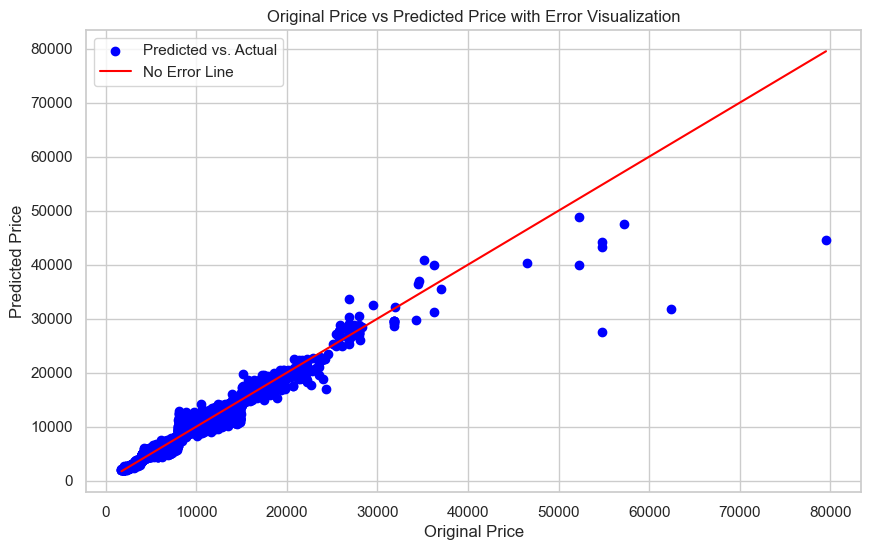

In [216]:
import matplotlib.pyplot as plt
import pandas as pd

# Assuming your DataFrame is named 'df'
# Scatter plot of Original_Price vs Predicted_Price
plt.figure(figsize=(10, 6))
plt.scatter(df_comparison['Original_Price'], df_comparison['Predicted_Price'], color='blue', label='Predicted vs. Actual')

# Line representing no error (where Original_Price == Predicted_Price)
plt.plot([min(df_comparison['Original_Price']), max(df_comparison['Original_Price'])], [min(df_comparison['Original_Price']), max(df_comparison['Original_Price'])], color='red', label='No Error Line')

# Labels and title
plt.xlabel('Original Price')
plt.ylabel('Predicted Price')
plt.title('Original Price vs Predicted Price with Error Visualization')
plt.legend()

# Show plot
plt.show()


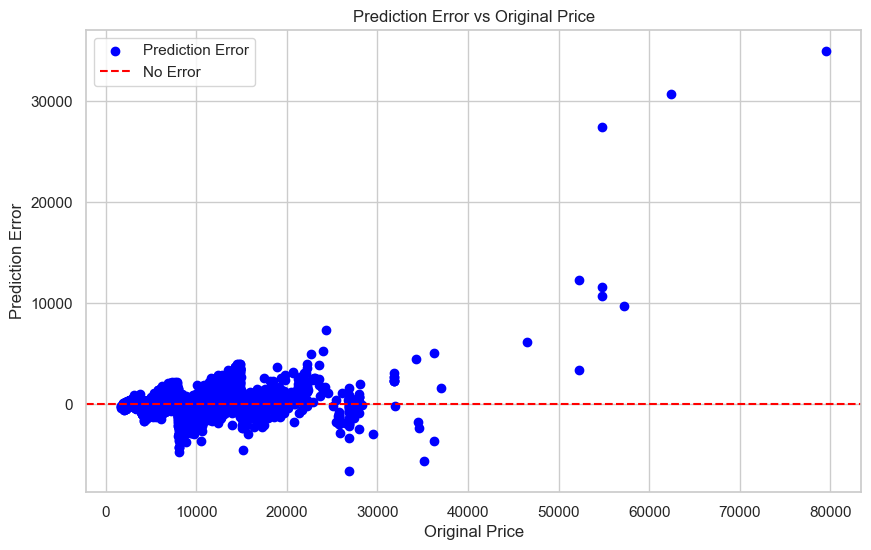

In [217]:
plt.figure(figsize=(10, 6))
plt.scatter(df_comparison['Original_Price'], df_comparison['Error'], c='blue', label='Prediction Error')

# Add a horizontal line at Error = 0 (perfect prediction)
plt.axhline(y=0, color='red', linestyle='--', label='No Error')

# Labels and title
plt.xlabel('Original Price')
plt.ylabel('Prediction Error')
plt.title('Prediction Error vs Original Price')
plt.legend()

# Show plot
plt.show()


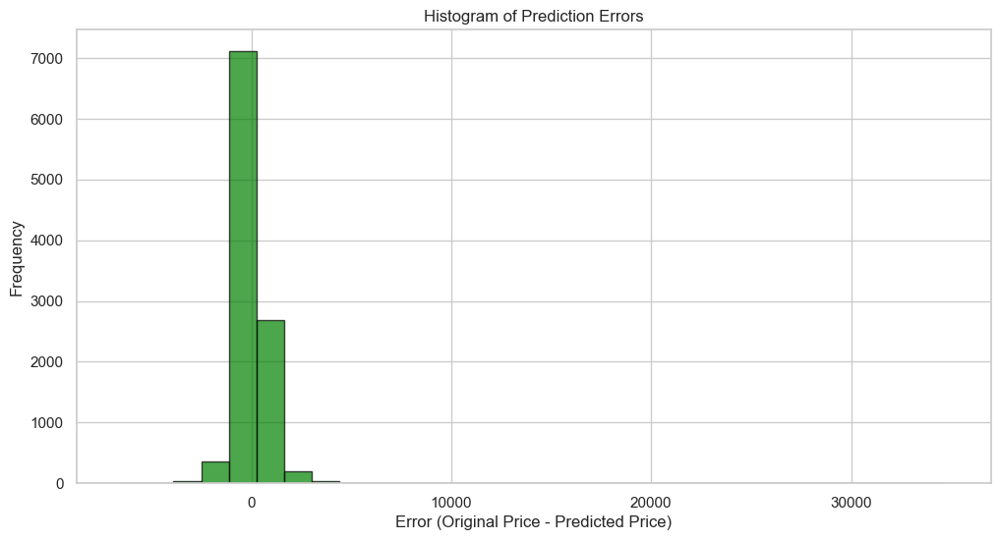

In [218]:
import matplotlib.pyplot as plt

# Histogram of the errors
plt.figure(figsize=(12, 6))
plt.hist(df_comparison['Error'], bins=30, color='green', edgecolor='black', alpha=0.7)

# Adding labels and title
plt.xlabel('Error (Original Price - Predicted Price)')
plt.ylabel('Frequency')
plt.title('Histogram of Prediction Errors')

# Display the plot
plt.show()


{'whiskers': [<matplotlib.lines.Line2D at 0x17605d3ce80>,
 'caps': [<matplotlib.lines.Line2D at 0x17605d3c5e0>,
 'boxes': [<matplotlib.lines.Line2D at 0x17605d3cd90>],
 'medians': [<matplotlib.lines.Line2D at 0x17605d3d7e0>],
 'fliers': [<matplotlib.lines.Line2D at 0x17605d3fa30>],
 'means': []}

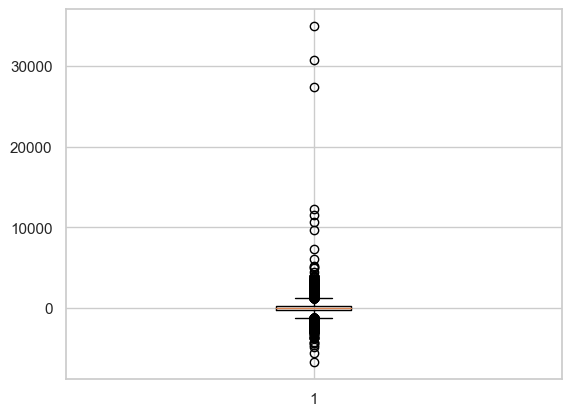

In [219]:
plt.boxplot(df_comparison['Error'])

In [220]:
df_comparison[['Error']].describe().T

,count,mean,std,min,25%,50%,75%,max
Error,10445.0,45.797224,910.913533,-6671.0,-280.0,-1.0,313.0,34917.0


In [221]:
df_comparison[df_comparison['Error']==df_comparison['Error'].max()]

,Original_Price,Predicted_Price,Error
2924,79511,44594,34917


In [222]:
df_final.loc[5439]

Airline                Jet Airways
Date_of_Journey         01/03/2019
Source                    Banglore
Destination              New Delhi
Route              BLR → BOM → DEL
Dep_Time                     16:55
Arrival_Time                 23:00
Duration                     6h 5m
Total_Stops                 1 stop
Additional_Info               Null
Price                        54826
Predicted_Price            43252.0
Name: 5439, dtype: object

In [223]:
df_comparison[df_comparison['Error']>= 5000].T

,10160,5719,10364,1478,7351,5439,9974,2618,9715,2924,5372
Original_Price,24317,36234,57208,54826,46489,54826,24017,54826,52284,79511,62427
Predicted_Price,16954,31174,47517,44177,40395,43252,18806,27445,40011,44594,31765
Error,7363,5060,9691,10649,6094,11574,5211,27381,12273,34917,30662


In [224]:
df_comparison[df_comparison['Original_Price']>= 20000].sort_values(by='Original_Price').T

,9247,1067,2800,4648,10456,4142,3954,7626,5072,10561,1074,6844,6835,3851,1353,4158,10668,3354,1145,4062,8621,3294,8912,6526,5980,5162,9303,2633,3317,9556,9930,1828,2691,515,5850,7,4765,5293,6901,9372,2127,9689,5523,2405,2591,9044,8987,9266,10351,1824,7120,9055,4676,8856,8020,5136,8990,1341,1196,10182,5738,9974,1424,10353,10160,8080,597,2055,5701,8940,2556,8536,5856,936,1466,3400,4521,6407,9239,6314,4012,3535,10511,785,7537,3257,510,5710,10113,1246,826,10383,1785,7756,7902,7713,6588,975,2635,8957,486,7377,2495,1918,959,5745,8451,7554,2108,628,9193,123,8470,6605,946,9632,3111,7724,1654,4829,10189,3032,5986,7356,1629,3700,5013,5662,6576,10439,9019,10052,6991,7617,8598,2693,5719,2099,396,7351,657,9715,1478,2618,5439,10364,5372,2924
Original_Price,20063,20063,20120,20415,20694,20694,20746,20746,20800,20800,20800,20800,20845,20903,20999,21129,21218,21218,21218,21225,21313,21375,21483,21520,21571,21729,21729,21828,21828,21934,21934,21954,22096,22096,22153,22270,22270,22270,22270,22270,22270,22270,22270,22270,22270,22270,22270,22270,22294,22619,22793,22797,22949,23000,23169,23267,23528,23532,23583,23677,23842,24017,24114,24210,24317,24527,25138,25429,25429,25703,25734,25734,25734,25734,25734,25734,25734,25734,25734,25734,25912,26092,26479,26742,26890,26890,26890,26890,26890,26890,26890,26890,26890,26890,26890,26890,26890,26890,26890,26890,26890,26890,26890,26890,26890,26890,26890,26890,27209,27209,27282,27429,27992,27992,27992,27992,27992,27992,27992,27992,27992,28096,28322,29528,31782,31825,31825,31825,31825,31825,31825,31945,34273,34502,34608,35184,36234,36234,36982,46489,52229,52284,54826,54826,54826,57208,62427,79511
Predicted_Price,19513,19355,20561,19201,17500,17616,20184,19596,20206,20856,20582,20206,22613,20959,20268,19771,19261,20046,19589,18785,19541,22310,18859,19509,21327,22323,20878,19541,21031,21944,20501,18888,19048,19975,21982,21011,21954,21912,21063,20696,20600,22126,22475,20793,20162,20498,18711,18284,20953,17658,20363,20428,22786,20475,20624,20869,21071,19639,21738,22861,22285,18806,22502,22536,16954,23436,25319,27190,25007,26910,27148,26996,26731,27248,26990,27767,26707,27767,26504,26969,28748,24997,28351,26342,27219,27651,33561,25342,27328,28790,27242,27555,28851,28301,28495,25974,29063,26645,26895,26483,28928,27722,28444,27138,27005,26381,30274,27487,26766,28059,27684,28808,30464,27056,27317,27353,28877,28019,28084,27734,27286,26113,28402,32525,29520,29133,29515,28734,29509,29188,29515,32199,29844,36335,36952,40796,31174,39925,35431,40395,48836,40011,44177,27445,43252,47517,31765,44594
Error,550,708,-441,1214,3194,3078,562,1150,594,-56,218,594,-1768,-56,731,1358,1957,1172,1629,2440,1772,-935,2624,2011,244,-594,851,2287,797,-10,1433,3066,3048,2121,171,1259,316,358,1207,1574,1670,144,-205,1477,2108,1772,3559,3986,1341,4961,2430,2369,163,2525,2545,2398,2457,3893,1845,816,1557,5211,1612,1674,7363,1091,-181,-1761,422,-1207,-1414,-1262,-997,-1514,-1256,-2033,-973,-2033,-770,-1235,-2836,1095,-1872,400,-329,-761,-6671,1548,-438,-1900,-352,-665,-1961,-1411,-1605,916,-2173,245,-5,407,-2038,-832,-1554,-248,-115,509,-3384,-597,443,-850,-402,-1379,-2472,936,675,639,-885,-27,-92,258,706,1983,-80,-2997,2262,2692,2310,3091,2316,2637,2310,-254,4429,-1833,-2344,-5612,5060,-3691,1551,6094,3393,12273,10649,27381,11574,9691,30662,34917


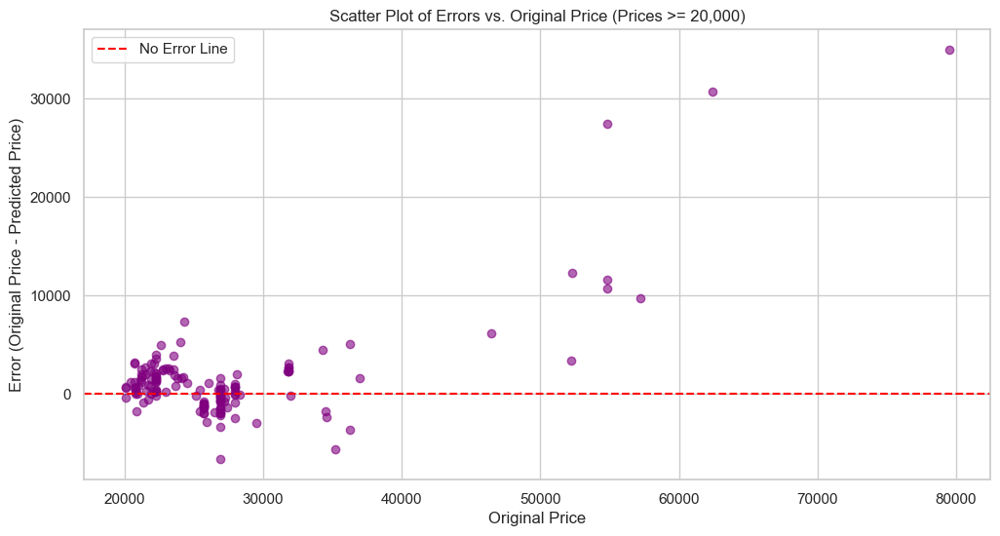

In [225]:
import matplotlib.pyplot as plt

# Filter the DataFrame for Original_Price >= 20000
filtered_df = df_comparison[df_comparison['Original_Price'] >= 20000]

# Scatter plot of Original_Price vs. Error
plt.figure(figsize=(12, 6))
plt.scatter(filtered_df['Original_Price'], filtered_df['Error'], color='purple', alpha=0.6)

# Adding labels and title
plt.xlabel('Original Price')
plt.ylabel('Error (Original Price - Predicted Price)')
plt.title('Scatter Plot of Errors vs. Original Price (Prices >= 20,000)')
plt.axhline(y=0, color='red', linestyle='--', label='No Error Line')  # Line for zero error

# Adding legend
plt.legend()

# Display the plot
plt.show()


In [226]:
#df_final.to_csv('predicted_data_ATA_&_TPP.csv', index=False)


___


# ~~~~~~~~~ **VISUALIZATION** ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

## **Price Analysis**

### Actual vs Predicted Price by Airlines ScatterPlot

In [227]:
import plotly.express as px

fig = px.scatter(df_final, x='Price', y='Predicted_Price', color='Airline', title='Actual Price vs Predicted Price',
                 labels={'Price': 'Actual Price', 'Predicted_Price': 'Predicted Price'})
fig.update_traces(marker=dict(size=5, opacity=0.7))
fig.show()


### Price distribution by Airline BoxPlot

In [228]:
import plotly.express as px
import plotly.io as pio

# Creating the box plot with 'Source' as an additional hue
fig = px.box(df_final, x='Airline', y='Price', color='Source',
             title='Price Distribution by Airline and Source',
             labels={'Airline': 'Airline', 'Price': 'Price', 'Source': 'Source'})

# Updating the layout for better visualization
fig.update_layout(xaxis_title='Airline', yaxis_title='Price')

# Show the figure
fig.show()

# Save the figure as an HTML file
#pio.write_html(fig, file='price_distribution_by_airline_and_source.html', auto_open=True)


In [229]:
import plotly.io as pio
fig = px.box(df_final, x='Airline', y='Price', color='Airline', title='Price Distribution by Airline',
             labels={'Airline': 'Airline', 'Price': 'Price'})
fig.update_layout(xaxis_title='Airline', yaxis_title='Price')
fig.show()
#pio.write_html(fig, file='price_distribution_by_airline.html', auto_open=True)

### Price Distribution by Source and Destination Pie Diagram

In [230]:
fig = px.sunburst(df_final, path=['Source', 'Destination'], values='Price', color='Price', 
                  color_continuous_scale='Viridis', title='Price Distribution by Source and Destination')
fig.update_traces(marker=dict(line=dict(width=2, color='#FFFFFF')))
fig.show()


### Total Stops vs Duration ScatterPlot

In [231]:
fig = px.scatter(df_final, x='Total_Stops', y='Duration', color='Total_Stops', 
                 color_continuous_scale='Blues', title='Total Stops vs Duration',
                 labels={'Total_Stops': 'Total Stops', 'Duration': 'Duration'})
fig.update_traces(marker=dict(size=5, opacity=0.7))
fig.show()


### Count of Different Duration Values

In [232]:
import plotly.express as px

# Get the value counts of 'Duration'
duration_counts = df['Total_Duration_Minutes'].value_counts()

# Convert the Series to a DataFrame for better visualization with Plotly
duration_counts_df = duration_counts.reset_index()
duration_counts_df.columns = ['Duration', 'Count']

# Create the bar plot with Plotly, using the 'Duration' as the color
fig = px.bar(duration_counts_df, 
             x='Duration', 
             y='Count', 
             title='Count of Different Duration Values',
             labels={'Duration': 'Duration (Hours and Minutes)', 'Count': 'Number of Flights'},
             text_auto=True,
             color='Duration',  # This adds the multi-color effect
             color_continuous_scale='Viridis')  # You can choose different color scales here

# Update layout for better readability
fig.update_layout(
    xaxis=dict(title='Duration', tickangle=-45, categoryorder='total descending'),
    yaxis=dict(title='Count')
)

# Show the plot
fig.show()


### Price Trend Over Time LinePlot

In [233]:
df_final['Date_of_Journey'] = pd.to_datetime(df_final['Date_of_Journey'], format='%d/%m/%Y')

fig = px.line(df_final, x='Date_of_Journey', y='Price', color='Airline', 
              title='Price Trend Over Time', labels={'Date_of_Journey': 'Date of Journey', 'Price': 'Price'})
fig.update_layout(xaxis_title='Date of Journey', yaxis_title='Price')
fig.show()


### Comparison of Actual vs Predicted Prices by Airline BarPlot

In [234]:
df_comparison = df_final.groupby('Airline').agg({'Price': 'mean', 'Predicted_Price': 'mean'}).reset_index()
fig = px.bar(df_comparison, x='Airline', y=['Price', 'Predicted_Price'], color='variable', 
             title='Comparison of Actual vs Predicted Prices by Airline',
             labels={'value': 'Price', 'variable': 'Price Type'})
fig.update_layout(xaxis_title='Airline', yaxis_title='Average Price')
fig.show()


### Price Distribution by Total Stops Histogam

In [235]:
fig = px.histogram(df_final, x='Price', color='Total_Stops', 
                   color_discrete_sequence=px.colors.qualitative.Plotly, 
                   title='Price Distribution by Total Stops',
                   labels={'Price': 'Price', 'Total_Stops': 'Total Stops'})
fig.update_layout(xaxis_title='Price', yaxis_title='Count')
fig.show()


### Flights Departure count per H0ur HIstogram

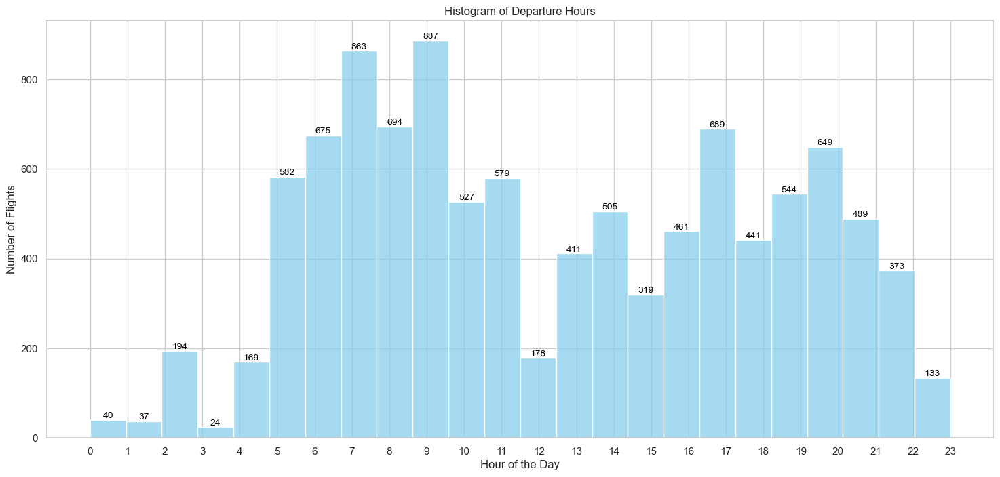

In [236]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Assuming 'Dep_Time' is in datetime format
df_final['Dep_Time'] = pd.to_datetime(df_final['Dep_Time'], format='%H:%M')  # Adjust format as needed
df_final['Dep_Hour'] = df_final['Dep_Time'].dt.hour

# Plotting
plt.figure(figsize=(18, 8))  # Adjusted size for better readability
hist_plot = sns.histplot(df_final['Dep_Hour'], bins=24, kde=False, color='skyblue')

# Add counts above each bar
for patch in hist_plot.patches:
    height = patch.get_height()
    plt.text(patch.get_x() + patch.get_width() / 2, height, int(height), 
             ha='center', va='bottom', fontsize=10, color='black')

plt.title('Histogram of Departure Hours')
plt.xlabel('Hour of the Day')
plt.ylabel('Number of Flights')
plt.xticks(range(24))  
plt.grid(True)

plt.show()


### Average Price vs Departure Hour LinePlot

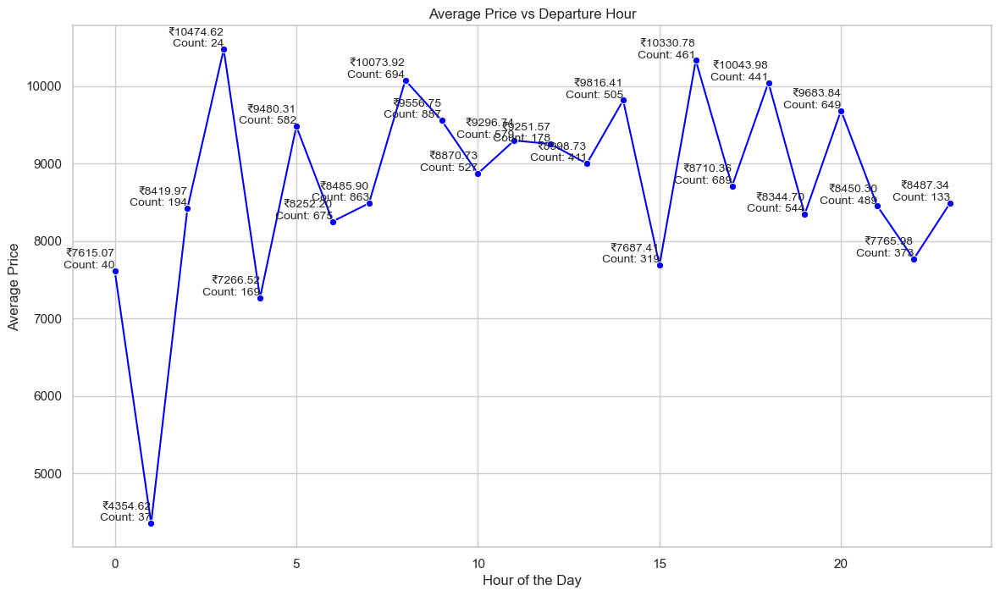

In [237]:
avg_price_by_hour = df_final.groupby('Dep_Hour').agg({'Price': 'mean', 'Dep_Time': 'count'}).reset_index()
avg_price_by_hour.rename(columns={'Dep_Time': 'Count'}, inplace=True)

# Plotting
plt.figure(figsize=(14, 8))
sns.lineplot(data=avg_price_by_hour, x='Dep_Hour', y='Price', marker='o', color='blue')

# Annotate each point with the average price and count
for i in range(avg_price_by_hour.shape[0]):
    plt.text(avg_price_by_hour['Dep_Hour'][i], avg_price_by_hour['Price'][i], 
             f'₹{avg_price_by_hour["Price"][i]:.2f}\nCount: {avg_price_by_hour["Count"][i]}',
             fontsize=10, ha='right', va='bottom')

plt.title('Average Price vs Departure Hour')
plt.xlabel('Hour of the Day')
plt.ylabel('Average Price')
plt.grid(True)

plt.show()

___
## **Route**


### Average Price by Route

In [238]:
import plotly.express as px
import plotly.graph_objects as go

# Calculate average price by route
route_avg_price = df_final.groupby('Route')['Price'].mean().reset_index()

# Create a bar chart with Plotly Express
fig = px.bar(route_avg_price, x='Route', y='Price', 
             title='Average Price by Route',
             labels={'Route': 'Route', 'Price': 'Average Price'},
             color_discrete_sequence=['blue'])  # Default color for bars

# Add a threshold line at 15,000
fig.add_shape(
    type='line',
    x0=-0.5, x1=len(route_avg_price)-0.5,
    y0=15000, y1=15000,
    line=dict(color='Red', width=2, dash='dash')
)

# Manually update the color of the bars
colors = route_avg_price['Price'].apply(lambda x: 'Red' if x > 15000 else 'blue').tolist()
fig.update_traces(marker_color=colors)

# Update layout
fig.update_layout(
    xaxis_title='Route',
    yaxis_title='Average Price',
    xaxis_tickangle=-45
)

fig.show()


In [239]:
rf= df_final.copy()

In [240]:
#!pip install folium

In [241]:
import pandas as pd
import folium
from folium import plugins


In [242]:
city_coords = {
    'DEL': (28.6273928, 77.1716954),
    'UDR': (24.5854, 73.7125),
    'IMF': (24.8171, 93.9368),
    'HBX': (15.3625, 75.1248),
    'HYD': (17.385044, 78.486671),
    'AMD': (23.022505, 72.571362),
    'IXA': (23.8358, 91.2861),
    'JDH': (26.2389, 73.0243),
    'GAU': (26.1445, 91.7362),
    'STV': (21.1702, 72.8311),
    'IXR': (23.3441, 85.3096),
    'PNQ': (18.5204, 73.8567),
    'BOM': (19.076090, 72.877426),
    'BBI': (20.296059, 85.818954),
    'IDR': (22.7196, 75.8577),
    'GWL': (26.2183, 78.1828),
    'DED': (30.3165, 78.0322),
    'NAG': (21.1458, 79.0882),
    'IXB': (26.6981, 88.6115),
    'VTZ': (17.6868, 83.2185),
    'BDQ': (22.3039, 73.1812),
    'COK': (9.9674, 76.2454),
    'TRV': (8.5241, 76.9366),
    'NDC': (18.0313, 77.4545),
    'BHO': (23.1815, 77.4102),
    'IXC': (30.7333, 76.7794),
    'KNU': (27.5578, 80.3467),
    'IXZ': (24.8075, 93.0364),
    'PAT': (25.5941, 85.1376),
    'IXU': (24.5854, 73.7125),
    'MAA': (13.0827, 80.2707),
    'GOI': (15.2993, 74.1240),
    'JLR': (23.1815, 79.9553),
    'RPR': (21.2514, 81.6296),
    'VNS': (25.3176, 82.9739),
    'LKO': (26.8467, 80.9462),
    'ATQ': (31.6340, 74.8723),
    'VGA': (16.5062, 80.6480),
    'CCU': (22.5726, 88.3639),
    'ISK': (26.9157, 70.9160),
    'BLR': (12.9716, 77.5946),
    'JAI': (26.9124, 75.7873)
}


In [243]:
def get_coordinates(city):
    return city_coords.get(city, (None, None))

def extract_cities(route):
    return [city.strip() for city in route.split('→')]

rf['Cities'] = rf['Route'].apply(extract_cities)


In [244]:
def get_coordinates(city):
    return city_coords.get(city, (None, None))
def map_coordinates(cities):
    return [get_coordinates(city) for city in cities]

# Apply the function to the 'Cities' column
rf['Cities_coords'] = rf['Cities'].apply(map_coordinates)


In [245]:
rf

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price,Predicted_Price,Dep_Hour,Cities,Cities_coords
0,IndiGo,2019-03-24,Banglore,New Delhi,BLR → DEL,1900-01-01 22:20:00,01:10 22 Mar,2h 50m,non-stop,Null,3897,3795.0,22,"[BLR, DEL]","[(12.9716, 77.5946), (28.6273928, 77.1716954)]"
1,Air India,2019-05-01,Kolkata,Banglore,CCU → IXR → BBI → BLR,1900-01-01 05:50:00,13:15,7h 25m,2 stops,Null,7662,7848.0,5,"[CCU, IXR, BBI, BLR]","[(22.5726, 88.3639), (23.3441, 85.3096), (20.2..."
2,Jet Airways,2019-06-09,Delhi,Cochin,DEL → LKO → BOM → COK,1900-01-01 09:25:00,04:25 10 Jun,19h,2 stops,Null,13882,13961.0,9,"[DEL, LKO, BOM, COK]","[(28.6273928, 77.1716954), (26.8467, 80.9462),..."
3,IndiGo,2019-05-12,Kolkata,Banglore,CCU → NAG → BLR,1900-01-01 18:05:00,23:30,5h 25m,1 stop,Null,6218,6111.0,18,"[CCU, NAG, BLR]","[(22.5726, 88.3639), (21.1458, 79.0882), (12.9..."
4,IndiGo,2019-03-01,Banglore,New Delhi,BLR → NAG → DEL,1900-01-01 16:50:00,21:35,4h 45m,1 stop,Null,13302,11943.0,16,"[BLR, NAG, DEL]","[(12.9716, 77.5946), (21.1458, 79.0882), (28.6..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10678,Air Asia,2019-04-09,Kolkata,Banglore,CCU → BLR,1900-01-01 19:55:00,22:25,2h 30m,non-stop,Null,4107,4380.0,19,"[CCU, BLR]","[(22.5726, 88.3639), (12.9716, 77.5946)]"
10679,Air India,2019-04-27,Kolkata,Banglore,CCU → BLR,1900-01-01 20:45:00,23:20,2h 35m,non-stop,Null,4145,4330.0,20,"[CCU, BLR]","[(22.5726, 88.3639), (12.9716, 77.5946)]"
10680,Jet Airways,2019-04-27,Banglore,Delhi,BLR → DEL,1900-01-01 08:20:00,11:20,3h,non-stop,Null,7229,7057.0,8,"[BLR, DEL]","[(12.9716, 77.5946), (28.6273928, 77.1716954)]"
10681,Vistara,2019-03-01,Banglore,New Delhi,BLR → DEL,1900-01-01 11:30:00,14:10,2h 40m,non-stop,Null,12648,11322.0,11,"[BLR, DEL]","[(12.9716, 77.5946), (28.6273928, 77.1716954)]"


In [246]:
rf['Route'].unique()

array(['BLR → DEL', 'CCU → IXR → BBI → BLR', 'DEL → LKO → BOM → COK',
       'CCU → NAG → BLR', 'BLR → NAG → DEL', 'CCU → BLR',
       'BLR → BOM → DEL', 'DEL → BOM → COK', 'DEL → BLR → COK',
       'MAA → CCU', 'CCU → BOM → BLR', 'DEL → AMD → BOM → COK',
       'DEL → PNQ → COK', 'DEL → CCU → BOM → COK', 'BLR → COK → DEL',
       'DEL → IDR → BOM → COK', 'DEL → LKO → COK',
       'CCU → GAU → DEL → BLR', 'DEL → NAG → BOM → COK',
       'CCU → MAA → BLR', 'DEL → HYD → COK', 'CCU → HYD → BLR',
       'DEL → COK', 'CCU → DEL → BLR', 'BLR → BOM → AMD → DEL',
       'BOM → DEL → HYD', 'DEL → MAA → COK', 'BOM → HYD',
       'DEL → BHO → BOM → COK', 'DEL → JAI → BOM → COK',
       'DEL → ATQ → BOM → COK', 'DEL → JDH → BOM → COK',
       'CCU → BBI → BOM → BLR', 'BLR → MAA → DEL',
       'DEL → GOI → BOM → COK', 'DEL → BDQ → BOM → COK',
       'CCU → JAI → BOM → BLR', 'CCU → BBI → BLR', 'BLR → HYD → DEL',
       'DEL → TRV → COK', 'CCU → IXR → DEL → BLR',
       'DEL → IXU → BOM → COK', 'CCU 

In [247]:
import folium

# Function to create a map with routes
def create_map(cities_coords):
    # Initialize the map with the location of the first city
    m = folium.Map(location=cities_coords[0], zoom_start=5)
    
    # Add markers for each city
    for coord in cities_coords:
        folium.Marker(location=coord).add_to(m)
    
    # Add lines connecting the cities
    if len(cities_coords) > 1:
        folium.PolyLine(locations=cities_coords, color='blue', weight=2.5, opacity=1).add_to(m)
    
    return m

# Example: Visualizing the coordinates for the first row
example_coords = rf.iloc[0]['Cities_coords']
map_ = create_map(example_coords)
#map_.save('route_map.html')


#### Route with Max Stops

In [248]:
rf[rf['Route']=='BLR → CCU → BBI → HYD → VGA → DEL']

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price,Predicted_Price,Dep_Hour,Cities,Cities_coords
9182,Air India,2019-03-01,Banglore,New Delhi,BLR → CCU → BBI → HYD → VGA → DEL,1900-01-01 05:50:00,11:20 02 Mar,29h 30m,4 stops,Change airports,17686,18441.0,5,"[BLR, CCU, BBI, HYD, VGA, DEL]","[(12.9716, 77.5946), (22.5726, 88.3639), (20.2..."


In [249]:
rf.loc[9182]

Airline                                                    Air India
Date_of_Journey                                  2019-03-01 00:00:00
Source                                                      Banglore
Destination                                                New Delhi
Route                              BLR → CCU → BBI → HYD → VGA → DEL
Dep_Time                                         1900-01-01 05:50:00
Arrival_Time                                            11:20 02 Mar
Duration                                                     29h 30m
Total_Stops                                                  4 stops
Additional_Info                                      Change airports
Price                                                          17686
Predicted_Price                                              18441.0
Dep_Hour                                                           5
Cities                                [BLR, CCU, BBI, HYD, VGA, DEL]
Cities_coords      [(12.9716, 77.5

In [250]:
# Example: Visualizing the coordinates for the first row
print('~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~ Route with Max Stops ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~')
example_coords = rf.loc[9182]['Cities_coords']
map_ = create_map(example_coords)
#map_.save('route_map.html')
display(map_)
print('~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~ Route with Max Stops ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~')


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~ Route with Max Stops ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~ Route with Max Stops ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


#### Longest Route  39h 5m

In [251]:
rf[rf['Duration']=='39h 5m']

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price,Predicted_Price,Dep_Hour,Cities,Cities_coords
6321,Air India,2019-03-01,Banglore,New Delhi,BLR → BOM → AMD → DEL,1900-01-01 08:50:00,23:55 02 Mar,39h 5m,2 stops,Null,17135,17862.0,8,"[BLR, BOM, AMD, DEL]","[(12.9716, 77.5946), (19.07609, 72.877426), (2..."


In [252]:
rf.loc[6321]

Airline                                                    Air India
Date_of_Journey                                  2019-03-01 00:00:00
Source                                                      Banglore
Destination                                                New Delhi
Route                                          BLR → BOM → AMD → DEL
Dep_Time                                         1900-01-01 08:50:00
Arrival_Time                                            23:55 02 Mar
Duration                                                      39h 5m
Total_Stops                                                  2 stops
Additional_Info                                                 Null
Price                                                          17135
Predicted_Price                                              17862.0
Dep_Hour                                                           8
Cities                                          [BLR, BOM, AMD, DEL]
Cities_coords      [(12.9716, 77.5

In [253]:
# Example: Visualizing the coordinates for the first row
print('~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~ Longest Route 39h 5m ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~')
example_coords = rf.loc[6321]['Cities_coords']
map_ = create_map(example_coords)
#map_.save('route_map.html')
display(map_)
print('~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~ Longest Route 39h 5m ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~')

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~ Longest Route 39h 5m ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~ Longest Route 39h 5m ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


#### 2nd Longest Route  36h 25m

In [254]:
rf[rf['Duration']=='36h 25m']

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price,Predicted_Price,Dep_Hour,Cities,Cities_coords
1791,Air India,2019-03-21,Delhi,Cochin,DEL → CCU → BOM → COK,1900-01-01 06:50:00,19:15 22 Mar,36h 25m,2 stops,Null,10756,12366.0,6,"[DEL, CCU, BOM, COK]","[(28.6273928, 77.1716954), (22.5726, 88.3639),..."


In [255]:
# Example: Visualizing the coordinates for the first row
print('~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~ 2nd Longest Route 36h 25m ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~')
example_coords = rf.loc[1791]['Cities_coords']
map_ = create_map(example_coords)
#map_.save('route_map.html')
display(map_)
print('~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~ 2nd Longest Route 36h 25m ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~')

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~ 2nd Longest Route 36h 25m ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~ 2nd Longest Route 36h 25m ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


#### 3rd Longest Route 34h

In [256]:
rf[rf['Duration']=='34h']

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price,Predicted_Price,Dep_Hour,Cities,Cities_coords
3152,Jet Airways,2019-03-21,Delhi,Cochin,DEL → BDQ → BOM → COK,1900-01-01 18:25:00,04:25 23 Mar,34h,2 stops,Null,12347,12628.0,18,"[DEL, BDQ, BOM, COK]","[(28.6273928, 77.1716954), (22.3039, 73.1812),..."


In [257]:
# Example: Visualizing the coordinates for the first row
print('~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~ 3rd Longest Route 34h ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~')
example_coords = rf.loc[3152]['Cities_coords']
map_ = create_map(example_coords)
#map_.save('route_map.html')
display(map_)
print('~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~ 3rd Longest Route 34h ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~')

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~ 3rd Longest Route 34h ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~ 3rd Longest Route 34h ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


#### Costliest Route

In [258]:
rf[rf['Price']>50000]

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price,Predicted_Price,Dep_Hour,Cities,Cities_coords
657,Jet Airways Business,2019-03-01,Banglore,New Delhi,BLR → BOM → DEL,1900-01-01 05:45:00,10:45,5h,1 stop,Null,52229,48836.0,5,"[BLR, BOM, DEL]","[(12.9716, 77.5946), (19.07609, 72.877426), (2..."
1478,Jet Airways,2019-03-18,Banglore,New Delhi,BLR → BOM → DEL,1900-01-01 18:40:00,00:45 16 Mar,6h 5m,1 stop,Null,54826,44177.0,18,"[BLR, BOM, DEL]","[(12.9716, 77.5946), (19.07609, 72.877426), (2..."
2618,Jet Airways,2019-03-18,Banglore,New Delhi,BLR → BOM → DEL,1900-01-01 22:50:00,05:05 16 Mar,6h 15m,1 stop,Null,54826,27445.0,22,"[BLR, BOM, DEL]","[(12.9716, 77.5946), (19.07609, 72.877426), (2..."
2924,Jet Airways Business,2019-03-01,Banglore,New Delhi,BLR → BOM → DEL,1900-01-01 05:45:00,11:25,5h 40m,1 stop,Business class,79512,44594.0,5,"[BLR, BOM, DEL]","[(12.9716, 77.5946), (19.07609, 72.877426), (2..."
5372,Jet Airways Business,2019-03-01,Banglore,New Delhi,BLR → BOM → DEL,1900-01-01 05:45:00,12:25,6h 40m,1 stop,Business class,62427,31765.0,5,"[BLR, BOM, DEL]","[(12.9716, 77.5946), (19.07609, 72.877426), (2..."
5439,Jet Airways,2019-03-01,Banglore,New Delhi,BLR → BOM → DEL,1900-01-01 16:55:00,23:00,6h 5m,1 stop,Null,54826,43252.0,16,"[BLR, BOM, DEL]","[(12.9716, 77.5946), (19.07609, 72.877426), (2..."
9715,Jet Airways Business,2019-03-06,Delhi,Cochin,DEL → ATQ → BOM → COK,1900-01-01 20:05:00,04:25 07 Mar,8h 20m,2 stops,Null,52285,40011.0,20,"[DEL, ATQ, BOM, COK]","[(28.6273928, 77.1716954), (31.634, 74.8723), ..."
10364,Jet Airways Business,2019-03-01,Banglore,New Delhi,BLR → MAA → DEL,1900-01-01 09:45:00,14:25,4h 40m,1 stop,Business class,57209,47517.0,9,"[BLR, MAA, DEL]","[(12.9716, 77.5946), (13.0827, 80.2707), (28.6..."


In [259]:
rf.loc[2924]

Airline                                         Jet Airways Business
Date_of_Journey                                  2019-03-01 00:00:00
Source                                                      Banglore
Destination                                                New Delhi
Route                                                BLR → BOM → DEL
Dep_Time                                         1900-01-01 05:45:00
Arrival_Time                                                   11:25
Duration                                                      5h 40m
Total_Stops                                                   1 stop
Additional_Info                                       Business class
Price                                                          79512
Predicted_Price                                              44594.0
Dep_Hour                                                           5
Cities                                               [BLR, BOM, DEL]
Cities_coords      [(12.9716, 77.5

In [260]:
# Example: Visualizing the coordinates for the first row
print('~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~ Costliest Route ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~')
example_coords = rf.loc[2924]['Cities_coords']
map_ = create_map(example_coords)
#map_.save('route_map.html')
display(map_)
print('~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~ Costliest Route ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~')

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~ Costliest Route ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~ Costliest Route ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


In [261]:
# import folium

# # Function to create a combined map with all routes
# def create_combined_map(df):
#     # Initialize the map with a central location (mean of all coordinates)
#     all_coords = [coord for coords in df['Cities_coords'] for coord in coords if coord]
#     if not all_coords:
#         raise ValueError("No coordinates found in the DataFrame.")
    
#     # Calculate the mean location for initial map view
#     mean_location = [sum(coord[0] for coord in all_coords) / len(all_coords),
#                      sum(coord[1] for coord in all_coords) / len(all_coords)]
#     m = folium.Map(location=mean_location, zoom_start=5)
    
#     # Add markers and routes for each row
#     for _, row in df.iterrows():
#         coords = row['Cities_coords']
#         if coords:
#             # Add markers
#             for coord in coords:
#                 folium.Marker(location=coord).add_to(m)
#             # Add route lines
#             if len(coords) > 1:
#                 folium.PolyLine(locations=coords, color='blue', weight=2.5, opacity=1).add_to(m)
    
#     return m

# # Create and save the combined map with all routes
# combined_map = create_combined_map(rf)
# combined_map.save('combined_route_map.html')


___
# ~~~~~~~~~~~~~ **~~END~~** ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
___

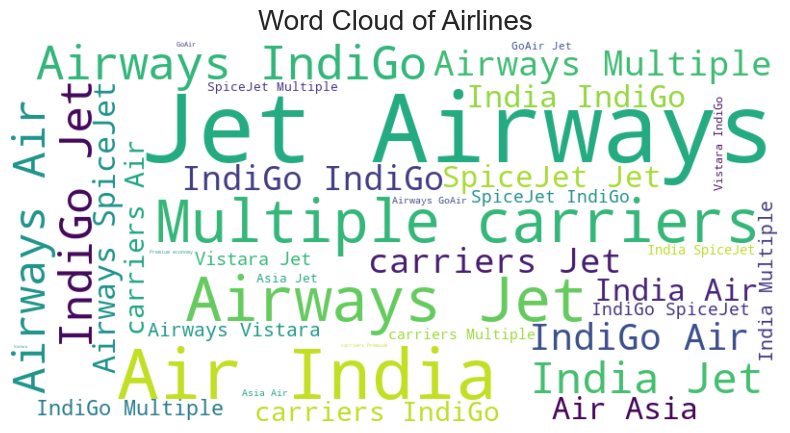

In [262]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud

# Combine all the airline names into a single string
airlines_text = ' '.join(df_final['Airline'].astype(str))

# Generate the word cloud
wordcloud = WordCloud(width=800, height=400, background_color='white', colormap='viridis').generate(airlines_text)

# Plotting the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')  # No axes
plt.title('Word Cloud of Airlines', fontsize=20)
plt.show()


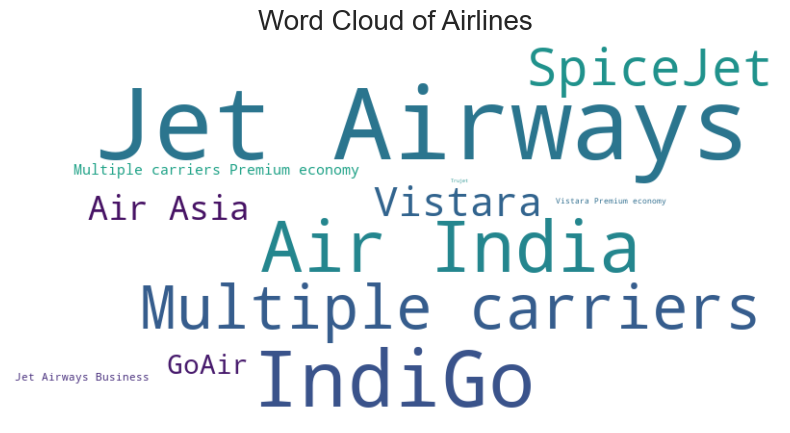

In [263]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud

# Calculate the frequency of each unique airline
airline_freq = df_final['Airline'].value_counts().to_dict()

# Generate the word cloud using the frequency dictionary
wordcloud = WordCloud(width=800, height=400, background_color='white', colormap='viridis').generate_from_frequencies(airline_freq)

# Plotting the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')  # No axes
plt.title('Word Cloud of Airlines', fontsize=20)
plt.show()


In [264]:
import plotly.express as px

fig = px.treemap(df_final, path=['Airline'], values='Price', 
                 title='Treemap of Airlines by Flight Count and Price',
                 color='Price', hover_data=['Airline'], 
                 color_continuous_scale='Viridis')
fig.show()


In [265]:
fig = px.line_polar(df_final, r='Price', theta='Airline', line_close=True,
                    title='Radar Chart of Airlines by Average Price',
                    color_discrete_sequence=px.colors.sequential.Plasma_r)
fig.show()


In [266]:
fig = px.sunburst(df_final, path=['Source', 'Airline'], values='Price', 
                  color='Price', color_continuous_scale='Blues',
                  title='Sunburst Chart of Source and Airline by Price')
fig.show()


In [267]:
import plotly.express as px
import plotly.io as pio
import pandas as pd

# Calculate counts for each Airline within each Source
airline_counts = df_final.groupby(['Source', 'Airline']).size().reset_index(name='Count')

# Create a color scale for Airlines based on their counts
# Map counts to a color scale
color_map = airline_counts.set_index('Airline')['Count'].to_dict()

# Create the sunburst chart
fig = px.sunburst(
    df_final,
    path=['Source', 'Airline'],
    values='Price',
    color='Airline',
    color_discrete_map=color_map,
    color_continuous_scale='Blues',
    title='Sunburst Chart of Source and Airline by Price'
)

# Update layout for better visualization
fig.update_layout(
    coloraxis_colorbar=dict(
        title='Count',
        tickvals=[min(color_map.values()), max(color_map.values())],
        ticktext=['Low', 'High']
    )
)

# Show the figure
fig.show()

# Save the figure as an HTML file
#pio.write_html(fig, file='sunburst_chart_source_airline_price.html', auto_open=True)


In [268]:
import plotly.express as px
import pandas as pd

# Compute counts of each airline by source
airline_counts = df_final.groupby(['Source', 'Airline']).size().reset_index(name='Count')

# Create a bar plot
fig = px.bar(
    airline_counts,
    x='Source',
    y='Count',
    color='Airline',
    title='Counts of Different Airlines by Sources',
    labels={'Source': 'Source', 'Count': 'Count of Airlines'},
    color_discrete_sequence=px.colors.qualitative.Plotly  # Use a qualitative color sequence for distinct colors
)

# Update layout for better readability
fig.update_layout(
    xaxis_title='Source',
    yaxis_title='Count',
    legend_title='Airline',
    xaxis_tickangle=-45,  # Rotate x-axis labels if needed
    coloraxis_colorbar=dict(
        title='Airline',
        tickvals=list(range(len(airline_counts['Airline'].unique()))),
        ticktext=airline_counts['Airline'].unique()
    )
)

# Show the figure
fig.show()

# Save the figure as an HTML file
import plotly.io as pio
#pio.write_html(fig, file='airline_counts_by_source_multicolor.html', auto_open=True)


In [269]:
df_final[df_final.Price==df_final.Price.min()]

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price,Predicted_Price,Dep_Hour
4066,SpiceJet,2019-03-21,Mumbai,Hyderabad,BOM → HYD,1900-01-01 22:45:00,00:10 22 Mar,1h 25m,non-stop,Null,1759,2160.0,22
4274,SpiceJet,2019-03-27,Mumbai,Hyderabad,BOM → HYD,1900-01-01 22:45:00,00:10 28 Mar,1h 25m,non-stop,Null,1759,1991.0,22
4839,SpiceJet,2019-04-03,Mumbai,Hyderabad,BOM → HYD,1900-01-01 22:45:00,00:15 02 Apr,1h 30m,non-stop,Null,1759,1988.0,22
10513,SpiceJet,2019-03-27,Mumbai,Hyderabad,BOM → HYD,1900-01-01 05:45:00,07:05,1h 20m,non-stop,Null,1759,2059.0,5
